# t2i 赛道 · 打分/评估结果审阅

- 数据三件套（都在下方参数区改路径）：题库 `QFILE`、模型产出目录 `RESP_DIR`（`responses_shard*.jsonl` + `imgs/<qid>.png`）、判分产物 `SCORES`（`eval_score.py score` 输出的 `scores.jsonl` + `scores.report.json`）
- **第 2 格 · 整体分析**：始终用全量判分结果（不受过滤器影响），给批次级结论
- **第 3 格 · 逐题明细**：受过滤参数控制（前缀/难度/分段/封顶标志/指定 qid），每题展示 生成图 vs 样本参照图、得分计算链（知识线/通用线 → 封顶 → 总分）、逐 check 的 judge 档位与 rubric 判据、通用维度档位、judge 的分析原文
- 判分口径快照：总分 = 0.7×知识线 + 0.3×通用线（通用线缺失时退化为知识线）；φ 映射 {0→0, 1→60, 2→100}；知识线 <40 熔断封顶 20；任一 critical check 得 0 封顶 20；gate（主体缺失/跑偏）封顶 20
- **判读警告**：judge 未输出的 check 档位会被判分侧按 0 档缺省计入（连锁触发熔断/封顶 → 0 分）。分析格第六节给合规性统计；这类 0 分是「judge 未判」的缺省推定，勿当作模型真实表现
- 配置了对照判分产物 `SCORES_B` 时，分析格第七节给双 judge 对照（总览/逐题 diff/gate 分歧），明细卡头并排两个 judge 的总分
- 纯只读展示，零数据加工；图片内联前会压成 JPEG 控制 notebook 体积

> 运行：菜单 Run All，或逐 Cell 运行。

In [1]:
import json, html as _html
from pathlib import Path

QFILE    = Path('data/synth_gen/questions_v5.jsonl')   # ← 题库
RESP_DIR = Path('data/eval_bagel_v5')                  # ← 模型产出目录
SCORES   = RESP_DIR / 'scores_ctx32k.jsonl'            # ← eval_score.py 判分产物（2026-08-26 修复版：
                                                       #   部署上下文 8192→32768 + extract_json 抗示例污染，30/30 解析成功）
REPORT   = RESP_DIR / 'scores_ctx32k.report.json'
SCORES_B = RESP_DIR / 'scores_gemini-3.1-pro.jsonl'    # ← 对照 judge 产物（不存在/改 '' 则跳过对照）
LABEL_A, LABEL_B = 'qwen3.8-27b(32k)', 'gemini-3.1-pro'   # ← 两侧 judge 名（展示用）

# ====== 过滤参数（只影响第 3 格逐题明细；空列表/None = 不过滤）======
QIDS = []                # 指定 qid 列表，如 ['gpt56-0001-t2i-1']
GENERATORS = []          # qid 前缀：'gpt56' / 'fable' / 'gemini'
DIFFICULTIES = []        # 'L1' / 'L2' / 'L3'
ONLY_FLAGGED = False     # 只看命中 gate / critical / 熔断 的题
ZERO_ONLY = False        # 只看总分 = 0 的题
SCORE_MIN, SCORE_MAX = None, None    # 总分区间（闭区间）
SORT = 'total'           # 'total'（低→高）| 'total_desc' | 'qid'
SHOW_N = 0               # 最多展示几题，0 = 全部
# ==================================================================

def _load_jsonl(p):
    with open(p, encoding='utf-8') as f:
        return [json.loads(l) for l in f if l.strip()]

def _esc(x):
    return _html.escape(str(x))

DIFF_COLOR = {'L1': '#2a7a4b', 'L2': '#b07020', 'L3': '#a33333'}
PHI = {0: 0, 1: 60, 2: 100}

qs = {q['qid']: q for q in (_load_jsonl(QFILE) if QFILE.exists() else [])}
if not qs:
    print(f'!! 题库不存在或为空：{QFILE}')

# 多分片按 qid 合并（后读到的覆盖，最新重跑优先）
recs = {}
if RESP_DIR.exists():
    for f in sorted(RESP_DIR.glob('responses_shard*.jsonl')):
        for l in f.open(encoding='utf-8'):
            if l.strip():
                r = json.loads(l)
                recs[r['qid']] = r

scored = {r['qid']: r for r in (_load_jsonl(SCORES) if SCORES.exists() else [])}
report = json.loads(REPORT.read_text(encoding='utf-8')) if REPORT.exists() else None

scored_b = {}
report_b = None
if SCORES_B and Path(SCORES_B).exists():
    scored_b = {r['qid']: r for r in _load_jsonl(SCORES_B)}
    rep_b_path = Path(SCORES_B).with_suffix('.report.json')
    if rep_b_path.exists():
        report_b = json.loads(rep_b_path.read_text(encoding='utf-8'))

# 全量合并行（分析用）：以判分结果为主轴
rows_all = [{'qid': qid, 'q': qs.get(qid), 'r': recs.get(qid), 's': s,
             's_b': scored_b.get(qid)}
            for qid, s in scored.items()]
unscored = [qid for qid in qs if qid not in scored]

# judge 输出合规性：check_scores 覆盖率（缺失档位按 0 档缺省计入，需与真判区分）
for row in rows_all:
    row['n_checks'] = len((row['q'] or {}).get('implicit_checks') or [])
    row['n_scored'] = len(row['s'].get('check_scores') or {})

def _gen_prefix(qid):
    return qid.split('-')[0]

def _flagged(s):
    return bool(s.get('gate_capped') or s.get('critical_capped') or s.get('knowledge_fused'))

# 过滤 + 排序（明细用）
sel = [row for row in rows_all
       if (not QIDS or row['qid'] in QIDS)
       and (not GENERATORS or _gen_prefix(row['qid']) in GENERATORS)
       and (not DIFFICULTIES or (row['q'] or {}).get('difficulty') in DIFFICULTIES)
       and (not ONLY_FLAGGED or _flagged(row['s']))
       and (not ZERO_ONLY or row['s'].get('total') == 0)
       and (SCORE_MIN is None or row['s'].get('total', 0) >= SCORE_MIN)
       and (SCORE_MAX is None or row['s'].get('total', 0) <= SCORE_MAX)]
sel.sort(key=lambda row: row['qid'])
if SORT in ('total', 'total_desc'):
    sel.sort(key=lambda row: row['s'].get('total') or 0, reverse=(SORT == 'total_desc'))
if SHOW_N:
    sel = sel[:SHOW_N]

print(f'题库 {len(qs)} 题 | 判分 {len(scored)} 题 | 未判分 {len(unscored)} 题'
      + (f'：{unscored[:8]}' if unscored else ''))
if report:
    print(f'报表: n={report.get("n")} overall={report.get("overall")} '
          f'judge_fail={report.get("judge_fail")}')
if scored_b:
    print(f'对照 judge（{LABEL_B}）：{len(scored_b)} 题判分'
          + (f'，overall={report_b.get("overall")}' if report_b else ''))
_n_none = sum(1 for row in rows_all if row['n_checks'] and row['n_scored'] == 0)
_n_part = sum(1 for row in rows_all if 0 < row['n_scored'] < row['n_checks'])
if _n_none or _n_part:
    print(f'⚠ judge 合规性：未输出 checks {_n_none} 题、部分输出 {_n_part} 题'
          f'（缺失档位按 0 档缺省计入，见分析格第六节）')
print(f'明细展示 {len(sel)}/{len(rows_all)} 题（SORT={SORT}）')

题库 30 题 | 判分 30 题 | 未判分 0 题
报表: n=30 overall=46.65 judge_fail=0
对照 judge（gemini-3.1-pro）：30 题判分，overall=35.55
明细展示 30/30 题（SORT=total）


In [2]:
# ---- 整体分析（全量，不受过滤器影响）----
import io, base64
from IPython.display import display, HTML

def _bar(frac, color='#4a7ab5', w=180, h=12):
    frac = max(0.0, min(1.0, frac))
    return (f'<span style="display:inline-block;width:{w}px;height:{h}px;'
            f'background:#eee;vertical-align:middle;margin-right:6px">'
            f'<span style="display:block;width:{int(w*frac)}px;height:{h}px;background:{color}"></span></span>')

def _score_color(v):
    if v is None: return '#999'
    return '#2a7a4b' if v >= 60 else ('#b07020' if v >= 30 else '#a33333')

def _fmt(v, nd=1):
    return '—' if v is None else f'{v:.{nd}f}'

def _mean(vals):
    vals = [v for v in vals if v is not None]
    return sum(vals) / len(vals) if vals else None

def _table(headers, rows_html):
    th = ''.join(f'<th style="padding:3px 8px;text-align:left">{h}</th>' for h in headers)
    trs = ''.join('<tr>' + ''.join(f'<td style="padding:3px 8px">{c}</td>' for c in r) + '</tr>'
                  for r in rows_html)
    return (f'<table style="border-collapse:collapse;font-size:13px;margin:6px 0 14px">'
            f'<tr style="background:#f0f0f0">{th}</tr>{trs}</table>')

html = []
n = len(rows_all)
totals = [row['s'].get('total') for row in rows_all]
html.append('<h2>一、批次总览</h2>')
if report:
    cards = [('题数', report.get('n')), ('总分均值', _fmt(report.get('overall'))),
             ('知识线均值', _fmt(report.get('knowledge'))),
             ('通用线均值', _fmt(report.get('general'))),
             ('judge 失败', report.get('judge_fail'))]
else:
    cards = [('题数', n), ('总分均值', _fmt(_mean(totals))),
             ('知识线均值', _fmt(_mean([row["s"].get("knowledge_score") for row in rows_all]))),
             ('通用线均值', _fmt(_mean([row["s"].get("general_score") for row in rows_all]))),
             ('judge 失败', 0)]
html.append('<div style="display:flex;gap:10px;flex-wrap:wrap;margin:8px 0">' + ''.join(
    f'<div style="border:1px solid #ddd;padding:8px 14px;min-width:88px">'
    f'<div style="font-size:11px;color:#888">{_esc(k)}</div>'
    f'<div style="font-size:20px;font-weight:bold">{_esc(v)}</div></div>'
    for k, v in cards) + '</div>')

# 封顶/熔断命中
n_gate = sum(1 for row in rows_all if row['s'].get('gate_capped'))
n_crit = sum(1 for row in rows_all if row['s'].get('critical_capped'))
n_fuse = sum(1 for row in rows_all if row['s'].get('knowledge_fused'))
n_zero = sum(1 for row in rows_all if row['s'].get('total') == 0)
html.append(f'<div style="font-size:13px;margin:4px 0 12px">封顶/熔断：'
            f'<b style="color:#a33333">gate {n_gate}</b> · '
            f'<b style="color:#a33333">critical {n_crit}</b> · '
            f'<b style="color:#b07020">知识熔断 {n_fuse}</b> · 总分 0 共 <b>{n_zero}</b> 题</div>')

html.append('<h2>二、总分分布</h2>')
buckets = [('=0', lambda t: t == 0), ('(0,20]', lambda t: 0 < t <= 20),
           ('(20,40]', lambda t: 20 < t <= 40), ('(40,60]', lambda t: 40 < t <= 60),
           ('(60,80]', lambda t: 60 < t <= 80), ('(80,100]', lambda t: t > 80)]
mx = 0
cnt = []
for label, fn in buckets:
    c = sum(1 for t in totals if t is not None and fn(t))
    cnt.append((label, c)); mx = max(mx, c)
html.append(_table(['分段', '题数', ''], [
    (label, str(c), _bar(c / mx if mx else 0, '#4a7ab5', 260) +
     ('' if not c else f'{c/n*100:.0f}%')) for label, c in cnt]))

# 分难度看均分
html.append('<h2>三、分组均值</h2>')
def _group_table(title, keyfn):
    groups = {}
    for row in rows_all:
        groups.setdefault(keyfn(row), []).append(row)
    rows = []
    for k in sorted(groups):
        g = groups[k]
        rows.append((
            _esc(k), str(len(g)),
            f'<b style="color:{_score_color(_mean([x["s"].get("total") for x in g]))}">'
            f'{_fmt(_mean([x["s"].get("total") for x in g]))}</b>',
            _fmt(_mean([x['s'].get('knowledge_score') for x in g])),
            _fmt(_mean([x['s'].get('general_score') for x in g])),
            str(sum(1 for x in g if x['s'].get('total') == 0))))
    display(HTML(f'<h3 style="margin:10px 0 2px;font-size:14px">{title}</h3>' + _table(
        ['组', '题数', '总分均值', '知识线', '通用线', '0 分题数'], rows)))

_group_table('按出题模型（qid 前缀）', lambda row: _gen_prefix(row['qid']))
_group_table('按难度', lambda row: (row['q'] or {}).get('difficulty', '?'))
_group_table('按知识维度', lambda row: (row['q'] or {}).get('knowledge_dim', '?'))

html.append('<h2>四、通用维度（facet）表现</h2>')
facet_stats = {}
for row in rows_all:
    for k, v in (row['s'].get('facet_scores') or {}).items():
        if isinstance(v, int) and v in (0, 1, 2):
            facet_stats.setdefault(k, []).append(v)
if facet_stats:
    rows = []
    for k in sorted(facet_stats, key=lambda k: -_mean([PHI[v] for v in facet_stats[k]])):
        vs = facet_stats[k]
        rows.append((_esc(k), str(len(vs)),
                     f'{vs.count(0)} / {vs.count(1)} / {vs.count(2)}',
                     f'<b style="color:{_score_color(_mean([PHI[v] for v in vs]))}">'
                     f'{_fmt(_mean([PHI[v] for v in vs]))}</b>'))
    html.append(_table(['facet', '计分次数', '0/1/2 档分布', 'φ 均分'], rows))
else:
    html.append('<div style="color:#999">无 facet 计分记录</div>')

html.append('<h2>五、知识 check 表现（含 critical 命中）</h2>')
ck_tot = ck_zero = ck_crit = ck_crit_zero = 0
phi_sum = 0.0
for row in rows_all:
    q = row['q']
    if not q:
        continue
    cs = row['s'].get('check_scores') or {}
    for i, c in enumerate(q.get('implicit_checks') or []):
        s = cs.get(str(i), cs.get(i))
        if not (isinstance(s, int) and s in (0, 1, 2)):
            continue
        ck_tot += 1; phi_sum += PHI[s]
        if s == 0: ck_zero += 1
        if c.get('critical'):
            ck_crit += 1
            if s == 0: ck_crit_zero += 1
html.append('<div style="font-size:13px;margin:6px 0">计分 check 共 <b>%d</b> 个，0 档占 <b>%d</b>（%.0f%%），'
            'φ 均分 <b>%.1f</b>；critical check %d 个，其中 0 档 <b style="color:#a33333">%d</b>（%.0f%%）</div>'
            % (ck_tot, ck_zero, ck_zero / ck_tot * 100 if ck_tot else 0,
               phi_sum / ck_tot if ck_tot else 0,
               ck_crit, ck_crit_zero, ck_crit_zero / ck_crit * 100 if ck_crit else 0))

html.append('<h2>六、judge 输出合规性（读懂 0 分的关键）</h2>')
full = [row for row in rows_all if row['n_checks'] and row['n_scored'] == row['n_checks']]
part = [row for row in rows_all if 0 < row['n_scored'] < row['n_checks']]
none_rows = [row for row in rows_all if row['n_checks'] and row['n_scored'] == 0]
html.append(_table(['judge 输出', '题数', '总分均值'], [
    ('✅ checks 全量输出', str(len(full)), _fmt(_mean([row['s'].get('total') for row in full]))),
    ('⚠ 部分输出（缺项按 0 档缺省）', str(len(part)), _fmt(_mean([row['s'].get('total') for row in part]))),
    ('❌ 未输出 knowledge_checks（全部按 0 档缺省）', str(len(none_rows)),
     _fmt(_mean([row['s'].get('total') for row in none_rows])))]))
if none_rows or part:
    html.append('<div style="background:#fdecea;border-left:3px solid #a33333;padding:8px 10px;'
                'font-size:13px;margin:4px 0"><b>⚠ 判读警告</b>：judge（qwen3.8-27b）对 <b>'
                f'{len(none_rows) + len(part)}/{n}</b> 题未按 schema 给出全部 check 档位'
                f'（其中 {len(none_rows)} 题完全没给）。判分侧把缺失档位按 <b>0 档（φ=0）缺省计入</b>，'
                '由此连锁触发知识熔断与 critical 封顶 → 总分 0。<b>这些 0 分是「judge 未判」的缺省推定，'
                '不能当作 Bagel 真没画对的结论</b>；批次结论应以「✅ 全量输出」子集为准，'
                '缺判题建议人工看图复核或重判。</div>')

# ---- 七、双 judge 对照 ----
if scored_b:
    html.append(f'<h2>七、双 judge 对照（{_esc(LABEL_A)} vs {_esc(LABEL_B)}）</h2>')
    def _overview(rep, rows):
        if rep:
            return (rep.get('overall'), rep.get('knowledge'), rep.get('general'),
                    rep.get('gate_capped'), rep.get('knowledge_fused'))
        ts = [r['s'].get('total') for r in rows]
        return (_mean(ts), _mean([r['s'].get('knowledge_score') for r in rows]),
                _mean([r['s'].get('general_score') for r in rows]),
                sum(1 for r in rows if r['s'].get('gate_capped')),
                sum(1 for r in rows if r['s'].get('knowledge_fused')))
    ov_a = _overview(report, rows_all)
    rows_b = [{'s': r['s_b']} for r in rows_all if r.get('s_b')]
    ov_b = _overview(report_b, rows_b)
    html.append(_table(['judge', '总分均值', '知识线', '通用线', 'gate 封顶', '知识熔断'], [
        (_esc(LABEL_A), *(_fmt(v) for v in ov_a[:3]), str(ov_a[3]), str(ov_a[4])),
        (_esc(LABEL_B), *(_fmt(v) for v in ov_b[:3]), str(ov_b[3]), str(ov_b[4]))]))

    qrows = []
    n_close = n_bgate_only = n_rescued = 0
    for row in sorted(rows_all, key=lambda x: x['qid']):
        a, b = row['s'], row.get('s_b') or {}
        ta, tb = a.get('total'), b.get('total')
        diff = None if (ta is None or tb is None) else tb - ta
        if diff is not None and abs(diff) <= 15:
            n_close += 1
        if b.get('gate_capped') and not a.get('gate_capped'):
            n_bgate_only += 1
        if not a.get('check_scores') and b.get('check_scores'):
            n_rescued += 1
        col = '#999' if diff is None else ('#a33333' if abs(diff) > 30 else '#333')
        qrows.append((_esc(row['qid']),
                      f'<span style="color:{_score_color(ta)}">{_fmt(ta)}</span>',
                      f'<span style="color:{_score_color(tb)}">{_fmt(tb)}</span>',
                      f'<span style="color:{col}">{("—" if diff is None else f"{diff:+.1f}")}</span>',
                      '🚫' if a.get('gate_capped') else '',
                      ('🚫 ' + _esc((b.get('gate_reason') or '')[:40])) if b.get('gate_capped') else ''))
    html.append('<div style="font-size:13px;margin:6px 0">'
                f'两判分差 ≤15 的题 <b>{n_close}/{n}</b>；仅 {_esc(LABEL_B)} gate 的题 <b>{n_bgate_only}</b>；'
                f'{_esc(LABEL_A)} 未判而被 {_esc(LABEL_B)} 补判出 check 的题 <b>{n_rescued}</b>'
                '（分歧题请下拉到明细卡人工看图，明细卡头部并排显示两个 judge 的总分）</div>')
    html.append(_table(['qid', _esc(LABEL_A), _esc(LABEL_B), 'diff(B−A)', 'gate A', 'gate B（理由摘要）'],
                       qrows))
display(HTML(''.join(html)))

组,题数,总分均值,知识线,通用线,0 分题数
fable,10,34.3,39.2,73.1,0
gemini,10,51.9,48.2,70.0,0
gpt56,10,53.8,59.0,82.0,0


组,题数,总分均值,知识线,通用线,0 分题数
L1,5,44.2,43.2,86.0,0
L2,15,47.2,47.3,69.3,0
L3,10,47.0,53.8,78.7,0


组,题数,总分均值,知识线,通用线,0 分题数
art_style,3,20.0,22.7,82.2,0
biology_nature,1,67.0,70.0,60.0,0
brand_commercial,3,43.0,45.3,76.7,0
cultural_folk,8,44.2,49.2,60.5,0
film_anime_game,6,38.9,34.7,73.1,0
geo_landmark,1,20.0,20.0,86.7,0
history_event,3,58.4,52.0,100.0,0
physics_commonsense,1,96.0,100.0,86.7,0
religion_myth,1,100.0,100.0,100.0,0
tech_aerospace,3,55.1,70.7,68.9,0


0 档 → φ0 critical w=0.6,0. 阿胶块呈规则扁平的长方形固体板状，颜色为深褐色、黑褐色或透光深琥珀色，质地致密平滑考察知识：[solid] 东阿阿胶块规范形态为整齐长方形固体胶块，质硬致密，色泽黑褐透光泛琥珀色，表面光滑无杂质▶ 0 档：生成为白色药片、软胶囊、液体口服液、散落药粉或混有核桃芝麻的阿胶糕切片1 档：呈深色块状，但形态不规则（如圆丸、碎块泥团）或质感粗糙无胶质光滑感2 档：准确呈现三片整齐扁平的长方形纯色硬质胶块，呈黑褐色/深琥珀色且表面致密光滑允许变体：胶块表面带有传统凸印或烫金印记；胶块边缘在强侧光透射下呈现半透明棕红色光晕 | 最低可见条件：胶块主体完整居中可见，其形状、边缘与表面质感清晰可辨
0 档 → φ0 w=0.4,1. 背景包装盒采用红黑为主色调的长方形盒体设计，符合东阿阿胶经典包装配色考察知识：[solid] 东阿阿胶块传统经典包装采用红黑相间分割的长方形铁盒/硬纸盒形制▶ 0 档：无包装盒，或包装盒为全白、全蓝、全绿等与红黑经典配色完全无关的现代塑料瓶/袋1 档：包装盒呈长方形盒体，但配色仅含红色或黑色其一，未体现经典的红黑搭配2 档：包装盒呈规整长方形盒体，外观明确呈现红黑相间或红黑分块的经典包装视觉特征允许变体：包装盒带有烫金中式边框或传统纹饰；包装盒被胶块部分遮挡但红黑配色与长方盒形制清晰可辨 | 最低可见条件：包装盒在后方可见面积不少于三分之一，配色与盒形可辨

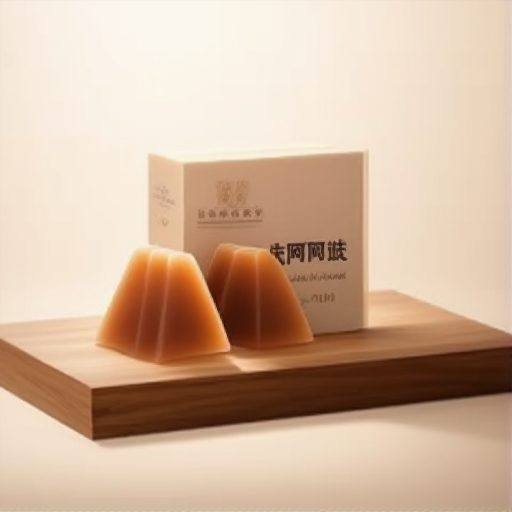
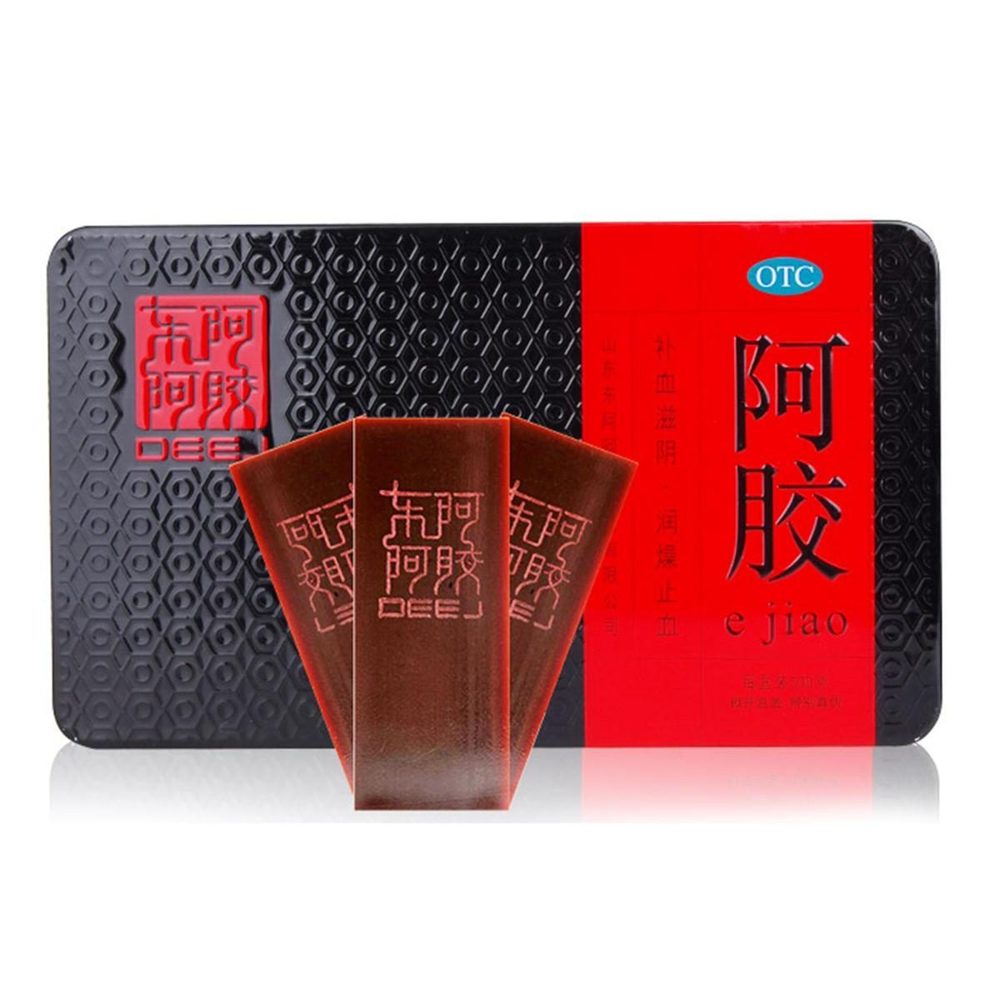

0 档 → φ0 critical w=0.4,0. 卡牌左上角呈现多棱角立体晶体形态的“属性水晶”费用标识框，且晶体内部或其上附带费用数字考察知识：[solid] FFTCG 卡牌左上角标志性元素为多边形切割的水晶造型费用图标，象征系列核心的水晶元素▶ 0 档：左上角无任何费用图标，或呈现为万智牌圆形法术力符号、游戏王星级圆珠、宝可梦能量圆形等非水晶形态1 档：左上角有图标但为扁平圆形/方形色块，未体现出明显的棱面立体晶体/水晶质感2 档：左上角清晰呈现立体多棱角水晶晶体造型的费用符号，且内部或边缘附有数字允许变体：水晶图标略带光效溢出或金属边框包裹，但晶体核心形制清晰可辨；由于视角微偏，水晶内部数字微缩但晶体轮廓完备 | 最低可见条件：卡牌左上角区域无严重遮挡且清晰入画
0 档 → φ0 w=0.3,1. 卡牌右下角印有清晰醒目的大字号 3~4 位整数战斗力量数值（如 7000/8000/9000 等，且无单位符号）考察知识：[solid] FFTCG 前锋（Forward）战斗卡牌右下角统一定位大字号白色/亮色力量数值（Power）▶ 0 档：右下角无任何战斗数值，或误画为“ATK/DEF”双数值组合、带“HP/攻击力”文字标签1 档：右下角存在数字但字号过小、模糊，或数值范围严重偏离（如个位数、两位数）2 档：右下角醒目呈现独立的 3~4 位大字号千位级整数（如 6000、8000 等粗体数字）允许变体：数字末尾为 500 或 000（如 7500 或 8000 等正统 FFTCG 数值形式）；卡面为闪卡工艺导致数值边缘有轻微镭射光晕 | 最低可见条件：卡牌右下角区域完整处于景深清晰范围内
0 档 → φ0 w=0.3,2. 卡面立绘中的角色具备克劳德的经典特征（金黄色尖刺发型、深色单肩铠服饰，且身负或手持巨大的厚重宽刃长剑）考察知识：[solid] 克劳德·斯特莱夫标志性外观为刺猬状金发、深色连体服/单肩背带铠甲，以及矩形厚背宽刃的「破坏剑」▶ 0 档：角色为非金发/长发飘逸人物，或手持细剑/枪械/法杖等完全无关武器1 档：角色具备金发但发型不符，或武器为普通细长单手剑，缺少宽刃破坏剑的厚重特征2 档：角色准确呈现金黄色尖刺短发、标志性深色战斗服，且装备特征鲜明的矩形宽刃巨剑（破坏剑）允许变体：采用《降临之子》合体剑造型或便服造型，但金发刺猬头与巨剑核心特征一致；立绘为半身像，巨剑仅露出标志性的剑柄与护手/部分厚重剑身 | 最低可见条件：卡面角色立绘的上半身及主要武器部件清晰可辨

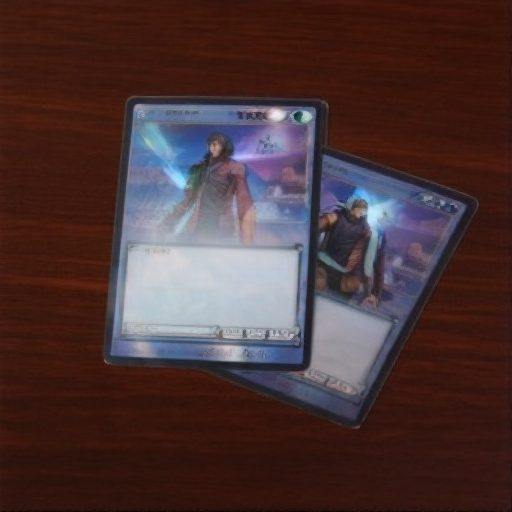
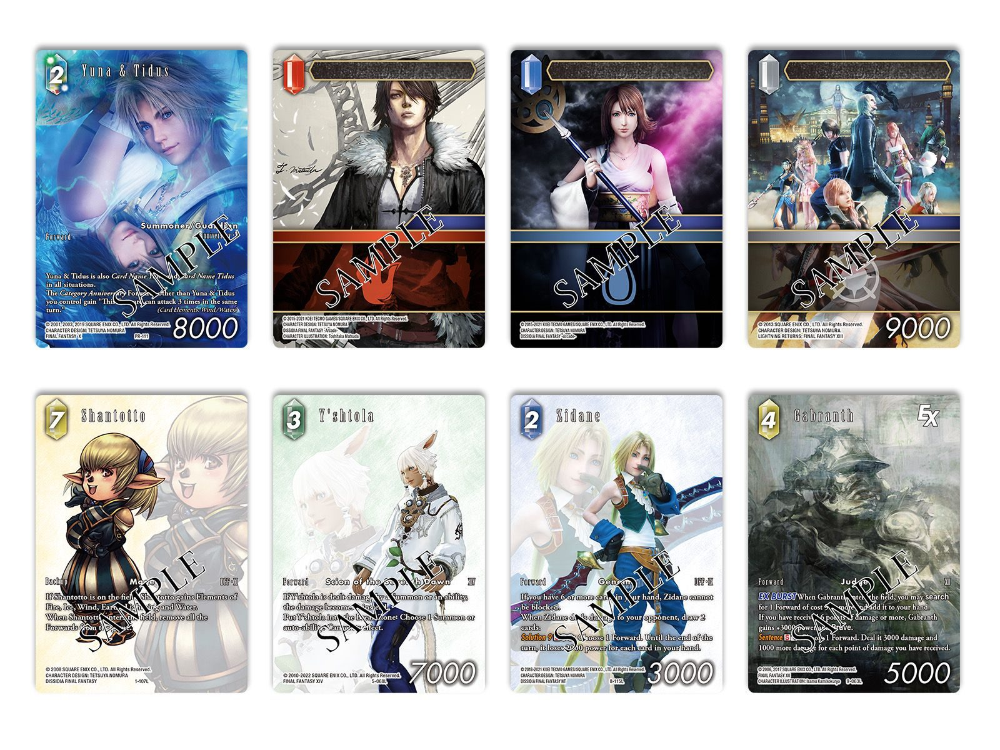

0 档 → φ0 critical w=0.5,0. 人物呈现深肤色非裔男性的面部与肤色特征考察知识：[solid] 杜波依斯为非裔美国人，肤色为深色非裔特征▶ 0 档：人物为浅肤色白人或其他明显非非裔族裔特征的男性，或人物为女性1 档：肤色偏深但族裔特征模糊含混，无法明确辨认为非裔男性2 档：深肤色非裔男性特征清晰明确，面部特征与族裔一致允许变体：黑白胶片影调下肤色以灰阶呈现，但面部特征仍可明确辨认为非裔 | 最低可见条件：人物面部正面或侧面清晰入画且肤色/五官可辨
0 档 → φ0 w=0.3,1. 人物为秃顶（或发际线极高、仅两侧留极短发），蓄灰白色山羊胡式尖胡须，面容清瘦考察知识：[solid] 杜波依斯晚年规范形象为秃顶配灰白山羊胡、面容清瘦，是其最具辨识度的外貌特征▶ 0 档：人物有浓密头发，或无胡须，或蓄络腮大胡等与山羊胡明显不符的胡型1 档：秃顶与山羊胡仅其一符合，另一特征缺失或形态明显不符2 档：秃顶（或极高发际线）与灰白山羊胡式尖胡须两特征同时清晰呈现允许变体：头顶两侧残留极稀疏灰白短发而非完全光头；山羊胡连带唇上短髭（符合其晚年真实胡型） | 最低可见条件：人物头部与下颌区域清晰入画，发际与胡须形态可辨
2 档 → φ100 w=0.2,2. 人物着装为20世纪上半叶正装形制（西装/马甲/领带类），画面内无智能手机、笔记本电脑、平板等现代电子设备，书房陈设无现代办公器物考察知识：[solid] 杜波依斯活跃于19世纪末至20世纪中叶，公开形象一贯为正装，其年代不存在现代电子设备0 档：人物着21世纪休闲装（T恤、连帽衫等），或画面出现智能手机、笔记本电脑、平板、显示器中任一现代电子设备1 档：着装为泛化正装但混入明显现代剪裁细节（如现代修身窄领西装配运动鞋），或书房出现年代可疑但难以确认的器物▶ 2 档：正装形制符合20世纪上半叶特征（宽驳领西装、马甲或领带），书房陈设仅书籍、木质家具等年代兼容器物允许变体：着西装外套未见马甲（两件式正装同样符合年代）；手持眼镜、怀表、钢笔等年代兼容小物 | 最低可见条件：人物上半身着装与书房主要陈设入画可辨

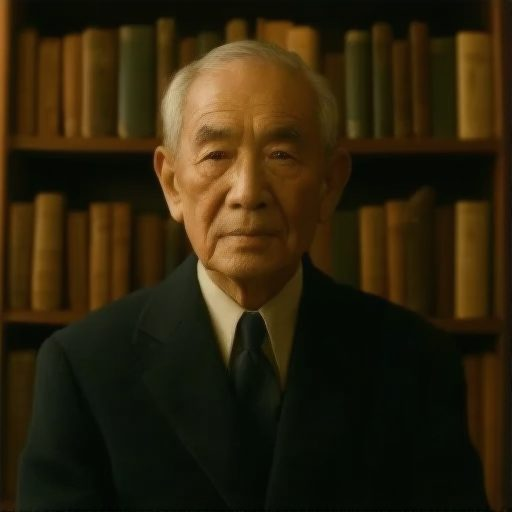
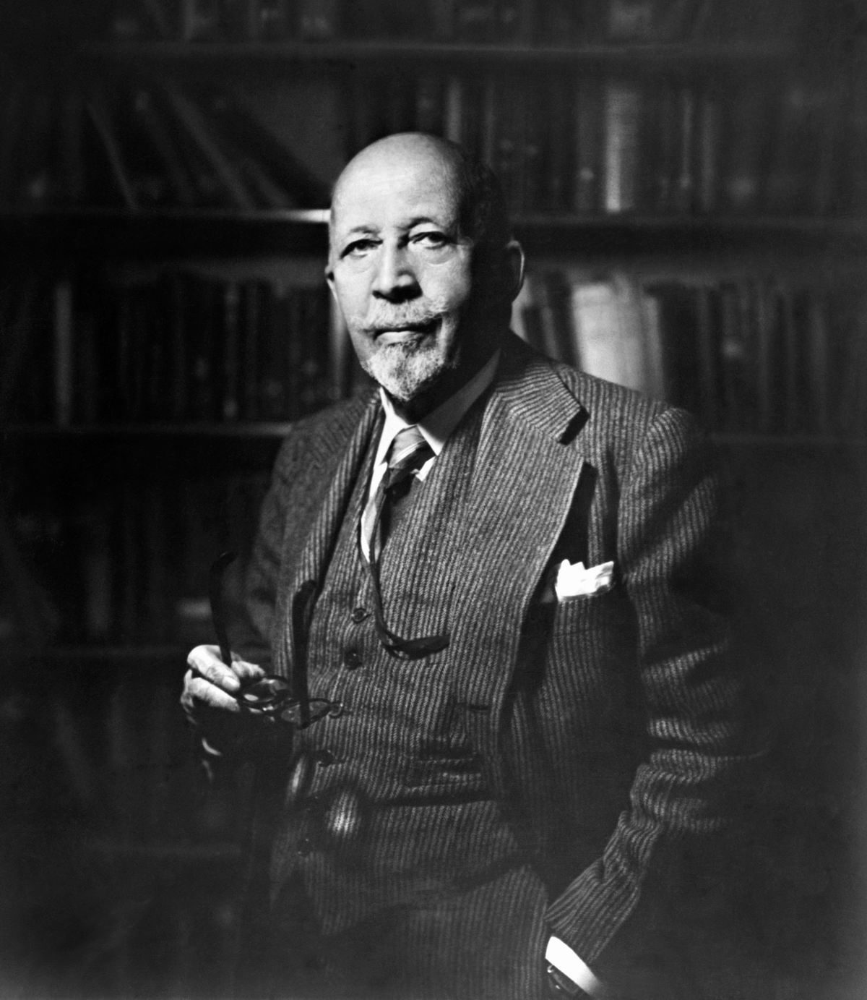

0 档 → φ0 critical w=0.4,0. 斯考尔手中武器为枪刃：剑身与手枪式握把结合，可见扳机、护圈或左轮弹巢等枪械部件考察知识：[solid] 斯考尔的标志性武器为枪刃（gunblade），剑身与左轮手枪式握把/扳机结构一体化，是 FF8 最具辨识度的武器设定▶ 0 档：无武器，或武器为普通长剑/大剑/刀，握把处无任何枪械结构1 档：武器有混合暗示但枪械部件不可辨：如握把异常粗大或形状含混，但无扳机、护圈、弹巢等明确特征2 档：剑身与手枪式握把清晰结合，扳机、护圈或左轮弹巢至少一项可辨允许变体：Revolver 原型（银灰刀身，狮形纹样可有可无）或 Lionheart 版（蓝色刀身）均可；武器垂握、扛肩或指向镜头等任意持握方式，只要握把结构可辨 | 最低可见条件：武器握把区域入画且结构可辨
0 档 → φ0 w=0.3,1. 面部有一道斜向疤痕横跨鼻梁、位于两眼之间考察知识：[solid] 斯考尔面部有一道横跨鼻梁的斜向决斗伤疤，为其面部最具辨识度的特征▶ 0 档：面部无任何疤痕1 档：有疤痕但位置不符：仅在单侧脸颊、额角或下颌，未经过鼻梁与两眼之间区域2 档：一道斜向疤痕清晰经过鼻梁/两眼之间，走向为斜线允许变体：疤痕方向左右镜像均可接受；疤痕颜色较淡但在正面视角下可辨 | 最低可见条件：面部正面或近正面入画，鼻梁区域无遮挡
0 档 → φ0 w=0.3,2. 上身着黑色短夹克，领口带白色或浅色毛领考察知识：[solid] 斯考尔的经典造型为黑色短夹克配白色毛领，是其服装的核心辨识元素▶ 0 档：服装完全不符：无黑色短夹克，或改为铠甲、长袍、风衣等其他形制1 档：有黑色夹克但无毛领，或有毛领但夹克颜色/款式明显不符（如白色长外套）2 档：黑色短夹克与白色/浅色毛领同时呈现且可辨允许变体：毛领呈灰白或米白色调；胸前狮形项链有无均不影响本项判分；夹克敞开露出内搭白色上衣 | 最低可见条件：上身及领口区域入画且服装细节可辨

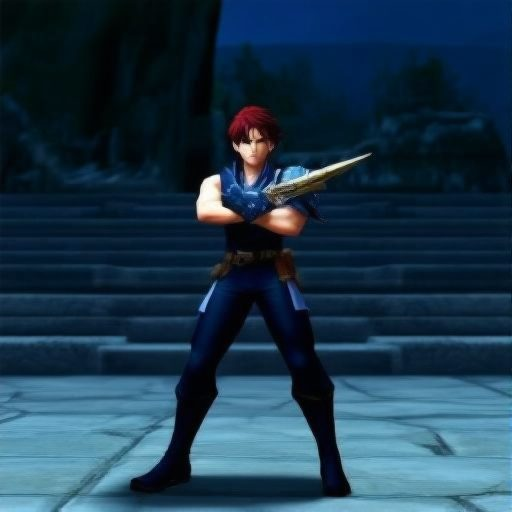
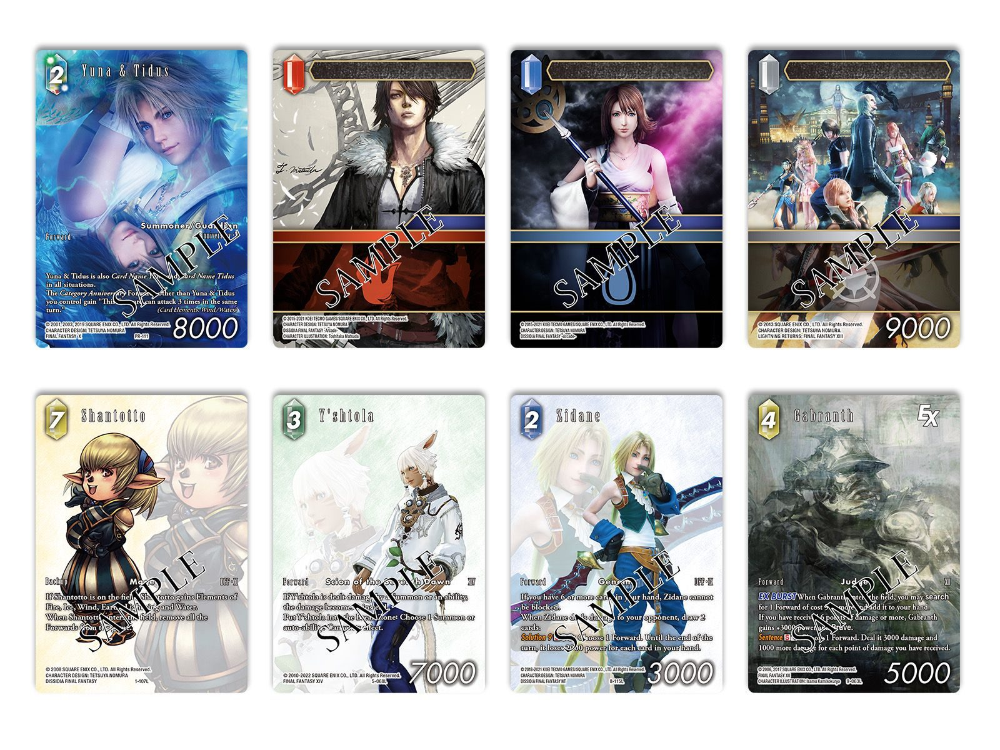

0 档 → φ0 critical w=0.5,0. 谷底被冰川冰体完整填充，无贯通谷地的开阔液态水道，画面中无行驶的船只及船只尾迹考察知识：[solid 规则] 峡湾水道是冰川消退后海水灌入原冰川谷形成的; [prompt 假设] 冰川尚未消退 → [第1步] 谷底应为冰体占据，无海水水道，亦不可能有船只航行▶ 0 档：谷底为贯通的开阔液态水道（如深蓝海水），或画面中出现行驶的船只及尾迹1 档：谷底部分为冰体，但仍存在大面积开阔水面贯通谷地中段，冰水关系混乱2 档：谷底被冰川冰体完整填充占据，无贯通水道，无任何船只与航迹允许变体：冰川末端在画面最远端崩解入海，局部可见冰崖与浮冰，但谷地主体仍为冰体；冰面局部有小面积季节性融水池塘 | 最低可见条件：谷底区域在画面中可见且占可辨面积
0 档 → φ0 w=0.3,1. 谷底冰体呈现真实谷地冰川的表面形态：可见冰裂隙、中碛条带或冰面起伏等特征，而非均匀平滑的纯白平面或水面式镜面反光考察知识：[solid] 谷地冰川因流动应力在表面形成冰裂隙，支冰川汇流处形成中碛条带，冰面有起伏与纹理▶ 0 档：冰面呈均匀平滑的纯白平面，或呈现液态水面式的镜面反光质感1 档：冰面有一定起伏或色彩变化，但无冰裂隙、冰碛条带等可辨认的冰川形态特征2 档：冰面可见冰裂隙、中碛条带、冰瀑或流动纹理中至少一种典型谷地冰川特征允许变体：冰面被新雪覆盖，但仍可辨裂隙或起伏的轮廓阴影；冰面呈蓝白相间的冰川冰色泽 | 最低可见条件：谷底冰体表面占画面可辨面积且质感可判
2 档 → φ100 w=0.2,2. 两侧谷壁与山坡无成片茂密绿色森林，以裸露岩壁、冰雪覆盖或稀疏苔原为主考察知识：[solid 规则] 冰期斯堪的纳维亚气候严寒，树线远低于现代，无茂密温带森林; [prompt 假设] 冰期尚未结束 → [第1步] 谷壁植被应极稀，呈裸岩、冰雪或苔原状0 档：谷壁覆盖成片茂密的绿色森林，呈现现代温带峡湾景象1 档：植被总体稀疏，但仍存在明显成片的绿色树林区域▶ 2 档：谷壁以裸露岩壁、冰雪或稀疏苔原为主，无成片森林允许变体：岩壁间有零星低矮灌木或苔藓状植被；谷壁大部被积雪与冰体覆盖 | 最低可见条件：至少一侧谷壁大部入画且表面覆盖状况可辨

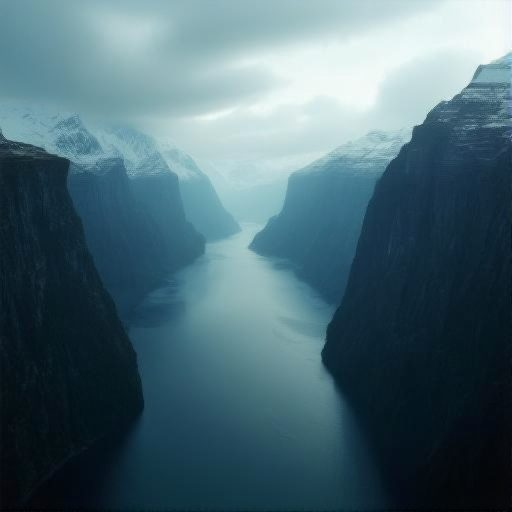
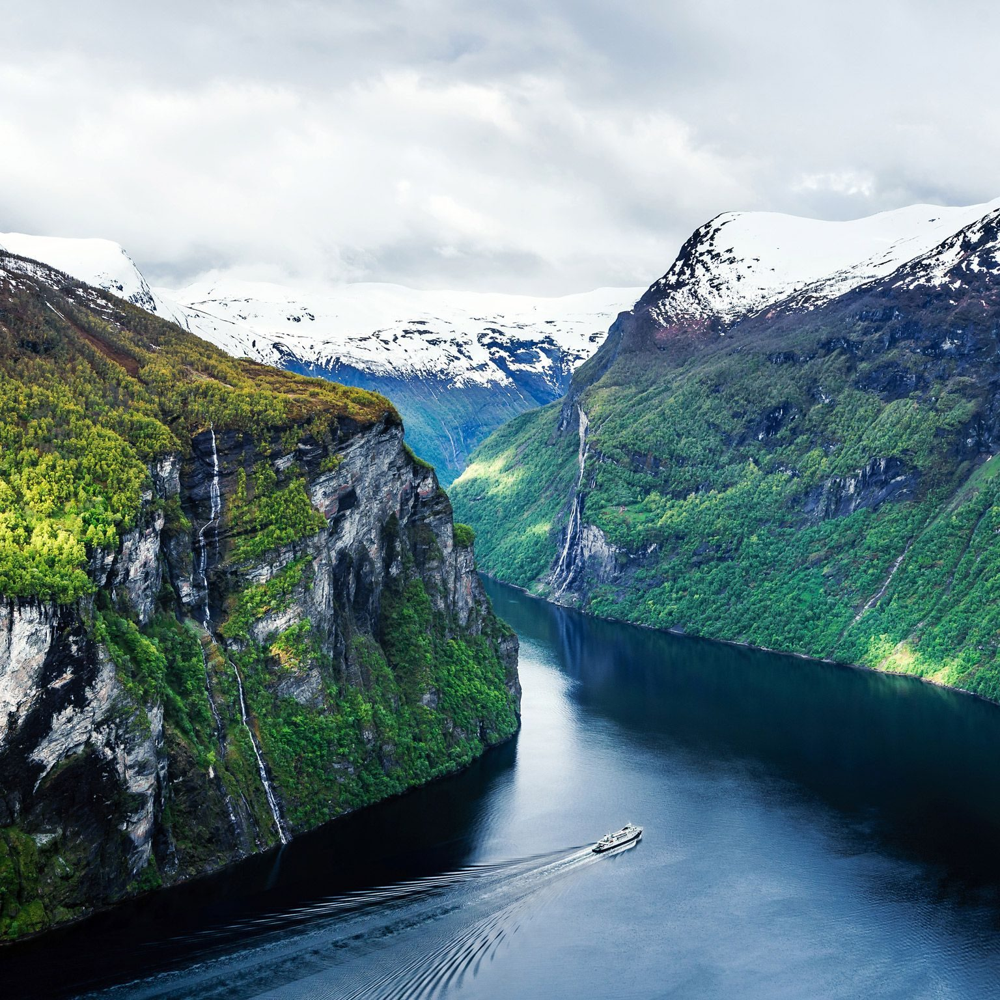

2 档 → φ100 critical w=0.5,0. 空间站呈国际空间站规范形制：中央长桁架横贯，桁架上布置成对的大型矩形太阳能电池翼，中部为多个圆柱形加压舱段串联/交叉，无机翼等气动面考察知识：[solid] ISS由一体化桁架、成对矩形太阳能电池翼与模块化圆柱舱段构成，是无气动面的轨道组合体0 档：无桁架结构，画成单体飞船、带机翼的飞行器、环形/碟形科幻空间站，或仅一个舱体加小天线1 档：有太阳能板与舱段但布局错误：电池板直接贴附舱体、无横贯桁架、电池翼非成对矩形或舱段无模块化串联特征▶ 2 档：长桁架横贯+成对大型矩形电池翼+多个圆柱舱段串联三特征齐备，总体形制符合国际空间站允许变体：不同组装阶段构型：电池翼为2至4对均可接受；因透视视角电池翼被缩短或部分互相遮挡，但成对矩形形制可辨；站体上附带机械臂、散热板等真实附属结构 | 最低可见条件：空间站整体大部入画，桁架与至少一对电池翼可辨
0 档 → φ0 w=0.3,1. 宇航员穿着白色加压舱外航天服，含硬质头盔与面罩，全身覆盖无暴露皮肤考察知识：[solid] 真空环境舱外活动必须穿加压EVA航天服，美制EMU与俄制Orlan均以白色为主体，配头盔面罩，不可有皮肤暴露▶ 0 档：宇航员穿普通衣物、蓝色舱内飞行服、暴露皮肤或仅戴氧气面罩即出舱1 档：有航天服意识但形制错误：深色贴身科幻服、无头盔面罩、服装明显非加压厚重结构2 档：白色加压厚重航天服+头盔与面罩+全身完全覆盖，形制符合真实EVA服允许变体：头盔面罩为金色镀层反光；服装带少量红色/彩色条纹或国旗臂章标识；背部佩戴生命保障背包 | 最低可见条件：宇航员全身或至少上半身占画面可辨面积，服装形制可判
2 档 → φ100 w=0.2,2. 背景太空为纯黑色（可含星点），地球仅作为下方或一侧的天体出现，空间站周围无蓝色天空渐变或云雾环绕考察知识：[solid] 轨道高度无大气散射，即使日照面天空背景也是黑色；蓝色仅出现在地球本体及其边缘薄层大气辉光处0 档：空间站被蓝色天空、大气渐变或云层包裹，如同在大气层内飞行1 档：背景偏深色但存在明显非黑色的整体渐变或弥漫光晕，太空感不纯粹▶ 2 档：背景为纯黑太空，地球以弧线或局部形态出现在画面一侧/下方，界限清晰允许变体：地球弧线边缘可见薄层蓝色大气辉光；画面含少量星点或轻微镜头眩光 | 最低可见条件：背景天空占画面可辨区域且与地球区域可区分

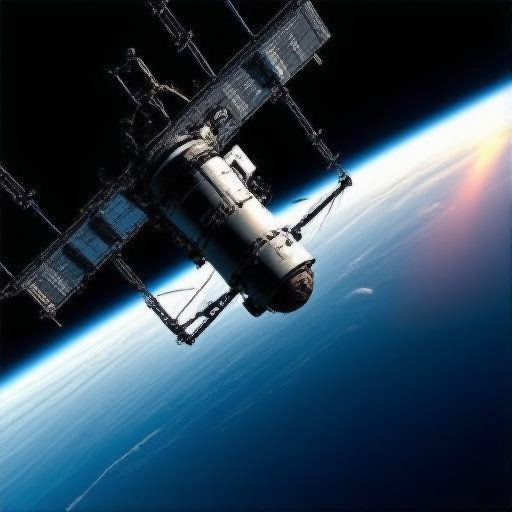
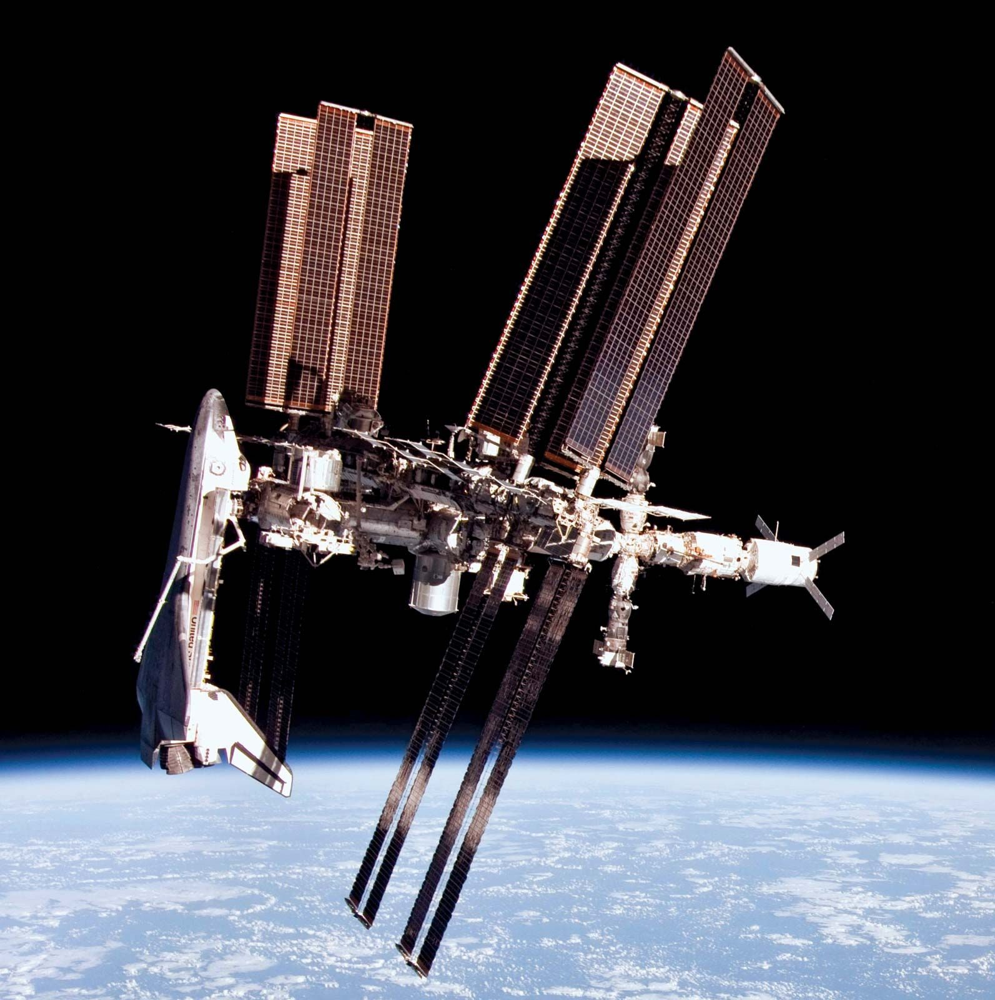

0 档 → φ0 critical w=0.4,0. 盘面彩绘色系以釉上矾红（铁红）与钴蓝为主导，衬白瓷地，可辅以绿、黄或金彩考察知识：[solid] 典型彩绘伊万里瓷的规范色系为矾红与钴蓝主导、白地衬托，常辅绿、黄、金彩▶ 0 档：色系明显偏离：粉彩式粉嫩色调、单色青瓷/白瓷无彩、或通体仅蓝彩无任何红彩1 档：有红蓝两色但主导色调偏离，如大面积紫色、粉色或现代高饱和荧光色混入2 档：矾红与钴蓝为最醒目的两大主色，白地清晰，辅色限于绿、黄、金等传统彩料允许变体：金襕手样式：蓝地或红地面积较大并施浓重金彩，但红蓝主导关系仍可辨；红彩呈偏橙的铁红色调 | 最低可见条件：盘面彩绘区域占画面可辨面积且色彩未被灯光严重偏色
0 档 → φ0 w=0.3,1. 构图为盘心圆形主纹区加盘沿环带纹饰的两层布局，纹饰繁密覆盖盘面大部而非大面积留白考察知识：[solid] 江户外销伊万里大盘的经典装饰程式为盘心主纹区与盘沿纹饰带（常作开光分格）组合，整体繁缛少留白▶ 0 档：无盘心与盘沿的分区结构，或盘面大面积空白仅一处孤立小纹样，呈极简风1 档：有盘心主纹但盘沿装饰缺失或极稀疏，两层布局不完整2 档：盘心主纹区与盘沿纹饰带俱全，纹饰覆盖盘面大部，繁密程度符合外销伊万里程式允许变体：盘沿作分格开光式排布；盘沿作连续缠枝/锦地纹饰带不分格 | 最低可见条件：盘面完整入画且盘心与盘沿区域均可辨
0 档 → φ0 w=0.3,2. 纹饰为毛笔勾线后平涂填彩的东亚工笔画法，题材为花卉草木类，而非西洋油画笔触或照片写实渲染考察知识：[solid] 伊万里彩绘采用勾线填彩的东亚工笔技法，纹样以花卉草木、瓶花盆景等东亚传统题材为主▶ 0 档：纹饰呈西洋油画笔触、照片级写实花卉或几何抽象图案，无勾线填彩特征1 档：题材为东亚花卉但画法混杂，如明显渐变晕染的数字绘画感、轮廓线缺失2 档：清晰的墨色/深色勾线加平涂彩料填色，花卉草木题材，符合工笔彩绘特征允许变体：题材为瓶花、盆景、折枝花卉或花鸟组合均可；局部彩料有轻微浓淡变化但整体仍为平涂填彩 | 最低可见条件：至少一处纹样占画面足够面积可辨认勾线与填彩细节

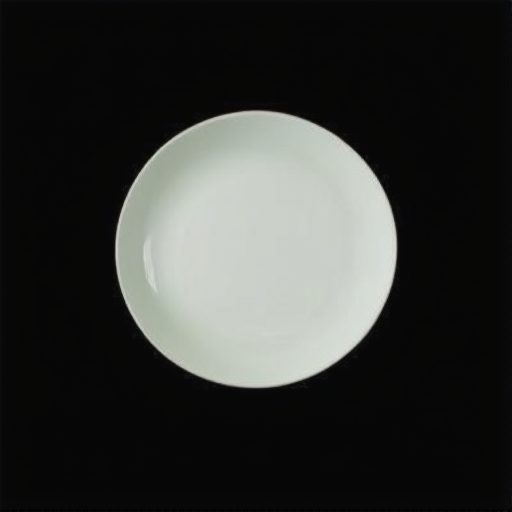
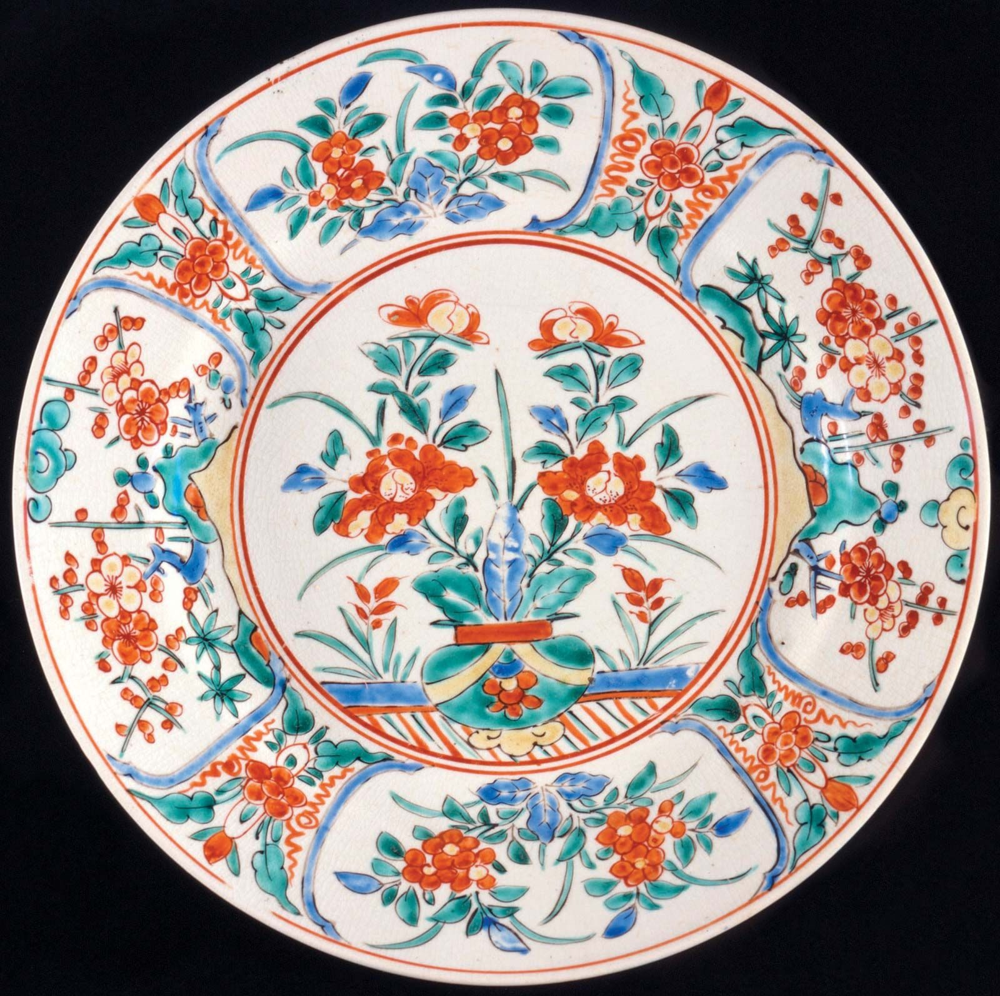

0 档 → φ0 critical w=0.4,0. 中央为蓄卷发与胡须的成年男子，躯干扭转或后仰、面部呈痛苦挣扎表情，且有巨蛇明确缠绕其肢体或躯干考察知识：[solid] 《拉奥孔》群像的核心形制：中央的祭司拉奥孔为蓄须成年男子，以痛苦扭转的挣扎姿态被海蛇缠绕▶ 0 档：中央人物缺失，或为无须年轻人/女性，或画面中完全没有蛇与人物身体接触1 档：中央为成年男子且画面有蛇，但人物呈平静直立姿态无挣扎表情，或蛇仅在旁侧未缠绕其身体2 档：蓄须成年男子居中，躯干明显扭转或后仰、表情痛苦，巨蛇缠绕其手臂、腿部或躯干，缠绕关系清晰允许变体：从侧面或背面取景，但胡须、挣扎姿态与蛇的缠绕关系仍可辨；蛇头位置与手臂具体姿态和原作不完全一致，但缠绕与挣扎关系成立 | 最低可见条件：中央人物上半身与至少一段缠绕蛇身在画面中可辨
0 档 → φ0 w=0.3,1. 中央男子两侧各有一名体量显著小于他的年轻男性，且两人均与蛇身存在接触或缠绕考察知识：[solid] 拉奥孔群像为三人构图：两个儿子分列父亲两侧，体量明显小于中央人物，同被海蛇缠绕▶ 0 档：两侧无人物，或仅有一名附属人物，或附属人物为与中央同体量的成年人/女性1 档：有两名较小人物，但仅一名与蛇有接触，或两者体量与中央人物相仿难分主次2 档：两侧各一名体量显著较小的年轻男性，各自身体均有蛇身接触或缠绕，三人构成连贯群像允许变体：两个儿子的左右位置与原作互换；其中一名儿子被中央人物或蛇身部分遮挡，但身份与缠绕关系可辨 | 最低可见条件：两名附属人物的躯干在画面中可辨且可与中央人物比较体量
2 档 → φ100 w=0.3,2. 雕像表面呈大面积绿色/蓝绿色铜绿锈色，而非大理石白或崭新抛光的金铜色考察知识：[solid] 青铜长期露天暴露氧化生成绿色/蓝绿色铜绿; [prompt 假设] 该雕像为青铜铸造并露天陈列一百多年从未清洗 → [第1步] 表面应覆盖大面积绿色/蓝绿色锈层0 档：表面呈白色大理石或石质质感，或呈崭新抛光金铜色且无任何绿锈痕迹1 档：仅有零星绿色痕迹而整体仍以金属原色为主，或绿色呈均匀喷漆状缺乏锈层的深浅变化▶ 2 档：表面大面积覆盖绿色/蓝绿色铜绿，带有自然的深浅渐变、流挂或斑驳分布允许变体：铜绿间杂深棕、黑色氧化区域；凸起部位因雨水冲刷锈层较薄、露出较深底色，凹处绿锈更浓 | 最低可见条件：雕像表面在画面中占可辨面积且色彩可判

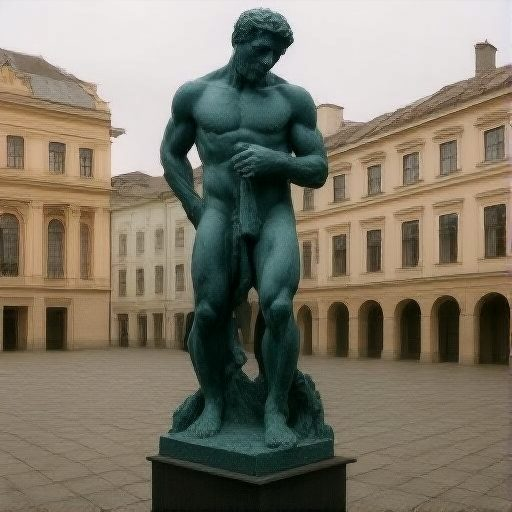
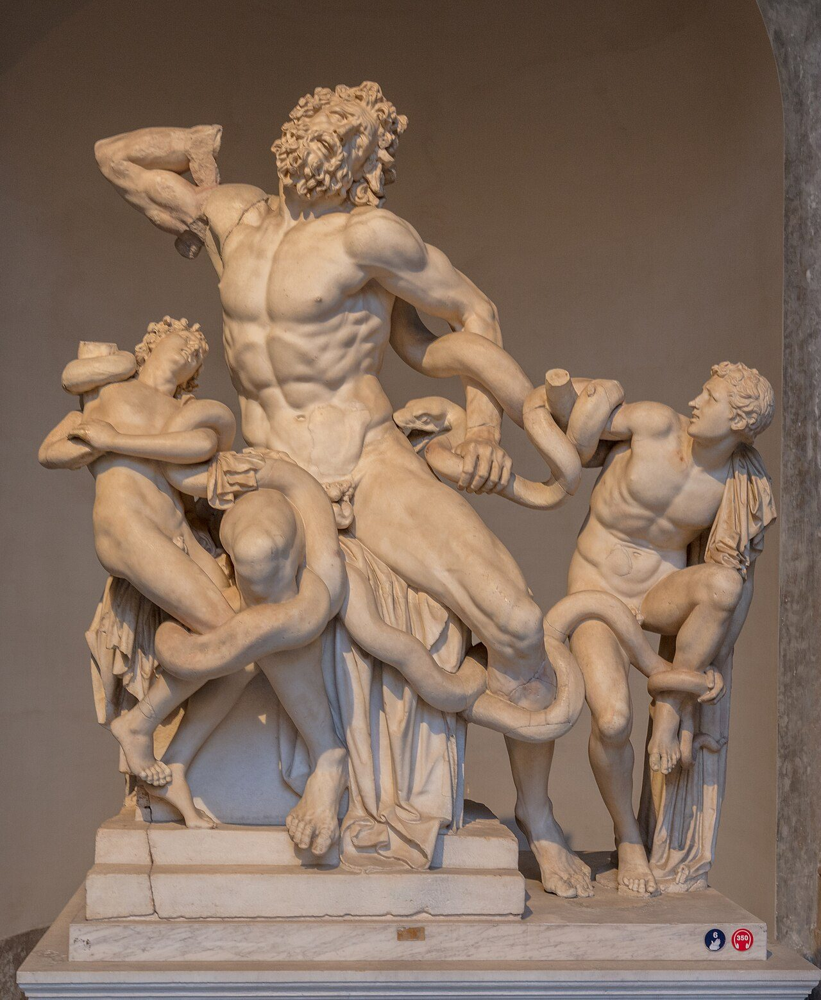

0 档 → φ0 critical w=0.5,0. 咯吱盒呈扁平小段或折叠盒状的夹馅炸面食形制，切口或边缘可见馅料或卷层，而非饺子、馄饨、整根春卷或麻团等其他油炸面食考察知识：[solid] 咯吱盒由薄饼（咯吱皮）卷馅或折叠夹馅后切段油炸而成，成品为扁平小段/盒状，切口或边缘可见馅料或卷层结构▶ 0 档：画成捏褶收口的饺子/馄饨形、整根未切的春卷、圆球状麻团或薯条等，完全无夹馅切段的咯吱盒形制1 档：呈扁平段状或块状但切口与边缘均无可见馅料或卷层，形似普通实心炸面片2 档：呈扁平小段或折叠盒状，切口或边缘可见夹馅或卷层结构，符合咯吱盒规范形制允许变体：卷制做法：小段卷状且切面呈螺旋层次；折叠做法：方形或菱形扁盒状且边缘露出馅料 | 最低可见条件：至少数枚成品占画面可辨面积，且切口或边缘结构可判
2 档 → φ100 w=0.3,1. 铁锅热油中炸制的坯体周围有密集气泡翻腾，且部分坯体浮于油面考察知识：[solid] 食物入热油后水分迅速汽化，在坯体周围形成密集气泡；[solid] 面制品炸制中内部水汽膨胀、密度降低而上浮至油面0 档：油面完全平静如清水无任何气泡，或坯体全部沉底不可见、悬浮姿态违背物理1 档：有气泡但稀疏或集中在远离坯体的区域，气泡环绕与浮于油面仅其一成立▶ 2 档：坯体周围气泡密集翻腾，且部分坯体清晰浮于油面，炸制状态符合物理允许变体：气泡伴随少量油花飞溅呈现；刚下锅的坯体呈半沉半浮状态 | 最低可见条件：油锅内部油面与炸制中的坯体清晰可见
0 档 → φ0 w=0.2,2. 案板上未下锅的生坯颜色显著浅于炸好成品的金黄至焦黄色，生熟色差方向正确考察知识：[solid] 油炸使面制品表面发生美拉德反应与焦糖化而呈金黄至焦黄色；[prompt 前提] 画面同时含未下锅生坯与刚炸好成品 → [第1步] 生坯未经油炸则无褐变 → [第2步] 生坯颜色应显著浅于成品▶ 0 档：生坯与成品颜色基本相同均为金黄焦色，或生坯颜色反而深于成品，色差方向错误1 档：两者存在色差但差异微弱难辨，或成品未呈现金黄至焦黄的油炸色调2 档：生坯呈明显浅色，成品呈金黄至焦黄，色差方向正确且对比清晰允许变体：生坯因绿豆面原料略带淡黄绿色调；成品部分边缘呈更深的焦褐色 | 最低可见条件：生坯与成品同框出现且各自颜色可辨

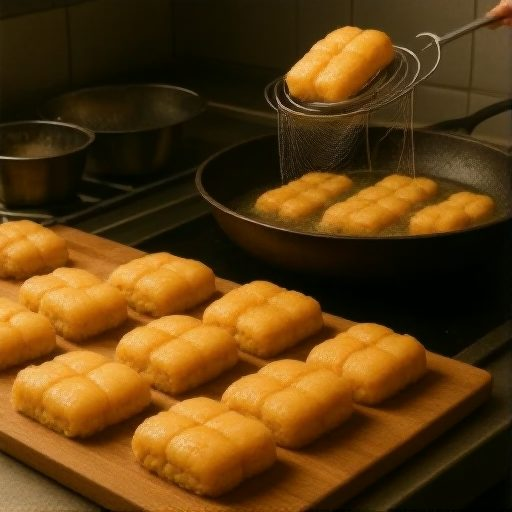
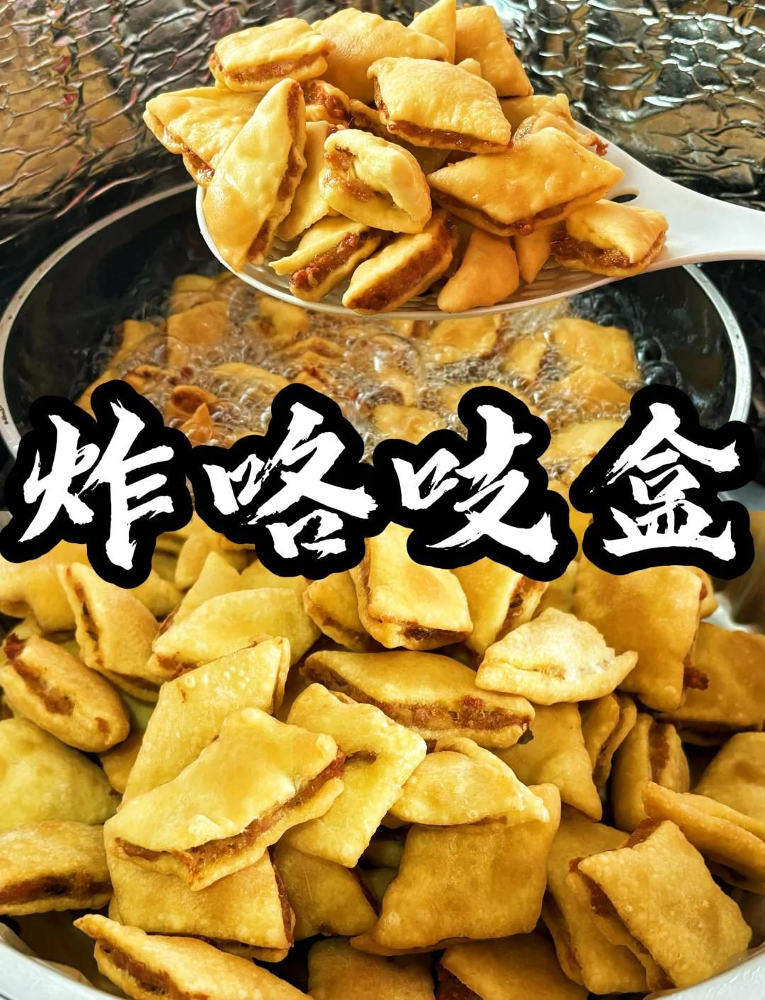

0 档 → φ0 critical w=0.5,0. 雕塑呈现《拉奥孔与儿子们》标志性形制：中央卷发浓密胡须的中年男子体量显著大于两侧儿子，三人被巨蛇身体穿插缠绕，中央男子面部呈极度痛苦扭曲的神情考察知识：[solid 规则] 《拉奥孔与儿子们》为希腊化时期经典群雕，以中央体型巨大的拉奥孔（卷发须、痛苦表情、强健肌肉）为主导，两侧为较小的儿子，巨蛇缠绕三人▶ 0 档：仅有一人或无蛇形，或人物无卷须且神态平静安详，完全偏离拉奥孔群像特征1 档：有人物与蛇，但人物比例等大无层级差异，或中央男子缺失卷须与痛苦扭曲的面部神态2 档：拉奥孔居中且体型显著大于二子，卷发长须与痛苦神态鲜明，巨蛇贯穿缠绕三人身躯允许变体：因水下视角或遮挡，其中一个儿子仅露出部分被缠绕躯干，但中央拉奥孔主体与另一侧完整可辨；拉奥孔右臂呈现为向上伸展形态或向后弯曲的现代修复形态 | 最低可见条件：雕像主体躯干与头部在光照区域内清晰可辨
1 档 → φ60 w=0.3,1. 雕塑表面呈现长期沉没于海洋环境的生物附着与侵蚀质感（如藤壶群落、珊瑚钙化斑块、海藻附着等），而非干燥光洁的全新大理石考察知识：[solid 规则] 大理石雕像沉没海洋千年以上，表面必然受海水侵蚀并滋生附着生物（藤壶、藻类、钙化壳）0 档：雕塑表面光洁如新，呈干燥室内展厅大理石质感，完全无任何水下附着或侵蚀痕迹▶ 1 档：表面仅有简单单色发暗或微弱脏污，缺乏藤壶、珊瑚钙化斑块或藻类等具象海洋附生物形态2 档：雕像表面具有清晰可辨的海洋附着生物痕迹（藤壶、珊瑚壳、斑驳海藻），侵蚀质感真实自然允许变体：受光强的大理石肌理透出石材本质，但凹陷转折处与基座边缘分布有明显生物附着斑块；雕塑表面附着有少量微小贝壳或海葵类生物 | 最低可见条件：雕塑受光区域的表面材质与纹理细节清晰可辨
2 档 → φ100 w=0.2,2. 画面环境呈现深海水下光学特征与悬浮微粒散射，探照灯形成定向光锥，伴随深邃水体光影层次考察知识：[solid 规则] 水下强光在含悬浮颗粒的水体介质中产生丁达尔散射光锥，深海环境光线衰减呈蓝绿暗调0 档：画面无水下介质感，光线如陆地空气中一样清透直射，背景缺乏水体悬浮感1 档：整体色调偏蓝绿，但缺乏探照灯光锥光束或悬浮微粒等水下光学深度层次▶ 2 档：具备清晰的定向探照光束（光锥/散射光斑）、水体悬浮微粒感及深邃明暗对比允许变体：画面背景中出现穿梭在雕像旁的微小鱼群或潜水员局部轮廓/气泡；光束在海底沙地上形成微弱的水下焦散光斑 | 最低可见条件：画面包含雕塑所处的周围水体空间与光线传播路径

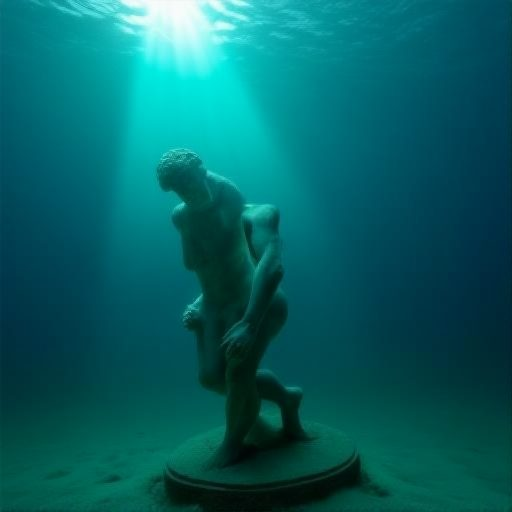
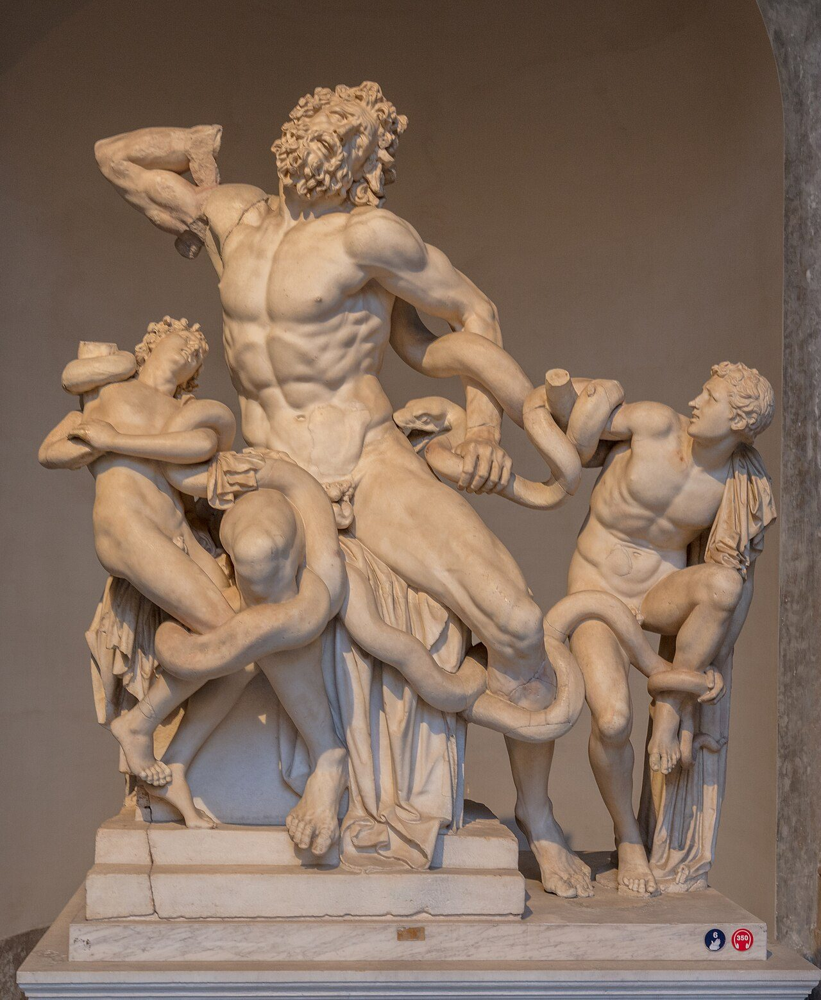

0 档 → φ0 w=0.4,0. 三块产品均呈边线规整、厚度一致的扁平四边形板块形制考察知识：[solid] 阿胶标准性状包括长方形块、方形块或类似规整块形，成品通常具有平整表面和一致厚度▶ 0 档：三件均非扁平四边形板块，或主体不可辨，表现为胶囊、粉末、液体、球丸或软糖1 档：仅部分产品呈规整扁平板块，或三件均为块状但边线、厚度和四边形轮廓存在明显错误2 档：三件产品均为边线规整、表面平整且厚度一致的扁平四边形板块，形制清楚可辨允许变体：正方形与纵向长方形的扁平板块均可；透视使轮廓投影呈梯形，但仍能辨认其实际为规整四边形板块 | 最低可见条件：三块产品各自至少一半轮廓可见，且侧面厚度能够辨认
1 档 → φ60 critical w=0.6,1. 产品主体呈有光泽的黑褐色，受侧逆光照射的薄边呈棕色至棕红色半透明考察知识：[solid] 阿胶标准性状为黑褐色且表面有光泽，较薄处或碎片对光观察呈棕色至棕红色半透明0 档：既无黑褐色光泽主体也无棕红色半透明薄边，或产品完全不可见而无法判断光学性状▶ 1 档：仅表现黑褐色光泽主体或仅表现棕红色透光效果，另一项缺失、错误或无法辨认2 档：主体清楚呈有光泽的黑褐色，同时受侧逆光的薄边呈棕色至棕红色半透明允许变体：暖色灯光使主体整体接近暖黑褐色，但黑褐主体与棕红透光边缘仍有明确区别；半透明效果仅出现在局部薄边或边角，不要求整块产品透光 | 最低可见条件：至少一块产品的正面主体和受侧逆光照射的薄边同时清晰可见

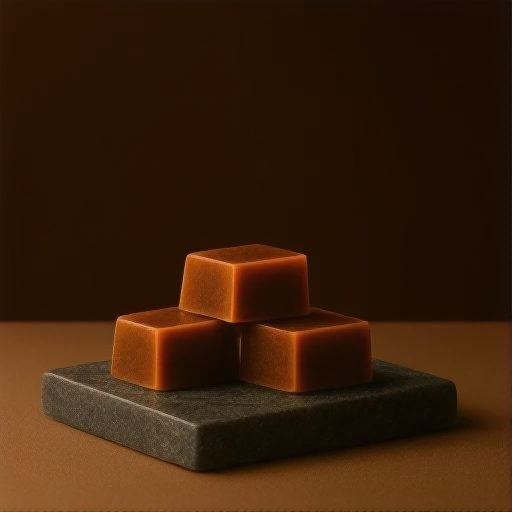
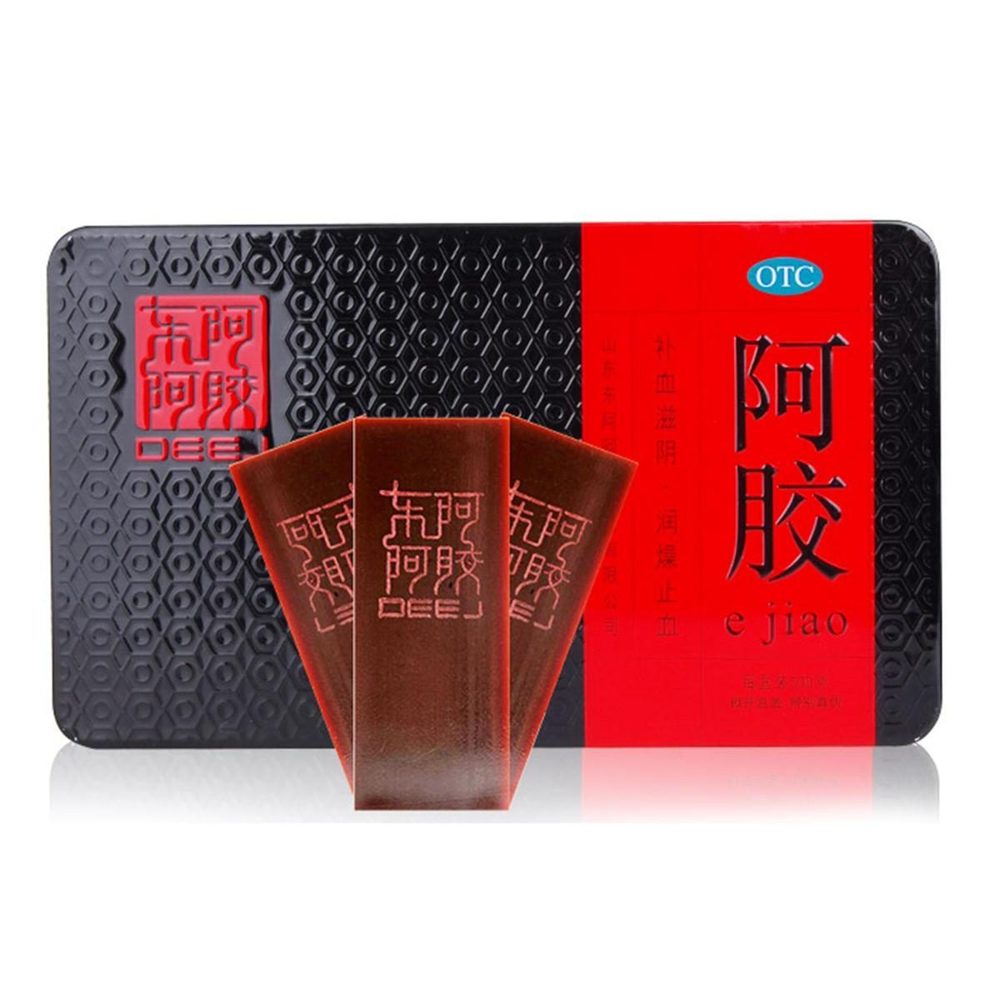

0 档 → φ0 critical w=0.6,0. 巴拉多主塔的承重结构正在崩塌，塔身轮廓发生断裂或倾覆考察知识：[solid 规则] 巴拉多的根基由至尊魔戒的力量维系，魔戒毁灭会终结索隆力量并使巴拉多崩塌；[prompt 假设] 至尊魔戒在袋底洞被彻底熔毁 → [第1步] 索隆及魔戒维系的力量终结 → [第2步] 巴拉多主塔结构崩塌▶ 0 档：堡垒完全不可见，或主塔保持直立完整，承重结构没有断裂、倾覆或构件坠落。1 档：主塔出现局部裂缝或单个构件坠落，但主体轮廓仍连续直立，崩塌状态不充分。2 档：主塔轮廓出现贯穿性断裂或明显倾覆，同时可见多个大型构件正在坠落。允许变体：塔身刚开始发生贯穿断裂并有构件坠落；塔身已经大部倾覆，但仍能辨认巴拉多残存主体 | 最低可见条件：巴拉多主体至少有一半入画，主塔轮廓和承重结构清晰可辨。
2 档 → φ100 w=0.4,1. 巴拉多塔顶的索隆火焰之眼已经消失，或正在失去眼形轮廓并熄灭考察知识：[solid 规则] 彼得·杰克逊电影中的索隆火眼依托索隆力量显现，至尊魔戒毁灭时索隆力量终结，火眼随之熄灭消散；[prompt 假设] 至尊魔戒在袋底洞被彻底熔毁 → [第1步] 索隆力量终结 → [第2步] 塔顶火眼熄灭或消散0 档：塔顶不可辨认，或仍存在轮廓完整、亮度稳定并持续燃烧的巨大火焰之眼。1 档：火眼仍可明确辨认为完整眼形，但亮度减弱、火焰破碎或仅有局部消散。▶ 2 档：塔顶已无可辨火眼，或仅剩失去眼形轮廓、正在熄灭的破碎火焰与余烬。允许变体：火焰之眼完全消失，塔顶仅有烟尘；火眼只剩没有稳定眼形轮廓的暗淡余烬 | 最低可见条件：巴拉多塔顶及其周边天空必须入画且未被烟尘完全遮蔽。

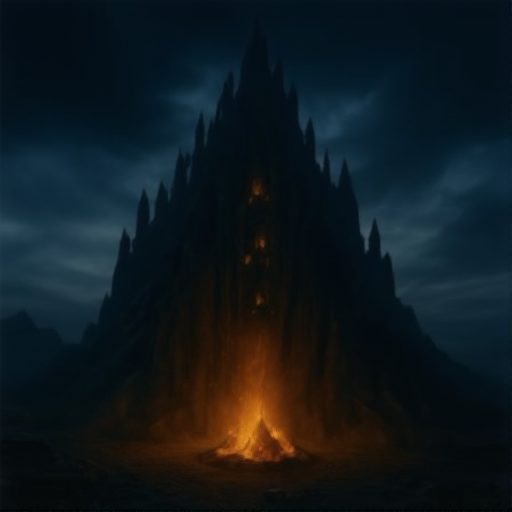
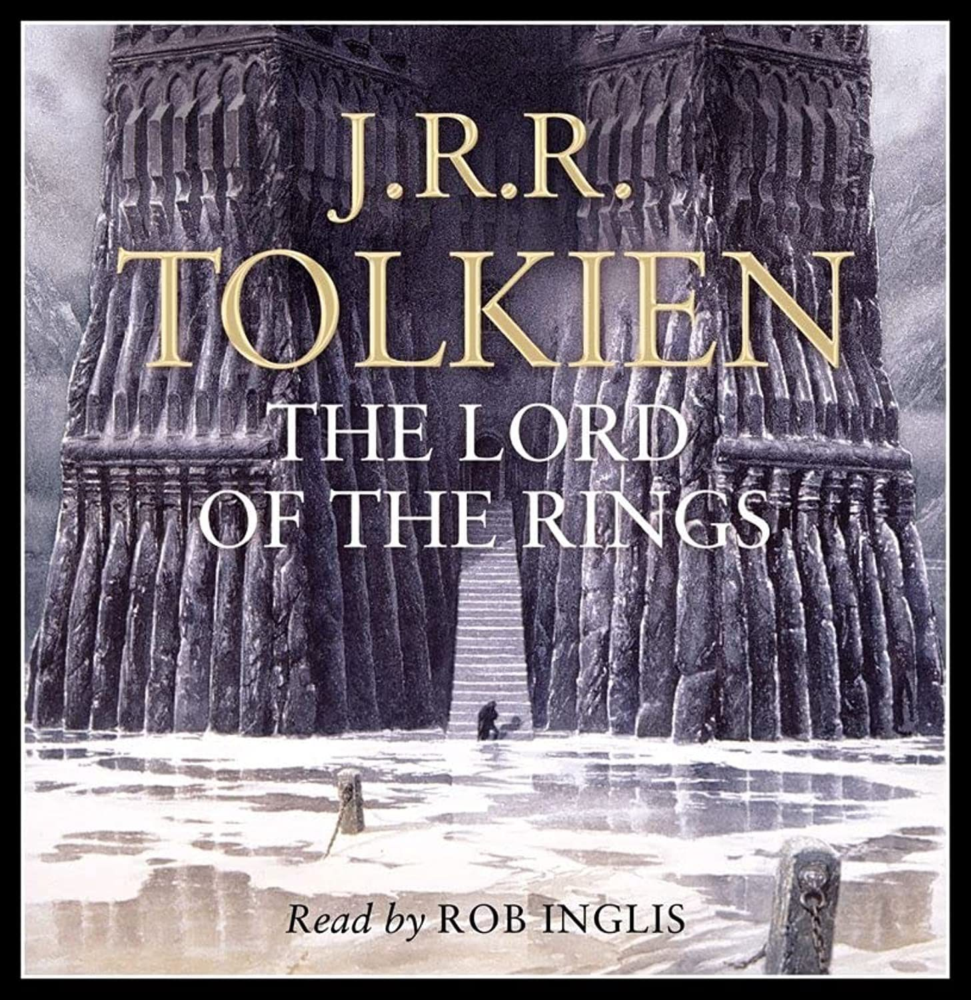

1 档 → φ60 critical w=0.6,0. 瓷盘呈现金襴手伊万里的典型综合色彩工艺：白瓷地上同时可辨钴蓝、矾红与金彩考察知识：[solid] 金襴手伊万里以白瓷胎为底，典型工艺结合釉下钴蓝、釉上矾红与金彩，常形成华丽密集的综合色绘装饰0 档：瓷盘不可辨，或画成青花单色、通体素白、现代印花餐盘，三种典型色彩工艺均未成立▶ 1 档：具有伊万里式彩绘倾向，但钴蓝、矾红、金彩中仅清楚呈现一至两类，综合色彩工艺不完整2 档：白瓷地上钴蓝、矾红与金彩均清晰可辨，综合色绘呈现华丽密集的金襴手面貌允许变体：在钴蓝、矾红与金彩之外加入少量绿彩；纹样采用花鸟、人物、几何锦地或多种题材组合；金彩受侧光影响呈暗金、黄金或局部高光色泽 | 最低可见条件：盘面至少一半朝向镜头，且白地与主要彩绘颜色能够辨认
0 档 → φ0 w=0.4,1. 商人服装具有17世纪末荷兰男性的时代轮廓：长外套或紧身上衣配白色领饰，并穿及膝马裤与长袜考察知识：[solid] 17世纪末荷兰男性服饰常由长外套或紧身上衣、白色领巾或领饰、及膝马裤和长袜构成，宽檐帽与假发均可出现▶ 0 档：人物穿现代西装、牛仔服、短裤运动鞋，或服装主体明显属于其他时代，缺失同期荷兰服饰轮廓1 档：人物具有泛欧洲古装外观，但领饰、上衣、马裤与长袜的组合残缺或年代特征混杂2 档：长外套或紧身上衣、白色领饰、及膝马裤与长袜组合清楚，形成17世纪末荷兰男性轮廓允许变体：人物戴宽檐帽；人物不戴帽并佩戴假发；人物不戴帽且露出自然头发 | 最低可见条件：人物从头部至小腿均可见，上衣、领部、裤装与袜装能够分别辨认

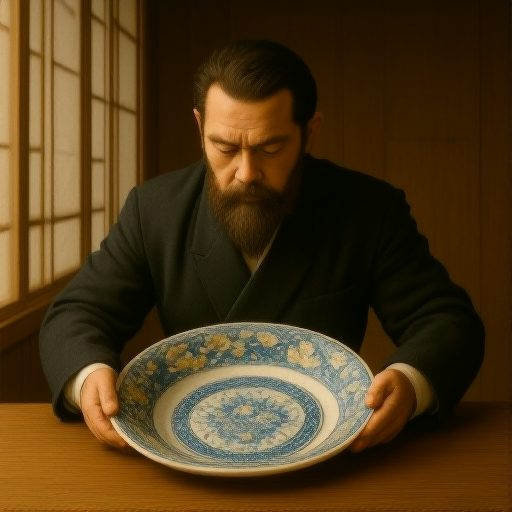
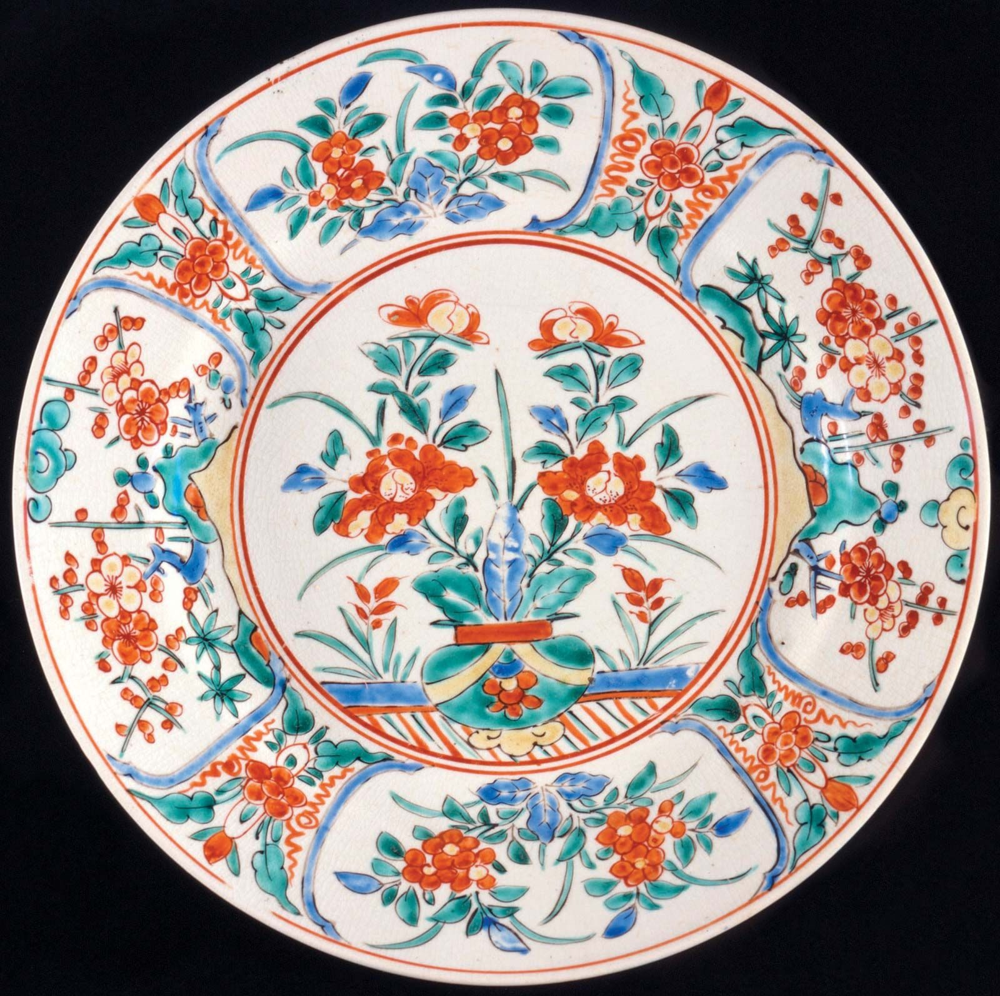

1 档 → φ60 critical w=0.6,0. 咯吱盒主体呈短小矩形、菱形或卷段状，油炸外表为薄脆表皮并带有细小鼓泡考察知识：[solid] 咯吱盒由咯吱皮包卷后切段或折成小块炸制，成品通常为短小几何块或卷段，薄皮经油炸形成金黄且带细小鼓泡的表面0 档：主体呈普通饺子、春卷、油条或厚面包块，既无短小块段形态，也无薄皮鼓泡表面▶ 1 档：短小块段形态与薄皮鼓泡表面仅有一项清楚符合，另一项缺失或无法辨认2 档：主体清楚呈短小矩形、菱形或卷段状，同时具有可辨的薄脆鼓泡油炸表面允许变体：不同家庭做法可呈矩形小块、菱形小块或短圆柱卷段；边角在炸制中轻微翘起或开裂，但主体形态与薄皮表面仍可辨 | 最低可见条件：至少三块主体食品轮廓完整过半，且其中一块的外皮表面细节清晰可辨。
0 档 → φ0 w=0.4,1. 切开样品的截面表现为薄皮包围较紧实的馅料，而非发面组织或完全空心结构考察知识：[solid] 咯吱盒以薄咯吱皮包卷馅料后切段炸制，因此切面应见薄皮围住紧实馅心；馅料可因家庭做法不同而变化▶ 0 档：没有可辨切面，或切面呈发面气孔、面包瓤、完全空腔而看不到被薄皮包围的馅料1 档：切面中能看到馅料或薄皮之一，但遮挡、模糊或结构混乱，无法同时确认包馅关系2 档：切面清楚显示外层薄皮围住较紧实馅料，皮层、馅心及二者包裹关系均可辨允许变体：馅料可为棕褐色肉馅，也可为含蔬菜碎的素馅；切面可因油炸产生少量碎屑，但薄皮包馅结构仍清楚 | 最低可见条件：至少一个切开样品的截面朝向镜头，皮层与馅心均达到可辨程度。

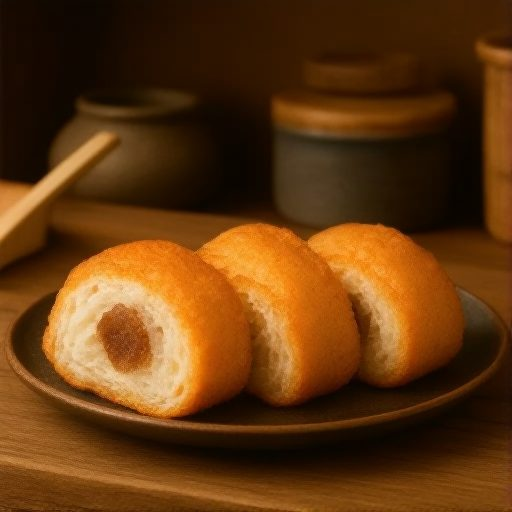
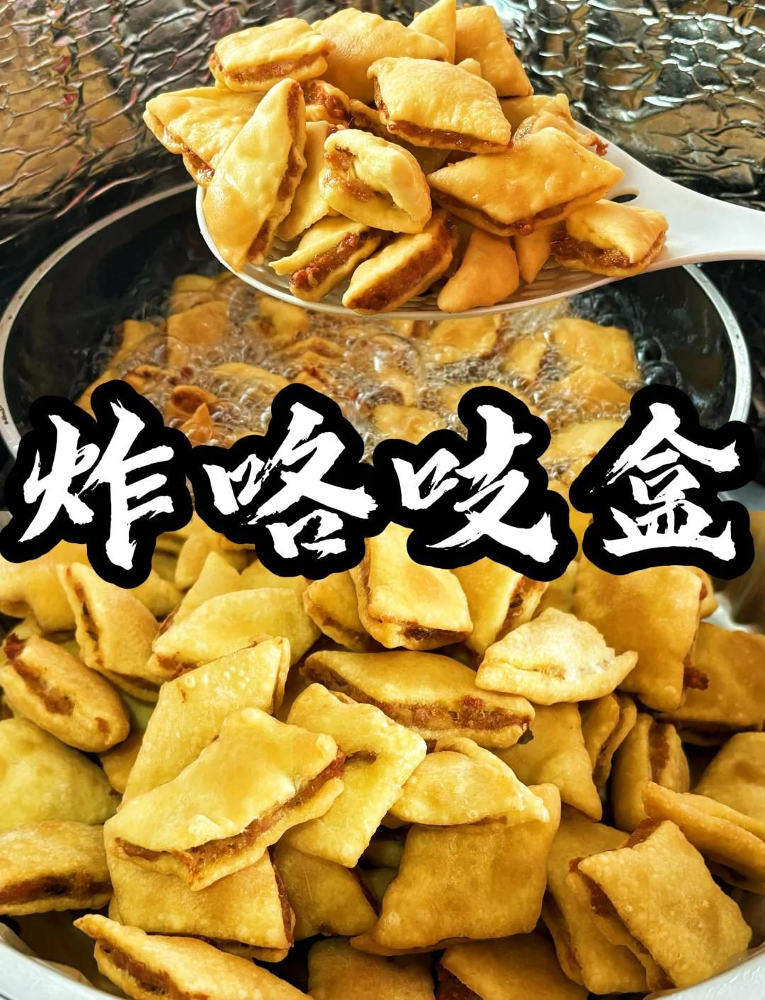

1 档 → φ60 critical w=0.4,0. 巴拉多塔呈原著规范形制：黑色嶙峋尖刺轮廓、要塞式巨塔塔身、体量显著高于画面中其他一切地貌考察知识：[solid] 巴拉多是索伦位于魔多的黑暗主塔，规范形象为黑色尖刺嶙峋的要塞式巨塔，压倒性地高于周边平原0 档：画面无高塔，或塔为明亮色调的欧式圆润城堡塔，与黑暗尖刺巨塔形制完全不符▶ 1 档：有黑暗高塔但形制普通（如平滑圆柱塔或普通中世纪石塔），缺乏尖刺嶙峋轮廓或压倒性体量其中之一2 档：黑色嶙峋尖刺轮廓、要塞式塔身、显著高于周边一切地貌，三特征齐备允许变体：塔顶有燃烧之眼（电影设定）或无眼（原著含蓄描写）均可；塔被烟尘火光部分遮挡，但黑色尖刺轮廓仍可辨 | 最低可见条件：塔身主体入画且整体轮廓可辨
0 档 → φ0 w=0.3,1. 巴拉多塔正处于崩解状态：塔体断裂坠落、倾颓或碎裂瓦解中，而非完好静立考察知识：[solid 规则] 巴拉多塔的根基由索伦注入至尊魔戒的力量维系；[prompt 假设] 魔戒此刻已彻底熔毁 → [第1步] 索伦之力随之消散 → [第2步] 塔身即刻崩解坍塌▶ 0 档：塔完好无损、静立无任何崩解迹象1 档：仅有轻微裂纹、倾斜或烟尘暗示，塔体主结构无明显崩解动态2 档：塔身出现明显崩解动态：大块结构断裂坠落、塔体倾颓或整体碎裂瓦解中允许变体：崩解表现为塔体如烟尘阴影般消散瓦解（符合原著『如影散去』的描写）；崩解刚开始：塔身出现贯穿性大裂缝且顶部结构已在坠落 | 最低可见条件：塔身大部分入画且结构状态可判
1 档 → φ60 w=0.3,2. 末日火山呈剧烈喷发状态：火光、喷涌熔岩或冲天灰柱清晰可见，而非静止的休眠山体考察知识：[solid 规则] 原著中至尊魔戒在末日火山中熔毁的同时火山剧烈喷发；[prompt 假设] 魔戒刚刚熔毁 → [第1步] 末日火山此刻正剧烈喷发0 档：画面无火山，或火山完全静止、无任何喷发迹象▶ 1 档：火山仅有微弱烟气或山顶红光，无明显喷发的火焰、熔岩或灰柱2 档：火山呈剧烈喷发态：喷涌的火光熔岩或冲天火山灰柱清晰可见允许变体：喷发初始阶段：火光与烟柱刚从山口升起亦算达标；熔岩流沿山体倾泻而下的表现形式 | 最低可见条件：火山山体在画面中入画且山口区域可辨

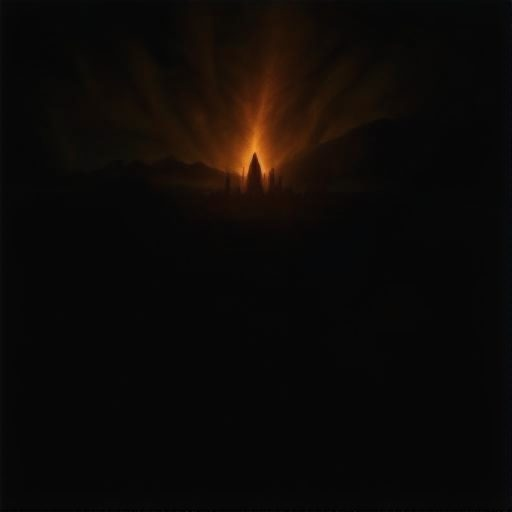
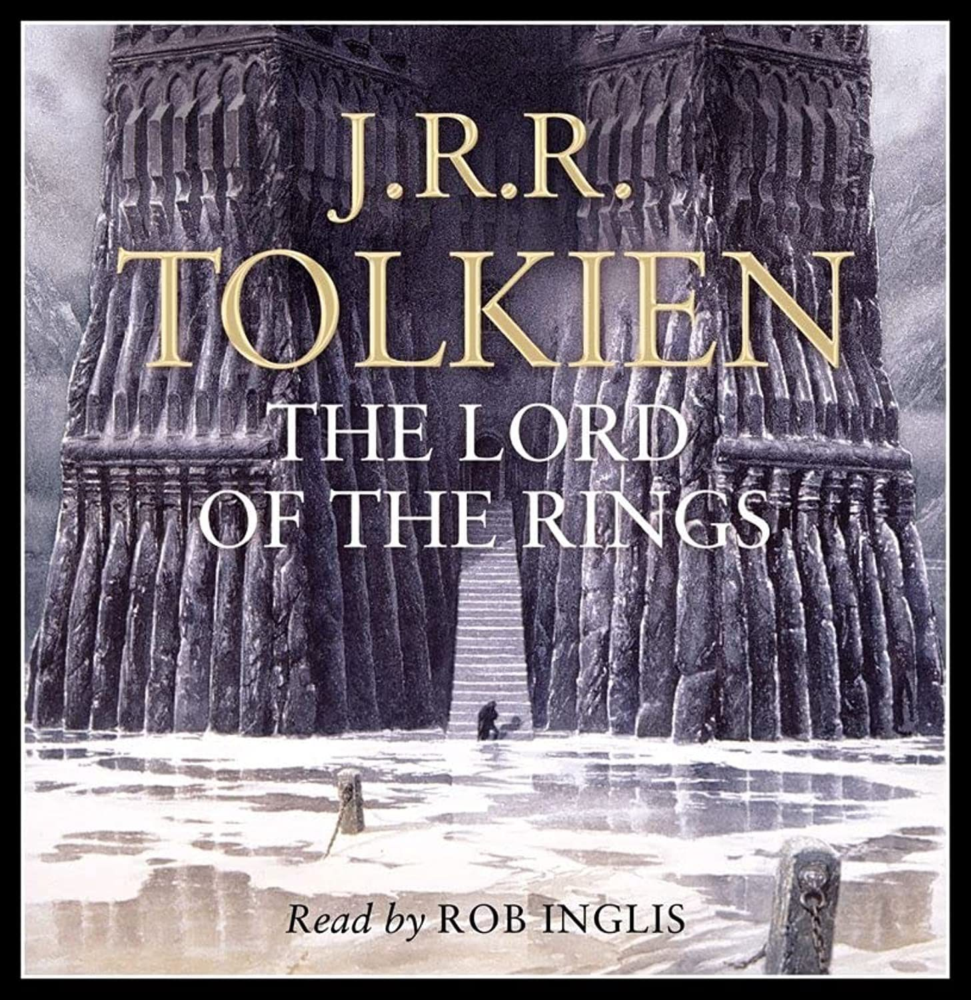

2 档 → φ100 critical w=0.4,0. 狮头呈现广东醒狮（南狮）形制：头顶有凸起的独角，额心镶嵌圆形明镜，面部具传统戏剧脸谱式油彩彩绘考察知识：[solid] 广东醒狮（南狮）头部标志性特征为顶生独角（额角）、额嵌明镜、具戏曲脸谱式油彩，非北狮的通体长毛无角犬狮造型0 档：画成写实真实狮子，或画成通体金黄长毛且无独角、无额镜的北方舞狮/卡通狮子1 档：具备部分南狮特征，但缺少头顶独角或额心明镜等核心结构其一▶ 2 档：头顶独角、额心明镜及面部传统彩绘纹样均清晰可辨且形制准确允许变体：狮头配色采用关公狮（红黑）、刘备狮（彩金）或张飞狮（黑白）等其他传统醒狮正统谱系；独角顶端带有绒球或绒毛装饰 | 最低可见条件：狮头正面或半侧面完整入画且面部结构清晰可辨
0 档 → φ0 w=0.3,1. 狮身呈现双人舞狮的道具结构与人狮结合形态（狮头连接布质狮被，下方可见舞狮者的灯笼裤与鞋履），而非四足真实动物躯干考察知识：[solid] 醒狮属于道具民俗表演，由舞狮者操作狮头与狮被，下身露出穿特制灯笼裤/亮片裤的演员双腿▶ 0 档：画成具有生物骨骼与肌肉的四足兽身，完全无舞狮演员与道具结构1 档：有布料狮被，但下身未体现舞狮队员的双腿与鞋裤，结构混沌不合理2 档：清晰呈现狮被覆盖结构，且可见舞狮表演者穿着传统灯笼裤/扎腿裤的下肢允许变体：狮身因大幅腾跃动作导致狮被飘扬，露出舞者腰部或支撑姿态；舞者裤子为反光亮片裤或绒毛扎腿裤 | 最低可见条件：狮身及支撑下肢在画面中可见
0 档 → φ0 w=0.3,2. 高处悬挂的采青目标体现为传统生菜（青）或系有红绳/红包的青翠绿叶植物道具考察知识：[solid] 醒狮‘采青’（谐音‘采清’或‘生财’）传统民俗中，悬挂的‘青’为一扎带红绳或系有红包的生菜/绿叶蔬菜▶ 0 档：悬挂物为现代无关物品（如普通气球、纯红灯笼等）或画面中无任何采青悬挂物1 档：悬挂了不明绿色植物，但无红包/红绳等传统采青标识且形态模糊2 档：悬挂物清晰呈现为带红绳、红纸或红包包裹的生菜/绿叶植物束允许变体：生菜旁悬挂红丝带、铜钱或利市封（红包）；青物挂在竹竿顶端或门楣垂下绳索上 | 最低可见条件：高处采青悬挂物在画幅内清晰可见

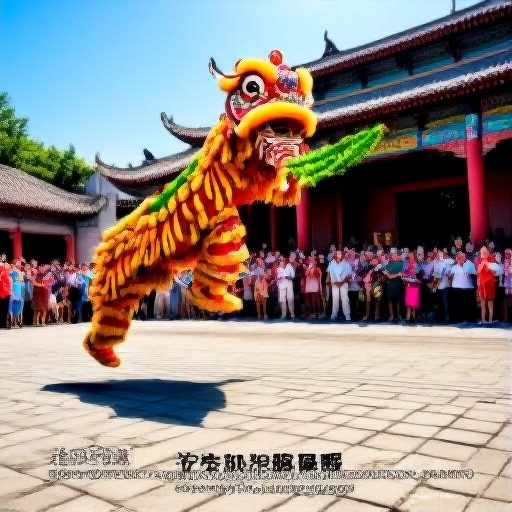
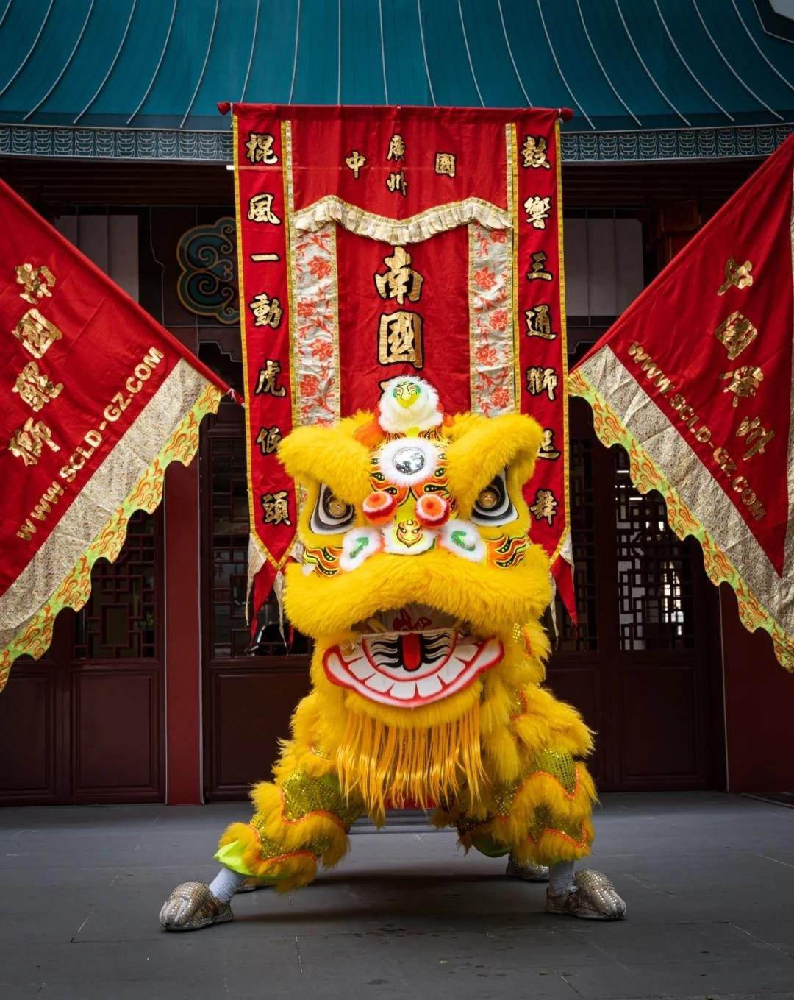

2 档 → φ100 critical w=0.5,0. 醒狮呈南狮头部形制，具有彩绘宽大头壳、额顶独角、凸眼和可开合大口考察知识：[solid] 广东醒狮属于南狮，典型狮头由彩绘宽大头壳、额顶独角、凸眼及可开合大口构成0 档：醒狮无法辨认，或画成全身兽毛、写实兽脸的北狮或真实狮子形态1 档：可辨为南狮，但宽大彩绘头壳、独角、凸眼和开合大口中缺少一至两项▶ 2 档：宽大彩绘头壳、额顶独角、凸眼与可开合大口四项形制全部清楚呈现允许变体：佛山狮与鹤山狮的传统脸谱比例差异均可；采用红、黄、黑、白或多彩传统脸谱，不限定狮头主色 | 最低可见条件：狮头正面或四分之三侧面清晰入画，头顶、双眼与口部均可辨认
0 档 → φ0 w=0.3,1. 采青目标是一束具有清晰叶片形态的绿叶菜考察知识：[solid] 醒狮“采青”中的青通常使用生菜等成束绿叶菜，具有纳福求吉的文化寓意▶ 0 档：采青目标缺失，或目标明确画成彩球、旗帜、纯花束及其他非绿叶菜物品1 档：目标呈绿色植物团块，但叶片形态模糊，无法确认是成束绿叶菜2 档：目标清楚呈现为成束绿叶菜，具有可辨的叶片、叶柄或菜株结构允许变体：使用生菜或其他成束新鲜绿叶菜；绿叶菜与红包或红布条系在一起 | 最低可见条件：采青目标完整或大半入画，叶片轮廓达到可辨程度
0 档 → φ0 w=0.2,2. 现场伴奏包含一面鼓，并同时出现锣或钹中的至少一种考察知识：[solid] 广东醒狮传统伴奏以鼓为节奏核心，并配合锣、钹类金属打击乐器▶ 0 档：伴奏区未出现传统鼓、锣或钹，或仅出现吉他、键盘等现代乐器1 档：只清楚出现鼓，或只出现锣钹类乐器，传统伴奏组合不完整2 档：一面鼓清楚可见，并同时出现锣或钹中的至少一种传统打击乐器允许变体：大锣、小锣或手锣均可；成对铜钹、铙钹或其他醒狮表演常用钹类均可 | 最低可见条件：伴奏区域至少有两类乐器主体可见，并能根据外形辨认类别

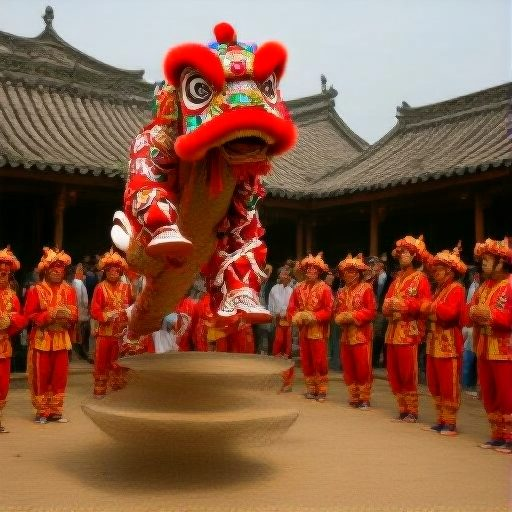
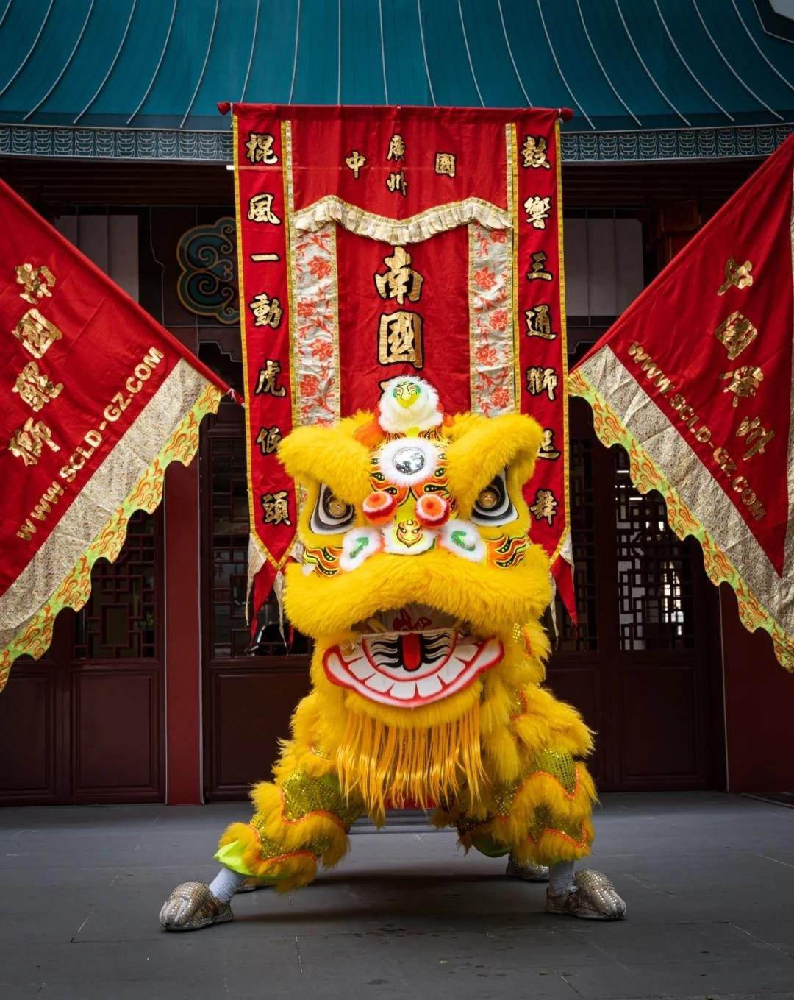

1 档 → φ60 critical w=0.4,0. 国际空间站呈主桁架贯穿结构，外伸出大面积矩形太阳能电池翼阵列，中心分布有模块化圆柱形增压舱段考察知识：[solid] 国际空间站（ISS）由长条形金属桁架主梁、大面积分段太阳能翼及多国圆柱形实验/居住舱段组合构成0 档：未画出空间站，或画成科幻圆环旋转站/单个简单圆筒卫星/缺乏太阳能电池翼与桁架▶ 1 档：具有太阳能翼或舱段，但整体构型紊乱（如无桁架主干、电池板比例极小或杂乱无章）2 档：清晰呈现贯穿式主桁架、大面积矩形太阳能翼阵列以及中心圆柱形加压舱段结构允许变体：空间站部分舱段因透视角度有遮挡，但主桁架与太阳能电池翼特征明确；太阳能翼颜色表现为深金黄、铜褐或深蓝黑网格纹理 | 最低可见条件：空间站主体完整入画且结构与太阳能翼清晰可辨
0 档 → φ0 w=0.3,1. 航天飞机以机背（载荷舱侧）朝向空间站对接，机体具备黑白相间涂装与后掠三角翼形制考察知识：[solid] 航天飞机轨道器对接系统（ODS）位于背部货舱前部，通过背部与空间站对接；机身外形为双三角翼滑翔体，机腹黑色防热瓦、机背白色▶ 0 档：画成普通客机/圆锥形飞船胶囊，或以机头/机腹/尾部推进器错误连接空间站1 档：具备航天飞机基本外形，但对接方向错误（如机头顶住空间站），或机体结构模糊无三角翼特征2 档：机身背部有效载荷舱区域朝向空间站对接舱连接，具备清晰后掠三角翼与黑白机身特征允许变体：载荷舱门处于开启或关闭状态；航天飞机机体被部分桁架阴影投射遮挡但轮廓可辨 | 最低可见条件：航天飞机机身及与空间站连接处完整可见
2 档 → φ100 w=0.3,2. 画面呈现真空轨道环境下的硬光照特征，受光面高亮且背光面呈现锐利深阴影，深空背景无漫射亮光考察知识：[solid] 太空为真空环境无大气散射，日光直射物体表面产生边缘锐利的强阴影与极端明暗反差0 档：光影呈现大气漫射柔光，背光面被整体照亮无明显明暗分界，或背景出现白天式蓝天漫射1 档：有明暗反差但阴影边缘过度柔化、存在不合常理的环境散射光▶ 2 档：受光面光照硬朗锐利，背光面呈高反差深暗阴影，符合轨道真空光照物理允许变体：地球反照光对背光阴影面提供微弱冷色泛光填充 | 最低可见条件：空间站受光与背光交界区域清晰可见

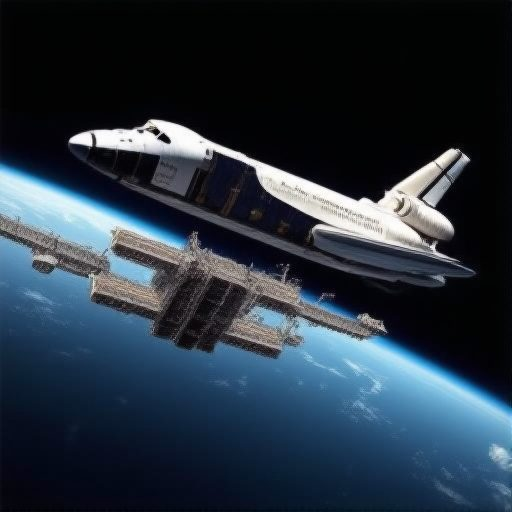
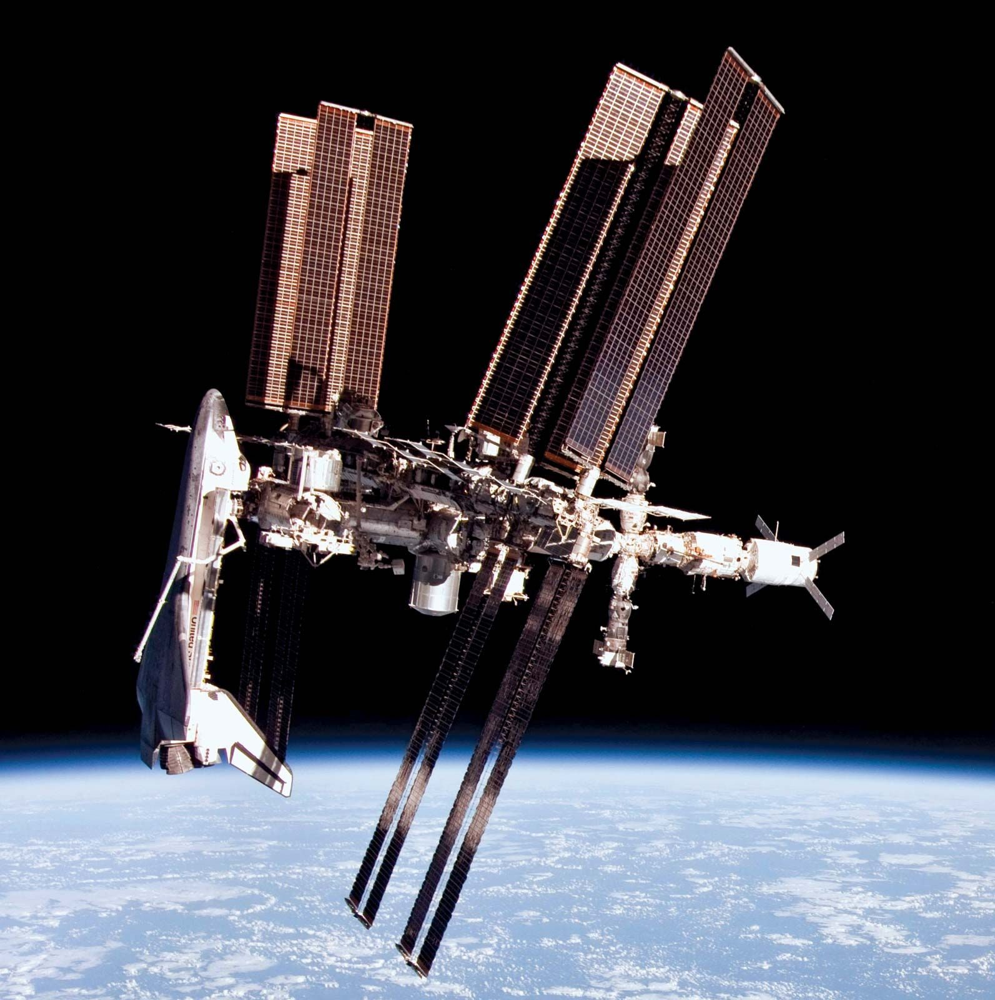

1 档 → φ60 critical w=0.5,0. 瓷盘彩绘以蓝（青花/染付）与红（矾红/赤绘）为主色调，整体呈现鲜明和雅的冷暖对比考察知识：[solid] 伊万里瓷标志性色彩体系以青花与矾红为主调，常配以绿彩、金彩等辅色，红蓝对比是其最核心的视觉辨识特征0 档：瓷盘为纯单色釉、纯白无纹、纯蓝青花、或呈中国五彩/粉彩/珐琅彩等非红蓝主调的配色体系▶ 1 档：包含红或蓝其中一种颜色，但未形成以红蓝两色为主导的典型伊万里色彩组合2 档：清晰呈现以蓝（青花）与红（矾红）为核心主调的彩绘，色调层次分明允许变体：金襴手风格：在红蓝主调基础上施加大量金彩修饰；色绘古伊万里风格：在红蓝基础上点缀绿、黄、紫等辅色 | 最低可见条件：瓷盘盘面装饰图案清晰可辨，色彩饱满未被严重偏色光源覆盖
0 档 → φ0 w=0.3,1. 盘面装饰布局呈现典型的几何/扇形开光（分格）或内外同心圆分区，并在分区内填以繁密的花草、植物或折枝纹样考察知识：[solid] 伊万里瓷盘经典构图采用中心主题开光加盘沿放射状开光（分割区），各区填以密集花卉或锦地纹，构图满密规整▶ 0 档：盘面为大面积留白、现代抽象色块、无分区的零散涂鸦，或完全写实的风景画构图1 档：绘有花卉图案但缺乏开光/分格等江户瓷器典型的几何与放射状规整布局2 档：盘面具有明确的开光、边框分区或内外同心圆放射布局，分区内填满精细花草纹饰允许变体：盘心绘花篮/瓶花主题，盘沿设多个扇形或菱形开光；通体满密锦地纹饰间穿插花卉纹样的通景构图 | 最低可见条件：盘面整体构图过半可见
2 档 → φ100 w=0.2,2. 器物呈现坚硬细腻的白瓷胎体与光滑玻化釉面质感，器形规整圆润考察知识：[solid] 伊万里瓷为高温烧制硬质白瓷，釉面光滑光洁，具玻化反光特质0 档：器物表面呈粗陶、未上釉陶土、紫砂粗糙颗粒感，或金属/塑料质感1 档：质感模糊，介于陶瓷与树脂之间，缺乏明确的高温白瓷釉光▶ 2 档：清晰展现温润通透的白瓷底色及表面光洁细腻的高温玻化釉层反光允许变体：釉面带有极细微的年代开片（微裂纹）或古物温润蛤蜊光 | 最低可见条件：瓷盘边缘及反光受光面清晰可见

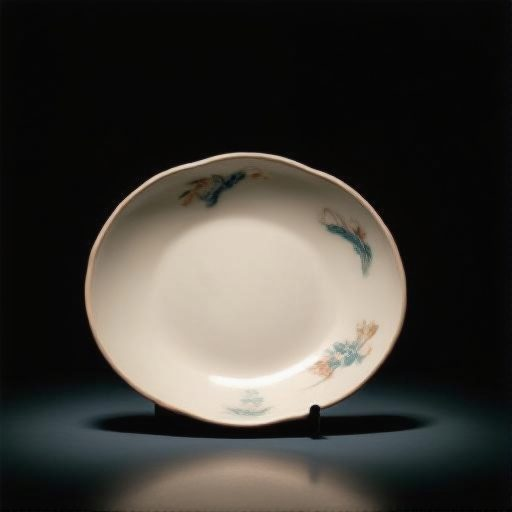
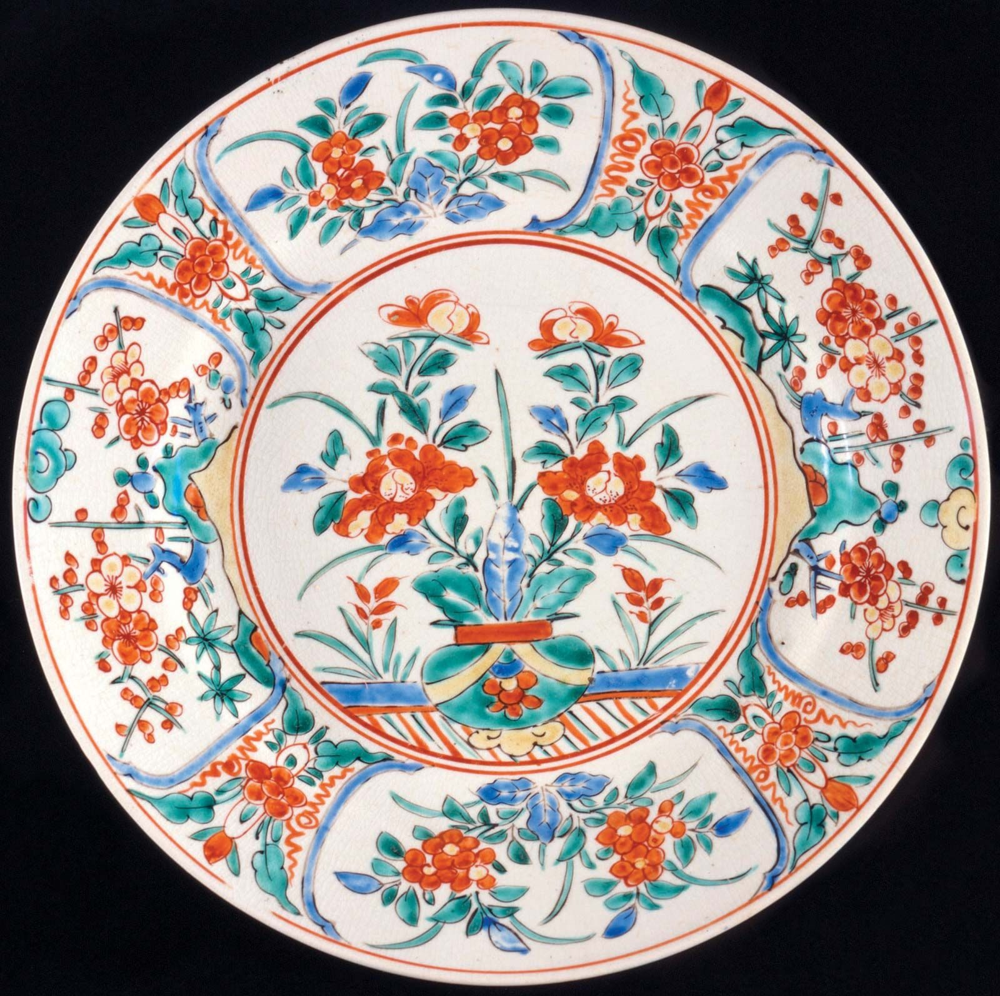

2 档 → φ100 critical w=0.4,0. 峡湾呈狭长水道深入山地、两岸从近水位置陡峭上升的冰川谷地形态考察知识：[solid] 峡湾是冰川侵蚀形成的深切谷地被海水淹没后的狭长海湾，典型视觉形态为狭长水道与陡峭谷壁0 档：画面呈宽阔外海、平原湖泊或低缓河谷，无法识别狭长深切的峡湾地貌1 档：可见山间水道，但狭长深入与两岸近水陡升两项特征仅清楚呈现一项▶ 2 档：狭长水道明显深入山地，两岸均从近水位置陡峭上升，峡湾形态完整可辨允许变体：水道可以弯曲或向远处收窄；谷壁可由裸岩、积雪与耐寒植被共同覆盖 | 最低可见条件：水道纵深及两侧从水边上升的山体必须同时入画并可辨
0 档 → φ0 w=0.3,1. 至少一条崖壁淡水落水带的边缘形成连续可辨的冰挂、冰帘或附岩冰壳考察知识：[solid规则] 常压下淡水凝固点约为0°C，持续暴露于-1°C的喷溅水和薄层水会结冰；[prompt假设] 从无冰状态开始，-1°C持续数周且崖顶淡水不断补给 → [第1步] 落水带边缘及岩壁湿润处形成冰挂或冰壳▶ 0 档：所有可见落水带均为纯液态瀑布，周围岩壁没有任何可辨冻结附着形态1 档：落水带附近仅见零散白色附着，无法确认连续冰挂、冰帘或附岩冰壳2 档：至少一条落水带边缘具有连续清晰的冰挂、冰帘或附岩冰壳允许变体：允许冰体中央或冰壳表面仍有液态细流；冰挂、冰帘和沿岩壁延伸的冰壳均可 | 最低可见条件：至少一条崖壁落水带及其相邻岩面达到可辨冰体形态的清晰度
2 档 → φ100 w=0.3,2. 峡湾主体海水保持连续开放的液态水面，不形成覆盖主体水域的连续冰盖考察知识：[solid规则] 盐度约35‰海水的凝固点约为-1.9°C；[prompt假设] 峡湾表层盐度约35‰、从无冰状态开始并持续处于-1°C → [第1步] 水温仍高于其凝固点，主体海面保持液态开放0 档：峡湾主体水域被连续坚硬冰盖覆盖，开放液态水面缺失或仅剩狭小裂隙1 档：开放水面与成片冰盖同时占据主体水域，水面相态表现明显混杂▶ 2 档：主体水域为连续开放的液态水面，没有覆盖主要水域的成片冰盖允许变体：液态水面可以平滑如镜，也可以带有细小波纹；岸边允许出现不占主体水域的局部淡水结冰附着 | 最低可见条件：峡湾主体水面必须占据足够画面面积，可判断是否存在连续冰盖

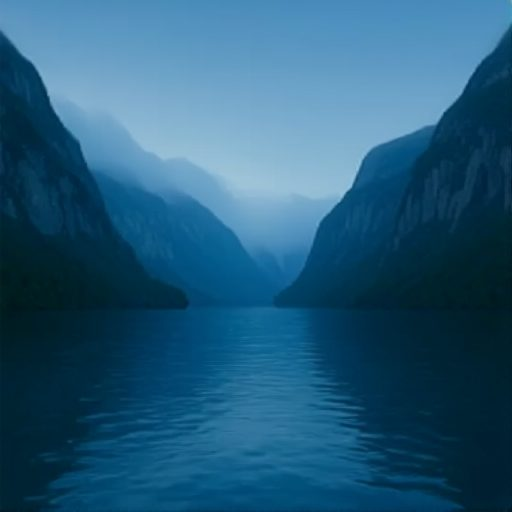
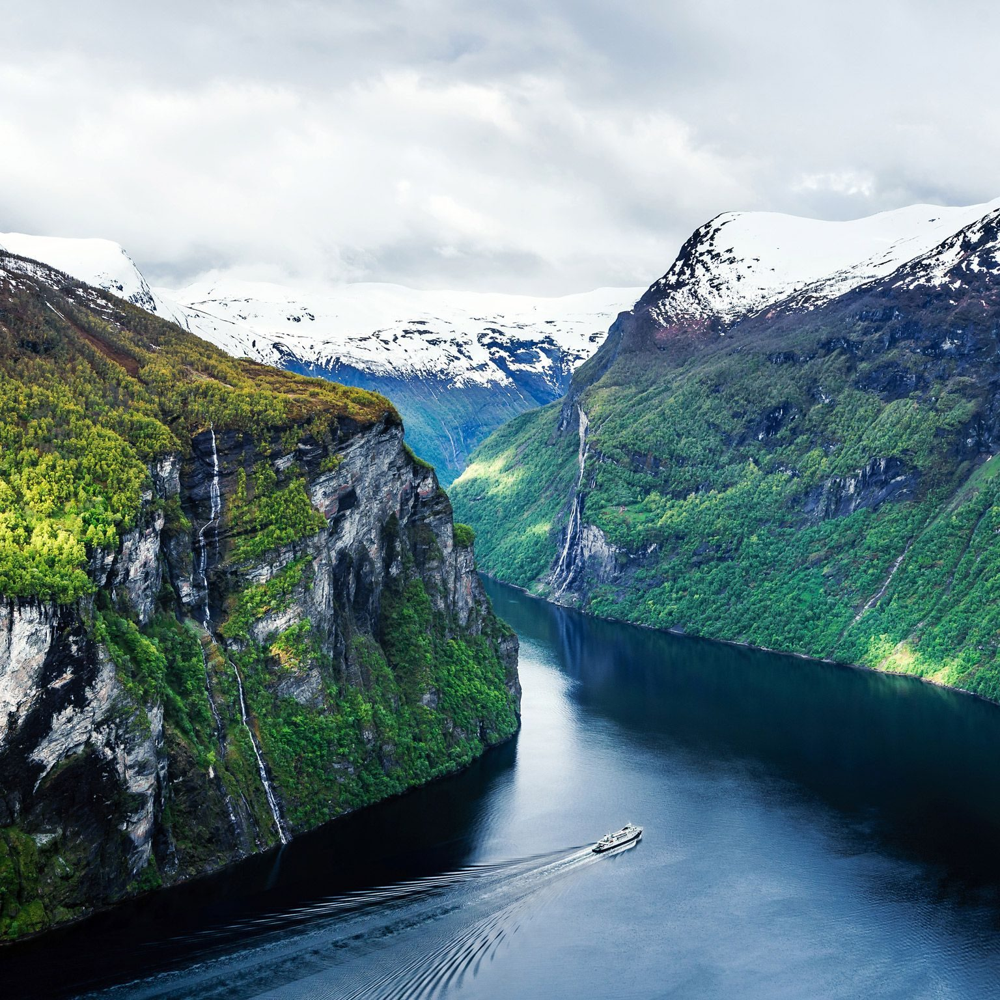

2 档 → φ100 critical w=0.4,0. 至少一张标准前锋卡呈现左上费用晶体、顶部名称区、中央角色插画、下部规则区与右下力量值的规范版式考察知识：[solid] 最终幻想集换式卡牌的标准前锋卡具有左上角元素色费用晶体、顶部名称、中央插画、下部规则区域和右下角力量数值0 档：没有可辨认的前锋卡正面，或任一卡面最多只具备一处所述功能区域1 档：至少一张卡具备两至四处所述功能区域，但规范版式仍有部分缺失或错位▶ 2 档：至少一张卡完整具备费用晶体、名称区、插画、规则区及右下力量值五处区域允许变体：费用晶体采用任一合法元素颜色，角色与力量数值可以不同；卡面带有闪卡反光效果，但五处功能区域仍清楚可辨 | 最低可见条件：至少一张前锋卡正面完整入画，五处主要功能区域能够分辨
1 档 → φ60 w=0.3,1. 进入Dull状态的前锋卡横向放置，与仍处于正常状态的纵向卡形成约90度方向差考察知识：[solid规则] 最终幻想集换式卡牌用旋转卡片约90度表示Dull状态；[prompt前提] 一张前锋进入Dull状态 → [第1步] 该前锋应横向放置0 档：所有可见场上前锋均保持纵向，或没有能够辨认其方向的目标前锋卡▶ 1 档：存在一张斜置前锋卡，但其方向介于纵向与横向之间，Dull状态不明确2 档：至少一张前锋卡明确横向放置，并与可见纵向卡形成约90度方向差允许变体：Dull卡可顺时针或逆时针旋转；场上可以有其他Dull卡，只要至少一张横向前锋清晰可辨 | 最低可见条件：至少一张横向前锋与一张纵向卡同时可见，且卡片长边方向可判
0 档 → φ0 w=0.3,2. 独立伤害区中恰有三张正面朝上的卡牌，每张卡面均可与牌库和手牌区分考察知识：[solid规则] 最终幻想集换式卡牌中每受到一点伤害便将牌库顶一张卡正面置入伤害区；[prompt前提] 玩家已有3点伤害 → [第1步] 伤害区应有三张正面卡牌▶ 0 档：没有独立伤害区，或其中为零至一张、五张以上，或全部以背面展示1 档：伤害区有两张或四张卡，或虽有三张但至少一张正反面无法辨认2 档：独立伤害区恰有三张正面朝上的卡，三张均可逐一计数并与其他区域区分允许变体：三张伤害卡可以轻微重叠或呈扇形排列，但必须能够逐张计数；伤害区可位于牌垫任一侧，只要与牌库、手牌及场上卡分离 | 最低可见条件：伤害区完整入画，卡牌数量及正面朝向均能够直接判断

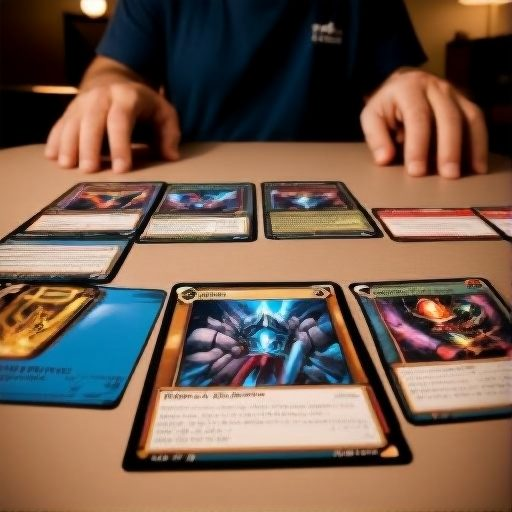
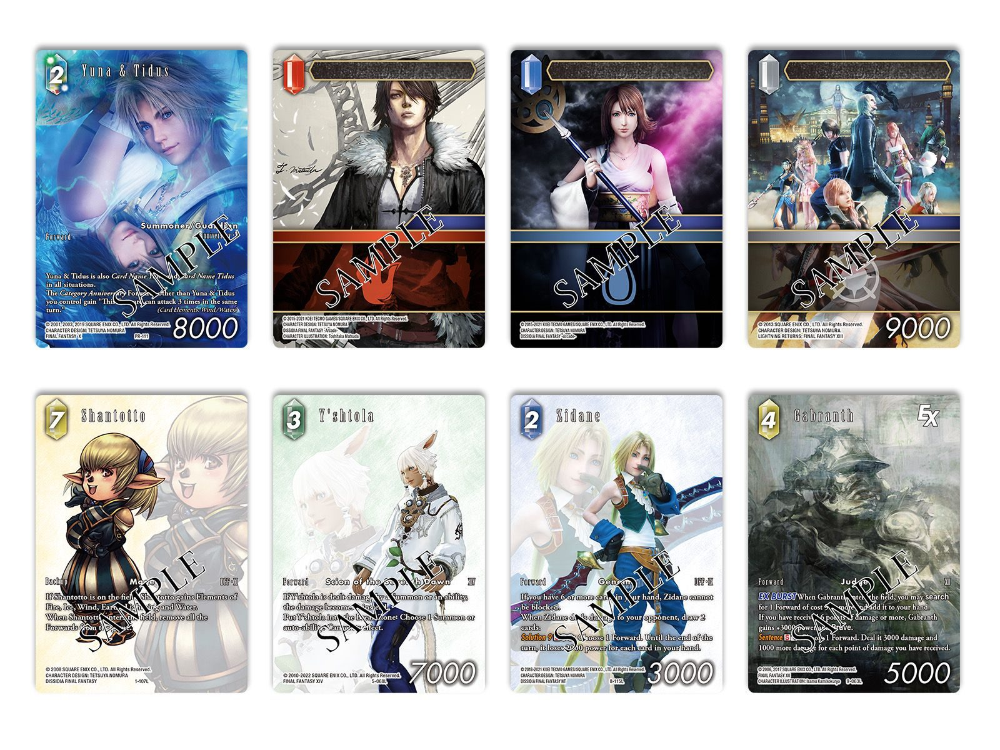

1 档 → φ60 critical w=0.4,0. 小吃单体呈扁平菱形块（或圆卷切段），表皮金黄且侧面切口处可见内部调味馅料考察知识：[solid] 咯吱盒以薄皮夹馅切块油炸，标志性形制为菱形块或切段，侧切面暴露馅料0 档：画成密封无切口的面点（如炸饺子、春卷）、球状丸子或无馅纯炸面片▶ 1 档：外形呈块状但无明显夹馅切口结构，或馅料包裹封闭未露于切面2 档：清晰呈现扁平菱形块或卷切段，两端或边缘切口露出内部馅料允许变体：呈圆卷切成的小短段（圆筒形咯吱盒），两端横截面露馅 | 最低可见条件：簸箕中最上方至少 2~3 块小吃整体及边缘切面清晰可见
1 档 → φ60 w=0.3,1. 外皮呈现绿豆面油炸特有的薄层酥脆、表面微膨起细密微小气泡的质感，无厚重面包糠颗粒考察知识：[solid] 咯吱盒采用薄绿豆面皮油炸，成熟后表皮薄脆起微泡，非西式厚面糊或面包糠裹粉0 档：外表呈明显西式裹面包糠颗粒、厚重湿面糊挂浆或光滑无孔硬壳▶ 1 档：金黄但质感偏向普通油炸面块，缺乏薄皮微膨起泡的酥松层次2 档：表皮薄而金黄酥松，表面带有明显的油炸微膨小细泡质感允许变体：表面炸至微带焦褐酥斑 | 最低可见条件：主体食物表面微观纹理清晰可辨
2 档 → φ100 w=0.3,2. 盛器旁配有传统中式蘸料（如清透蒜汁碟、椒盐粉小碟或香油醋汁），无西式番茄酱/蛋黄酱考察知识：[solid] 炸咯吱盒地道食用搭配为蒜汁或椒盐，属传统京味小吃风味搭配0 档：搭配明显西式酱料（如挤酱状番茄酱、黄色芥末酱、蛋黄沙拉酱），或无蘸料碟1 档：配有蘸料碟但盛装物模糊不可辨认，无法确认中西属性▶ 2 档：配有盛装蒜汁（可见蒜末或清亮调味汁）、椒盐粉等传统中式小料的瓷碟允许变体：蘸料碟内为辣椒油、生抽蒜泥等常见中式佐料 | 最低可见条件：蘸料碟及碟内调料在画面中清晰可见

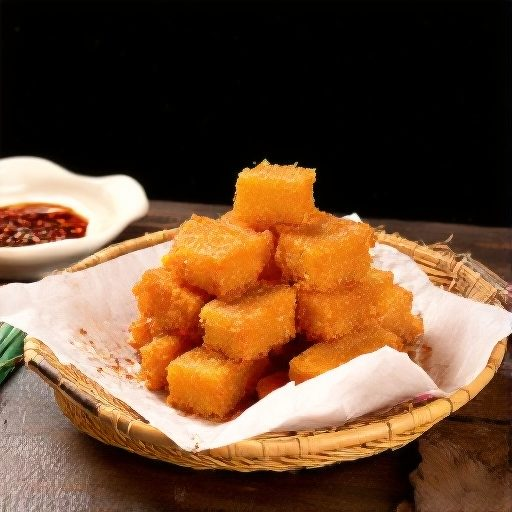
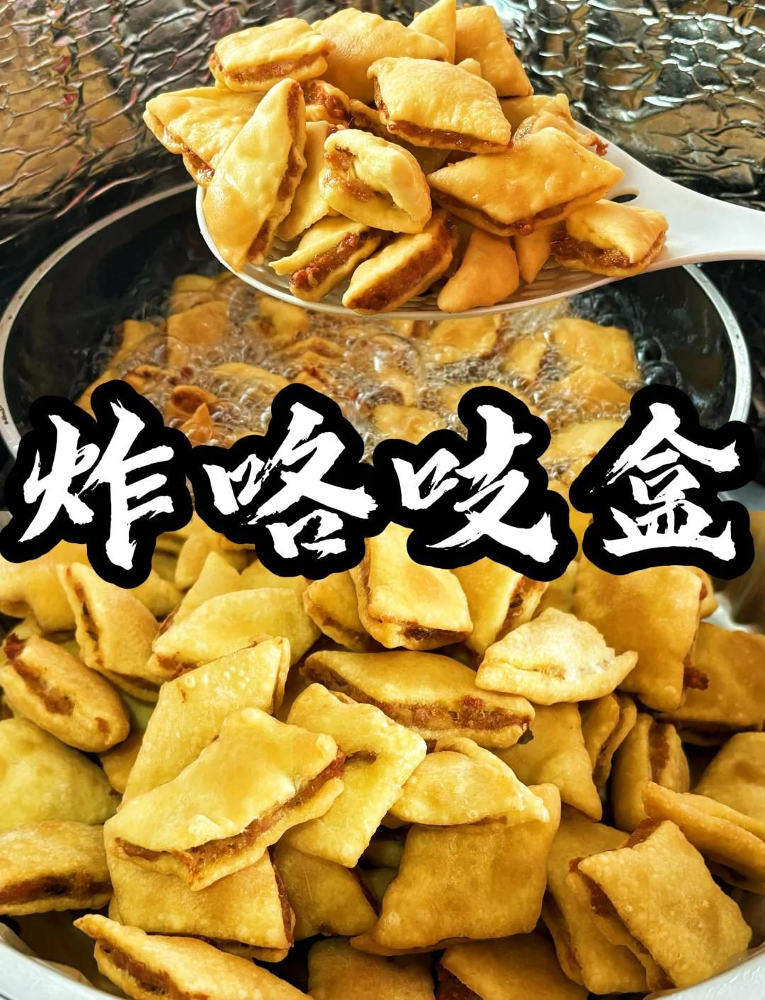

2 档 → φ100 critical w=0.4,0. 狮头呈南狮写意形制：额顶有独角，前额饰圆镜，双眼大而突出，大嘴可开合，头部缀绒球，而非写实狮子头或北狮造型考察知识：[solid] 广东醒狮属南狮，狮头以独角、额镜、大眼、开合嘴、绒球为规范特征，造型夸张写意，与北狮写实狮形及真狮明确区分0 档：画成真实狮子，或北狮式全身金毛写实狮头，无额镜、独角等南狮特征1 档：狮头为舞狮道具且造型夸张，但独角、额镜、绒球等南狮标志特征缺失过半或形制混杂▶ 2 档：狮头具备独角或额镜中至少一项，且有绒球、大眼、可开合大嘴，整体为清晰的南狮写意形制允许变体：狮头为红、黑、彩等其他传统配色（关公狮、张飞狮等，prompt 未限定颜色）；跃起动态中狮头微侧或仰起，但形制特征可辨 | 最低可见条件：狮头正面或侧面大部入画，额部与眼嘴区域可辨
2 档 → φ100 w=0.2,1. 狮身之下可见两名舞者共四条人腿（狮头舞者在前、狮尾舞者弯腰藏于狮被下），而非单人两腿或无人腿的独立生物考察知识：[solid] 醒狮由两名舞者合舞一狮：一人执狮头、一人俯身作狮尾，狮身下共呈现四条人腿0 档：狮身下无人腿（画成独立动物），或仅有两条人腿的单人狮1 档：可见人腿但数量不明确或结构混乱（如三条腿、人腿与兽腿混杂）▶ 2 档：清晰可见四条人腿分属前后两名舞者，狮尾处狮被下有弯腰舞者的身形隆起允许变体：跃起腾空动作中四腿呈踩桩或蹬跃姿态；狮尾舞者完全藏于狮被下，仅其两腿外露可辨 | 最低可见条件：醒狮全身及狮身下方腿部区域入画且未被前景完全遮挡
0 档 → φ0 w=0.2,2. 表演现场的'青'为绿色生菜（可附红包），悬挂于高处或置于表演位，而非绣球、水果、红布等其他物品考察知识：[solid] 采青程式中'青'的标准道具为绿色生菜，取'生菜'谐音'生财'，常附红包，分高青（悬挂）与地青（置地）两式▶ 0 档：画面无'青'，或'青'为绣球、水果、红包串等非生菜物品1 档：有悬挂或摆放的绿色植物状物体，但无法辨认为生菜（如模糊绿叶团、盆栽）2 档：可辨的绿色生菜作为'青'出现在悬挂点或表演位，形态清晰允许变体：生菜捆附红包或红绳；地青形式：生菜置于地面、凳上或桩上 | 最低可见条件：'青'所在位置入画且道具形态可辨
2 档 → φ100 w=0.2,3. 狮身为缀彩色毛边的布制狮被，舞者下肢穿与狮身同色系的狮裤和缀毛狮鞋，而非普通便裤与现代运动鞋考察知识：[solid] 南狮狮身为布制狮被缀毛边，配套服制为与狮身同色系的狮裤和毛边狮鞋，构成完整狮形0 档：舞者穿普通便裤、牛仔裤或现代运动鞋，狮身与人身服饰明显割裂1 档：狮被形制正确但舞者裤鞋无狮装特征，或狮裤狮鞋其一缺失▶ 2 档：布制毛边狮被 + 同色系狮裤 + 缀毛狮鞋齐备，狮身与舞者下肢浑然一体允许变体：狮裤带亮片或鳞纹装饰；狮鞋为绑带式缀毛软鞋 | 最低可见条件：狮身与至少一名舞者的下肢入画且服饰细节可辨

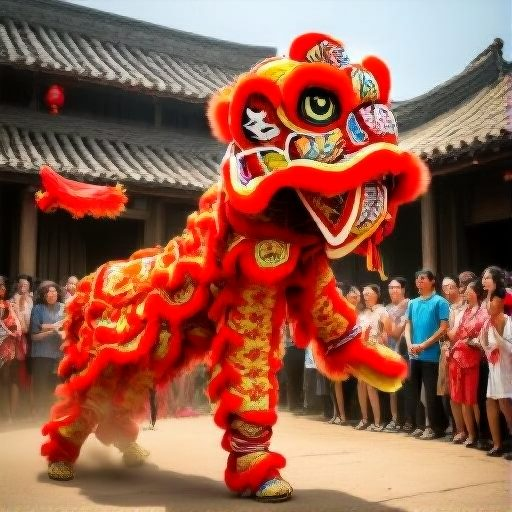
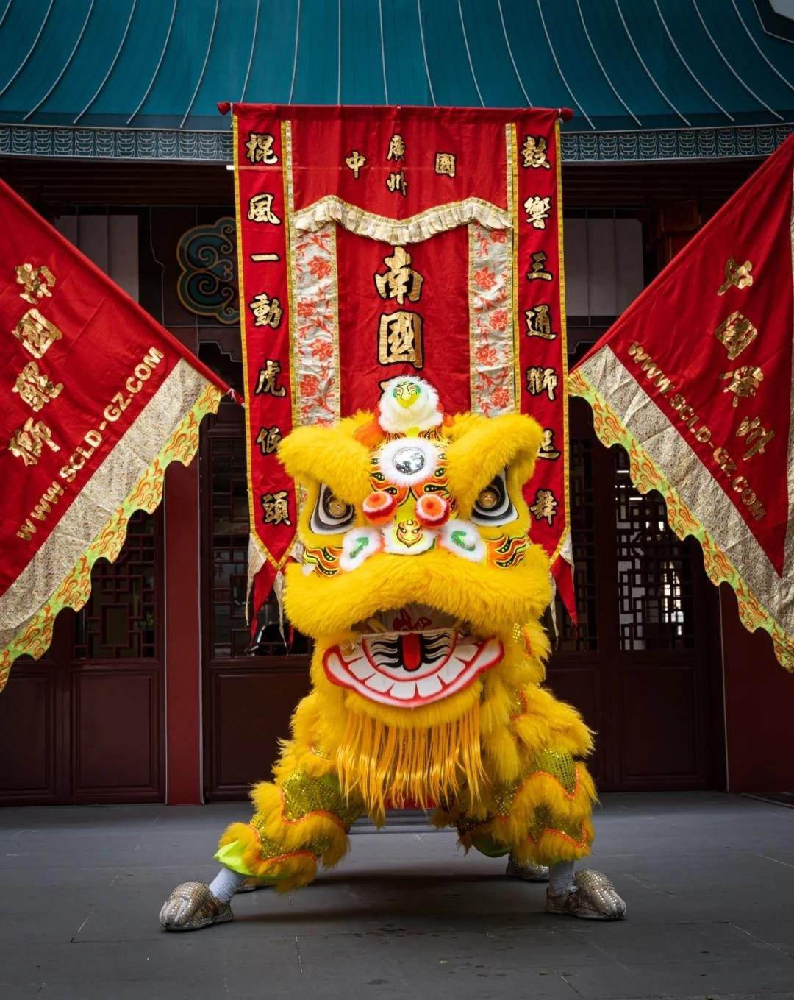

1 档 → φ60 critical w=0.6,0. 人物面部符合杜波依斯的标志性生物特征：非裔老年男性面孔、光头/前额大面积秃顶，留有修剪规整的八字胡与下巴山羊胡考察知识：[solid] W. E. B. 杜波依斯标志性公众外貌为非裔男性、光头/秃顶、具有辨识度的灰白/花白八字胡连带下巴山羊胡0 档：人物非非裔面孔，或画成浓密黑发的年轻人，或面部完全无胡须/大落腮胡，与杜波依斯特征严重不符▶ 1 档：为非裔老年男性，但胡型或发型缺失关键特征（如留有浓密全发，或胡须形制与标志性八字山羊胡明显不符）2 档：准确呈现非裔老年男性特征，具备明显的光头/高秃额头以及清晰修整的八字胡配下巴山羊胡允许变体：胡须颜色为灰白、花白或纯白；头部略微侧转或低头沉思，但光头轮廓与胡须形制依然清晰可辨 | 最低可见条件：人物头部与面部清晰正面或半侧面入画，五官及胡须细节无严重遮挡
1 档 → φ60 w=0.4,1. 人物着装与配饰符合20世纪上半叶绅士学者形制（正装西装、马甲三件套、衬衫领带或怀表链），无现代穿帮服饰考察知识：[solid] 20世纪中叶杜波依斯的经典学者着装规范为传统的西装马甲三件套或绅士正装，无现代T恤、卫衣或现代数码产品0 档：人物身穿现代休闲服（连帽衫、T恤、现代羽绒服等）或出现智能手机等现代穿帮道具▶ 1 档：着正装但形制现代简约（如无马甲的现代剪裁西装），缺少20世纪中叶经典历史质感2 档：身穿符合20世纪中叶特征的传统绅士正装（如带马甲的三件套西装、经典领带/领结、怀表链或老式眼镜）允许变体：手持老式板材/金属框眼镜或老式钢笔；西装为纯色深色料或细条纹粗花呢材质 | 最低可见条件：人物胸部及以上躯干服饰可见

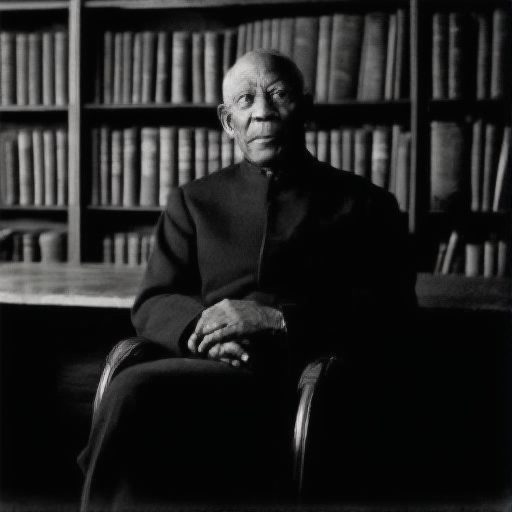
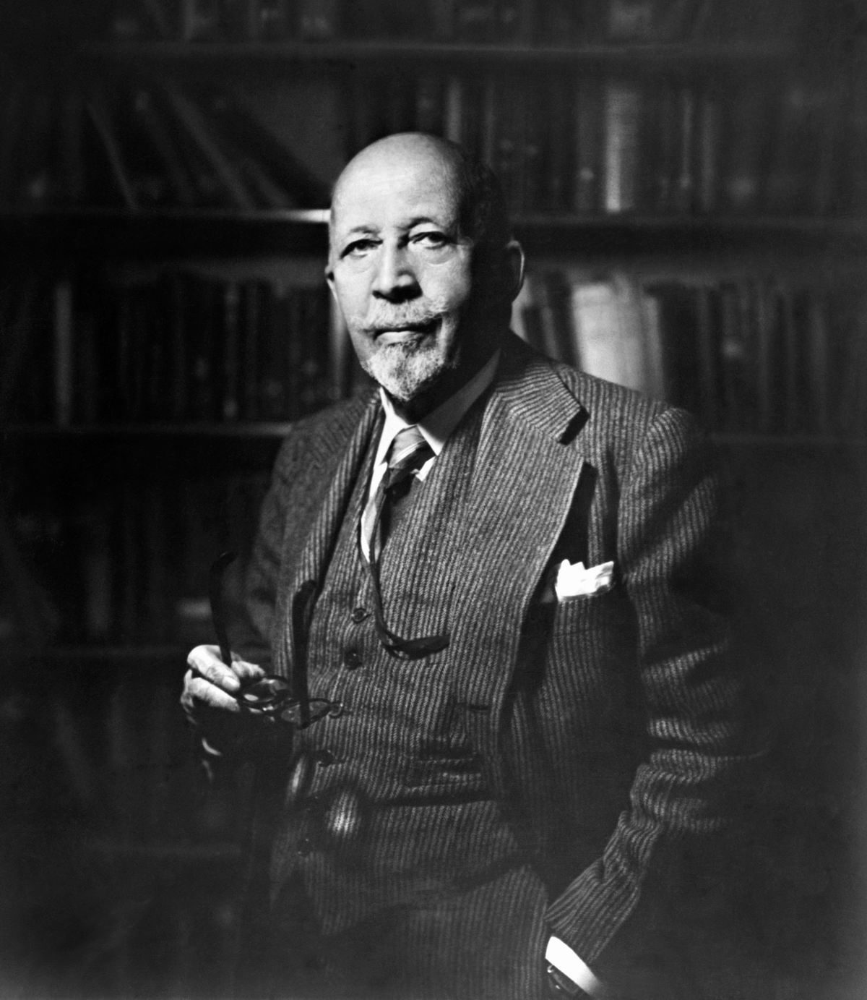

1 档 → φ60 critical w=0.5,0. 欧散克塔呈通体深黑或黑灰色的坚固高塔，由粗大多棱的石柱向上聚拢汇聚成塔身，塔体完整无坍塌损毁考察知识：[solid 规则] 欧散克塔由努曼诺尔黑色坚石筑成，四根多棱石柱聚合，外力与洪水无法损毁其本体；[prompt 假设] 经历水淹与冰封 → [第1步] 塔身依然保持黑色多棱柱聚拢的原貌且无结构性损毁坍塌0 档：未画出高塔，或画成浅色/红砖欧式普通城堡、残垣断壁式塌方废墟▶ 1 档：塔身整体偏黑但缺乏多棱柱聚拢的欧散克塔特征，或塔身有大面积开裂倒塌2 档：准确呈现深黑/墨黑色坚石质感、多棱柱聚合的耸立高塔形态，塔身挺拔完整允许变体：塔身表面结有霜华或少量冰挂，但黑石材质与柱状形制清晰可辨；塔尖部分隐入寒雾或画面顶部截断，但可见塔身中下段形制准确 | 最低可见条件：高塔至少展现中下部主体，材质与柱状轮廓清晰可辨
1 档 → φ60 w=0.3,1. 塔基周围为大面积平整封冻的冰面，具有冰层反光、冰裂纹或薄雪覆盖的冰原特征，而非流动活水或普通泥土干地考察知识：[solid 规则] 艾辛格盆地水淹后遇极寒，水体迅速结为厚冰；[prompt 假设] 洪水彻底冻结 → [第2步] 塔底周围环绕平整的开阔硬质冰层0 档：地面为流动波浪、干涸泥土草地或普通无水岩石，无任何冰封平原特征▶ 1 档：地面有水或有雪，但未形成开阔平整的硬质封冻冰面（如仅为零星小水洼或松散雪堆）2 档：塔周地面呈现大面积平整冻结的冰面，可见冰层反光、浅层裂纹或冰面微倒影允许变体：冰面上覆盖一层薄积雪或霜层，但底层平整冰面与反光结构仍可辨；冰面边缘存在部分冲积而来的残木杂物被冻结在冰层中 | 最低可见条件：塔底周围开阔地面清晰可见且地表介质质感可判
2 档 → φ100 w=0.2,2. 画面环境呈现清冷严寒的冬日氛围，冷色调光照与寒雾自洽笼罩冰封平原考察知识：[solid 规则] 极寒冰封环境下空气湿度遇冷凝结为寒雾，晨光呈冷白或微弱冷金色调0 档：画面呈现暖洋洋的热带日光、烈火余烬或盛夏明艳色调，无严寒冰封气候特征1 档：色调偏冷但无雾气或光影与冰面反射不协调▶ 2 档：冷色调（青灰/冰蓝/冷白）主导，寒雾弥漫与晨光映照冰面的光影逻辑严密允许变体：极光或微弱冷金色晨曦穿透雾气照射局部，但整体基调仍保持严寒冷寂 | 最低可见条件：全景光影氛围与环境背景整体可辨

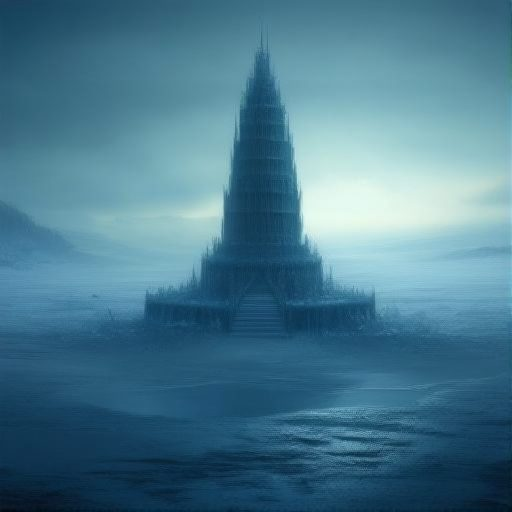
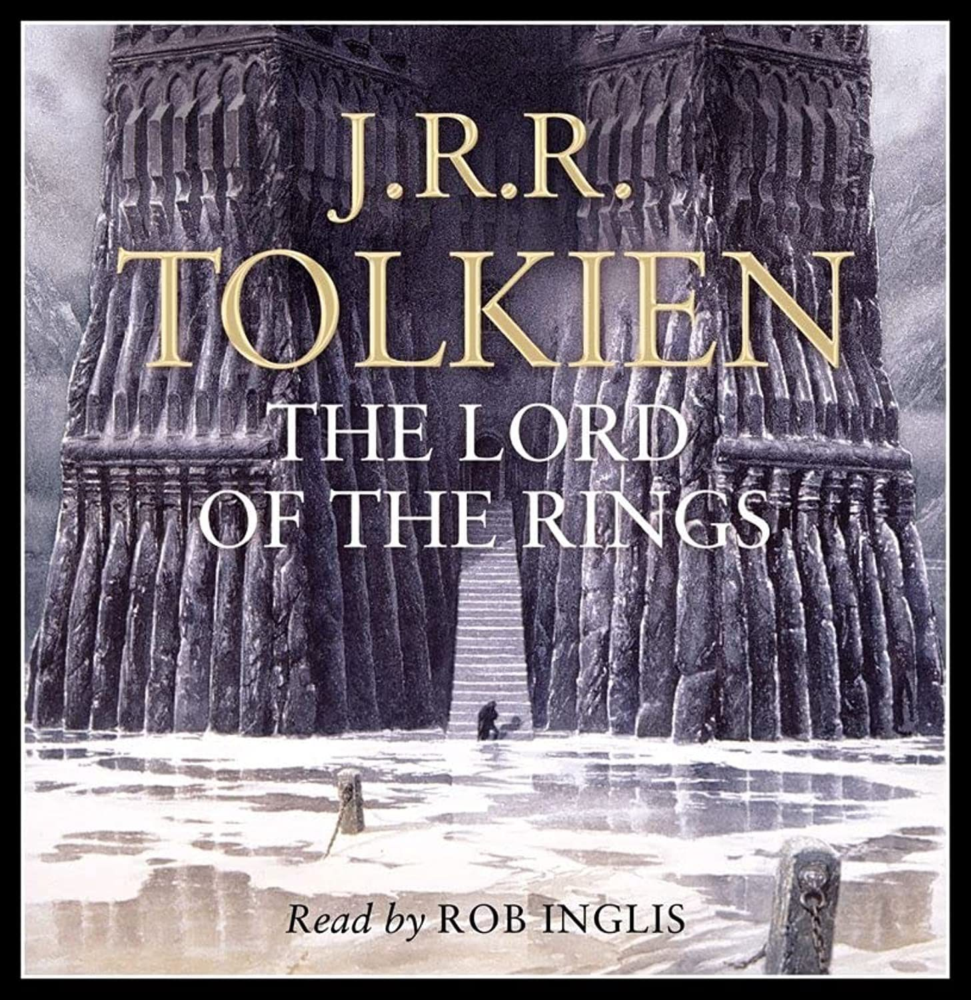

1 档 → φ60 critical w=0.6,0. 人物呈现杜波依斯在1940年代的可识别晚年面貌：年长非裔男性、秃顶、清瘦脸形并留灰白色短髭与山羊胡考察知识：[solid] 杜波依斯生于1868年，1940年代已超过七十岁；其晚年历史肖像具有秃顶、清瘦面容、灰白短髭与山羊胡等稳定视觉特征0 档：面部不可辨，或人物并非年长非裔男性，或整体外貌明显对应其他人物而无法识别为杜波依斯▶ 1 档：属于年长非裔男性且具部分相似特征，但秃顶、清瘦脸形或灰白山羊胡中有多项缺失2 档：年长非裔身份、秃顶、清瘦脸形、灰白短髭与山羊胡均清晰呈现，整体可识别为晚年杜波依斯允许变体：人物可以佩戴眼镜、手持眼镜或不呈现眼镜；胡须可因黑白照明呈白色、浅灰色或银灰色 | 最低可见条件：人物头部与正面或四分之三侧面面容须清晰可辨，额头、头顶及下半脸均需入画
2 档 → φ100 w=0.4,1. 桌边办公器具符合1940年代技术形制，不呈现个人电脑、平板电脑、智能手机或现代数码显示设备考察知识：[solid] 1940年代文稿办公依赖手动打字机、旋转拨号电话、钢笔、铅笔及机械式台灯；个人电脑、平板电脑与智能手机当时尚不存在0 档：办公器具完全不可见，或清晰出现个人电脑、平板电脑、智能手机等现代数码设备1 档：可见办公器具但年代形制无法辨认，或同期器具与明显现代设备同时出现在桌边▶ 2 档：至少一件办公器具清晰符合1940年代形制，且桌边未出现任何明确的现代数码设备允许变体：手动打字机、旋转拨号电话、钢笔、铅笔或机械式台灯均可作为同期器具；同期器具可以位于桌面、桌侧柜或人物手中 | 最低可见条件：桌边至少一件办公器具须有足够面积，可辨认其轮廓与技术形制

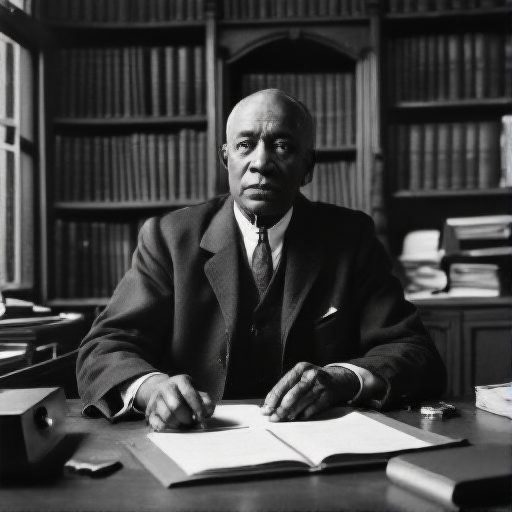
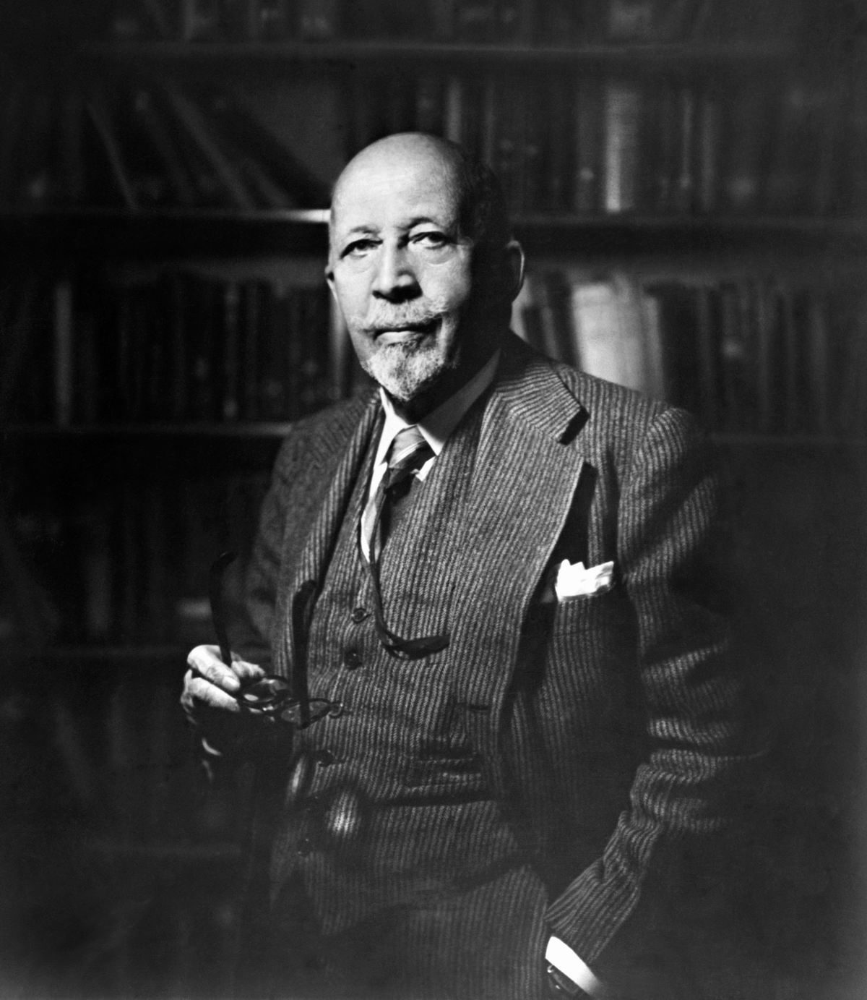

2 档 → φ100 critical w=0.5,0. 国际空间站具有长横向桁架、成组圆柱形舱段和多组宽大矩形太阳能电池阵列考察知识：[solid] 国际空间站是模块化轨道设施，其标志性结构由长横向桁架、多个圆柱形加压舱段及多组大型矩形太阳能电池阵列构成0 档：空间站缺失或不可辨，或被画成单体圆盘、火箭、环形站等不同类型设施1 档：可辨为国际空间站，但长桁架、圆柱舱段、成组矩形太阳翼中至少一类缺失或形制错误▶ 2 档：长横向桁架、成组圆柱舱段及多组宽大矩形太阳翼全部清楚呈现允许变体：太阳翼因受光角度呈金色、棕色、铜色或近黑色；采用安装有 iROSA 新太阳翼的现役国际空间站配置；局部结构被其他舱段遮挡，但三类标志性结构均有可辨部分 | 最低可见条件：空间站主体大部分入画，桁架、舱段和太阳翼均达到可辨尺寸
1 档 → φ60 w=0.3,1. 停靠载具呈联盟号的短粗串联舱段轮廓，服务舱两侧各展开一块矩形太阳能电池板考察知识：[solid] 联盟号飞船由轨道舱、钟形返回舱和仪器服务舱依次串联，服务舱两侧配置一对矩形太阳能电池板0 档：停靠载具缺失，或画成有翼航天飞机、单体胶囊、货运飞船等非联盟号形制▶ 1 档：载具具有联盟号式短粗轮廓，但串联舱段或两侧矩形太阳翼仅呈现其中一项2 档：短粗串联舱段与服务舱两侧一对矩形太阳翼同时清楚呈现允许变体：轨道舱因连接空间站而被接口结构部分遮挡；透视缩短使三个舱段相互重叠，但串联关系仍可辨；一侧太阳翼因观察角度显得较窄 | 最低可见条件：停靠飞船至少一半外形可见，且舱段轮廓与太阳翼位置能够辨认
2 档 → φ100 w=0.2,2. 地球边缘呈可辨弧形，并有狭薄蓝色大气层边缘与外侧黑色太空相接考察知识：[solid] 国际空间站运行于近地轨道；从该高度的广角视野观察地球边缘，可见地球曲率和薄层大气辉光，而大气层外的天空为黑色0 档：背景被画成地面视角的平直地平线与蓝色天空，或地球边缘和黑色太空均不可辨1 档：黑色太空存在，但弧形地球边缘与狭薄大气层边缘仅有一项清楚可辨▶ 2 档：弧形地球边缘、狭薄蓝色大气层边缘及外侧黑色太空三者同时可辨允许变体：强曝光使大气层薄边呈白蓝色或青蓝色；云层覆盖大部分地表，但地球弧形边缘仍然可辨 | 最低可见条件：画面包含一段足以判断曲率的地球边缘，并同时保留其外侧太空区域

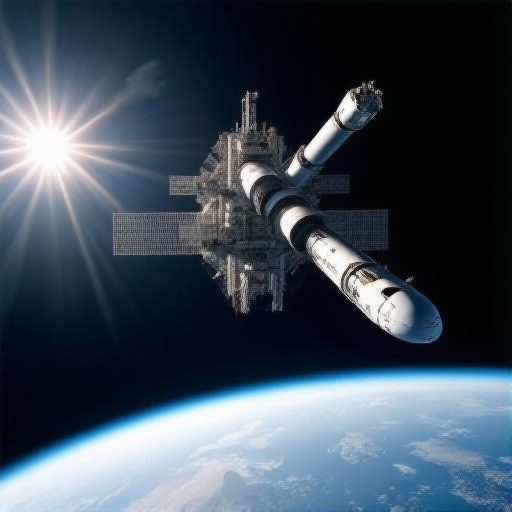
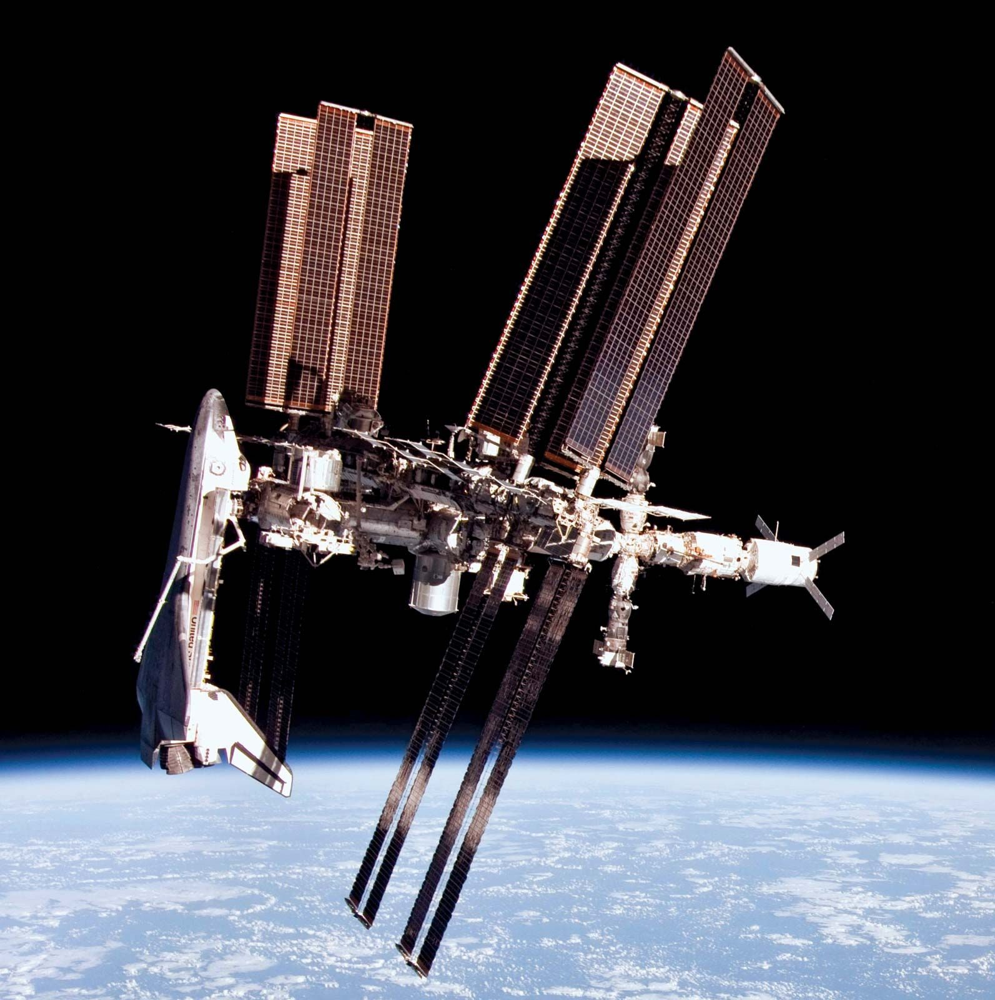

2 档 → φ100 critical w=0.5,0. 峡谷横截面呈现典型的冰川 U 型槽谷形态（两侧崖壁陡峭耸立，谷底开阔平坦），而非流水侵蚀的尖锐 V 型狭缝考察知识：[solid 规则] 峡湾由冰川侵蚀而成，本质为 U 型槽谷；[prompt 假设] 海水退去露出谷底 → [第1步] 暴露出的谷底宽阔平坦；[第2步] 峡谷整体剖面维持平底陡壁的 U 形地貌0 档：峡谷画成两侧斜坡汇聚成狭窄尖角的 V 形流水峡谷，或谷底极度狭窄无法容纳宽阔地表1 档：谷底有一定宽度，但横截面呈不规则斜坡，U 型平底与陡壁的冰川地貌特征不明显▶ 2 档：峡谷呈现清晰的 U 型槽谷特征：两侧崖壁几近垂直高耸，谷底平坦宽阔，车队通行空间开阔允许变体：谷底局部有冰碛小丘或巨型漂砾起伏，但整体槽底开阔平缓形态明确 | 最低可见条件：画面清晰展现峡谷两侧崖壁下延至谷底地面的整体结构
2 档 → φ100 w=0.3,1. 崖壁上的悬谷瀑布从高崖直坠跌落至谷底干涸地面/碎石滩，落差贯穿崖壁全程考察知识：[solid 规则] 峡湾瀑布来自高处悬谷；[prompt 假设] 水面退去至谷底基岩 → [第1步] 瀑布落点向下延伸至陆地谷底；[第2步] 水流撞击谷底地面并散开成细流或水雾0 档：瀑布半空断流悬空消失，或依然落入大面积的深水海湾中（未响应干涸前提）1 档：瀑布延伸至谷底，但落点处缺乏与陆地岩石碰撞的水雾/水花或径流交代▶ 2 档：瀑布完整垂落至谷底干燥地面或砾石滩，落点处有清晰的水雾迸溅或小径流汇入允许变体：瀑布因季节性水量较小呈细丝水雾状飘散至谷底；瀑布落入谷底的小水潭后溢出流淌 | 最低可见条件：至少一道瀑布从崖壁上段至谷底落点的全貌清晰可见
2 档 → φ100 w=0.2,2. 谷底地表展现陆地基岩、冰碛砾石或干燥冲积地面，无原峡湾深邃汪洋水体考察知识：[solid 规则] 冰川槽谷基底由基岩与沉积碎屑构成；[prompt 假设] 海水完全退去 → [第1步] 原水下区域转化为固态陆地地表，支持车辆行驶0 档：谷底仍然大面积充斥深蓝/墨绿色的原生态深水海面，车队悬浮或在水上航行1 档：谷底大半为泥泞沼泽或大范围浅水湖，陆地道路特征模糊不清▶ 2 档：谷底为明确的坚实陆地地表（裸露基岩、砾石地、干燥碎石土），车队在地面行驶痕迹清晰允许变体：谷底存在细小浅窄的辫状溪流，但不影响整体陆地槽底性质 | 最低可见条件：车队所在谷底地表材质与形态清晰可辨

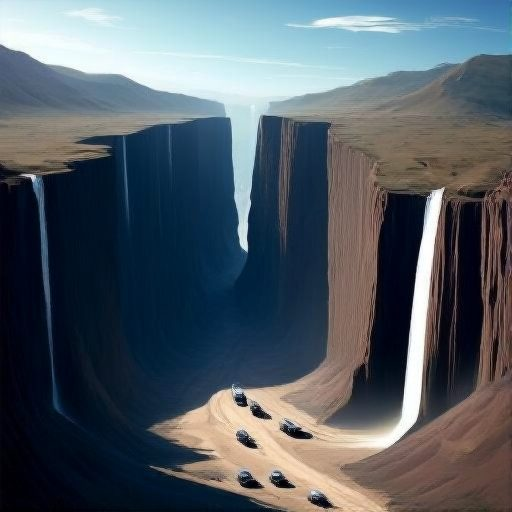
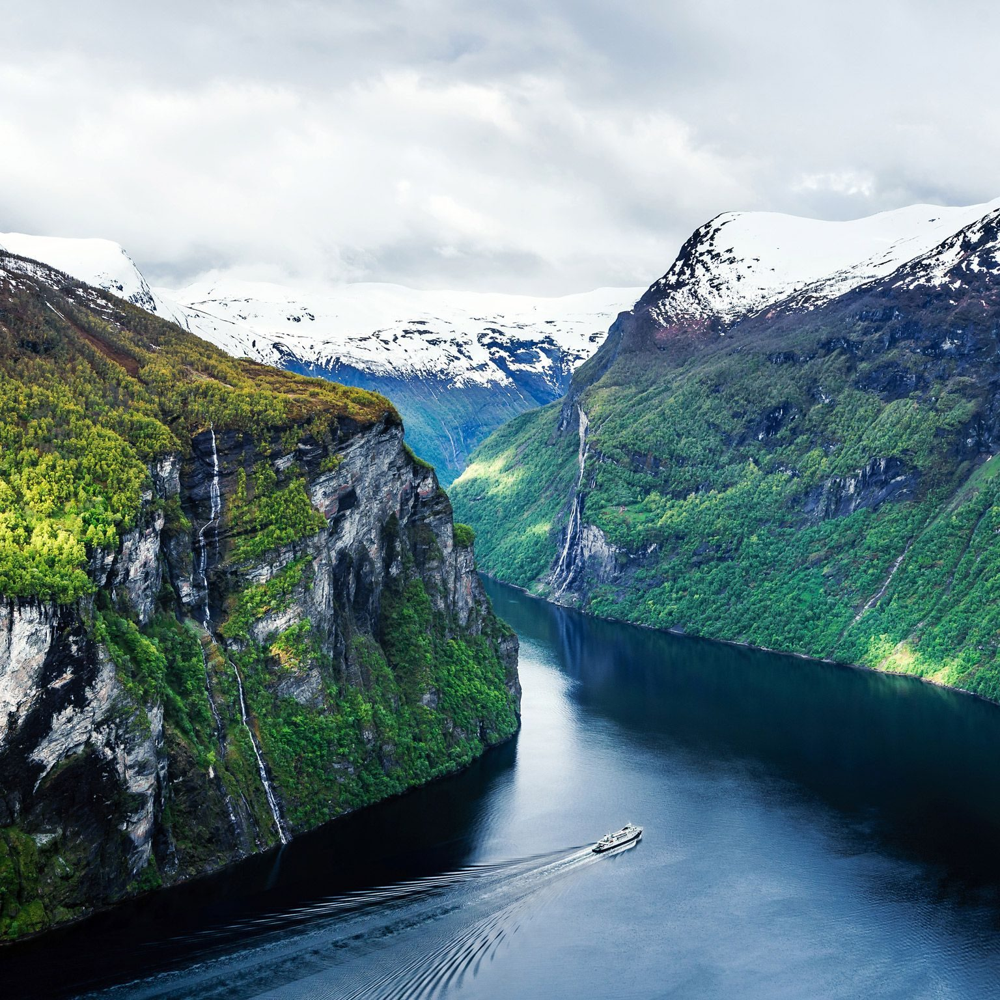

2 档 → φ100 critical w=0.4,0. 阿胶成品呈长方形或方形的扁平块状固体，而非丸剂、粉末、膏状或糕点形态考察知识：[solid] 阿胶为驴皮熬制的胶类中药，成品规范形制为长方形或方形扁平块0 档：画成药丸、胶囊、粉末、膏状液体，或画成含坚果碎的阿胶糕点1 档：为块状固体但形制明显偏离，如不规则碎块、厚实立方体或圆饼状▶ 2 档：呈规整的长方形或近方形扁平块，边角平直，符合胶块规范形制允许变体：切得较小的近方形小块（药典允许方形块）；多块间呈扇形或叠放等不同摆放方式 | 最低可见条件：至少一块胶块完整入画且轮廓形状可辨
2 档 → φ100 w=0.3,1. 胶块颜色为乌黑至深棕褐色，表面平滑并有反光光泽考察知识：[solid] 阿胶块规范外观为乌黑至深棕褐色，表面平滑具光泽0 档：颜色明显错误，如亮红色、金黄色、乳白色或灰色1 档：色调接近但偏浅棕/偏红，或表面完全哑光粗糙无任何光泽▶ 2 档：乌黑至深棕褐色，表面平滑光亮，反光符合胶体表面特征允许变体：表面带有印字压痕或细密工艺纹理；强光下局部高光偏亮，但整体色调仍为深棕褐至乌黑 | 最低可见条件：至少一块胶块正面朝向镜头且色泽与表面反光可辨
2 档 → φ100 w=0.3,2. 胶块呈硬脆胶质质感：块体边缘或薄处呈半透明琥珀棕色透光感（或断面光亮），而非巧克力、木块或糕点质感考察知识：[solid] 阿胶质硬而脆、断面光亮，薄处对光呈半透明琥珀棕色，为凝固动物胶质感0 档：呈软糯膏状、多孔糕点或哑光巧克力/木质等完全非胶质的质感1 档：为硬质块状但通体不透明且无光亮断面，胶质特征不可辨▶ 2 档：边缘或薄处可见半透明琥珀棕透光感，或断面呈玻璃状光亮，胶质特征明确允许变体：块体较厚导致仅边角处呈现轻微透光；以光亮平整的断面反光体现胶质，而非透光 | 最低可见条件：至少一块胶块的边缘、薄处或断面在光照下可辨

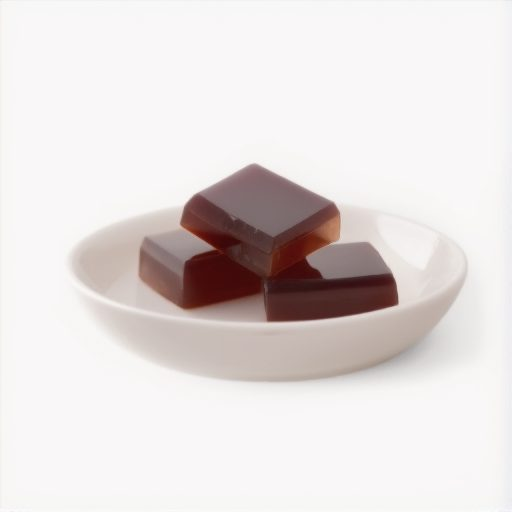
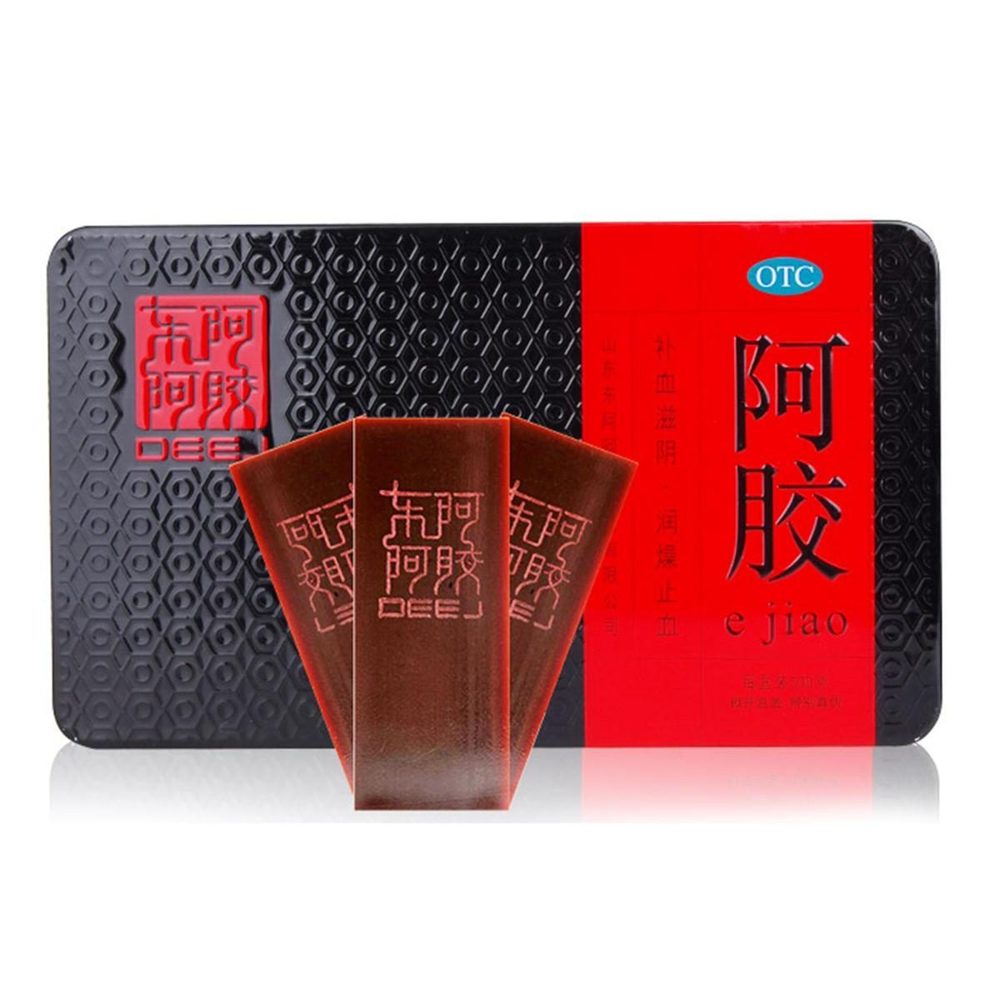

2 档 → φ100 critical w=0.4,0. 群像由中央一名成年男子、两侧各一名青年组成，共有两条海蛇跨越并缠绕三人考察知识：[solid] 《拉奥孔与儿子们》表现特洛伊祭司拉奥孔与两个儿子遭两条海蛇共同袭击，规范身份结构是一名成年男子、两名青年和两条蛇0 档：人物数量、年龄结构、位置关系或海蛇数量中有两项以上错误，无法识别为拉奥孔群像1 档：整体可识别但有一项错误或模糊，例如仅一名儿子、仅一条蛇或成年男子不居中央▶ 2 档：中央成年男子与两侧两名青年清楚齐备，且两条海蛇跨越并缠绕三名人物允许变体：两个儿子可因透视呈前后错位，不要求左右镜像对称；人物或蛇可被彼此局部遮挡，但总数与连接关系仍能辨认 | 最低可见条件：三名人物的头部与大部分躯干入画，且两条海蛇均有可追踪的连续身体部分
2 档 → φ100 w=0.3,1. 人物披布的未固定末端与可活动的头发末梢朝画面上方偏转，贴身或受压部分仍贴近身体考察知识：[solid 规则] 柔软物体的自由端会沿有效重力方向垂落；[prompt 假设] 重力竖直反转向上且人物姿态固定 → [第1步] 披布自由端与可活动发梢朝上方偏转，受约束部分保持贴身0 档：可见披布自由端和发梢均向下垂落，或全部保持普通向下重力状态1 档：仅披布或头发呈明确向上偏转，另一类方向混乱、水平展开或难以辨认▶ 2 档：披布自由端与可活动发梢均明确朝上偏转，同时贴身受压部分保持接触允许变体：短卷发只需外层发梢上扬，不要求整片头发竖直；被手臂、蛇身或身体压住的披布与头发无需朝上偏转 | 最低可见条件：至少一处披布自由端和一处人物发梢清晰可见，并能判断其相对上下方向
2 档 → φ100 w=0.3,2. 海蛇未受约束的头部或尾段向画面上方弯曲，缠在人身上的蛇段仍保持接触考察知识：[solid 规则] 失去主动运动能力的细长柔性身体会依有效重力与接触约束被动变形；[prompt 假设] 海蛇受向上重力且已有部分缠住人物 → [第1步] 自由蛇段向上弯曲，受缠绕约束的蛇段仍贴近人物0 档：海蛇自由段整体向下垂落，或全部蛇身脱离人物漂浮而无缠绕接触1 档：自由蛇段仅部分向上或方向混乱，缠绕段与人物的接触关系仍可辨认▶ 2 档：至少一处头部或尾段明确向上弯曲，且多处缠绕蛇段继续贴住人物身体允许变体：只呈现蛇头或蛇尾中的一种自由段向上弯曲；缠绕紧密的蛇段可保持原曲线，仅未受约束部分需要响应反向重力 | 最低可见条件：至少一条海蛇同时露出未受约束的自由段与贴住人物的缠绕段

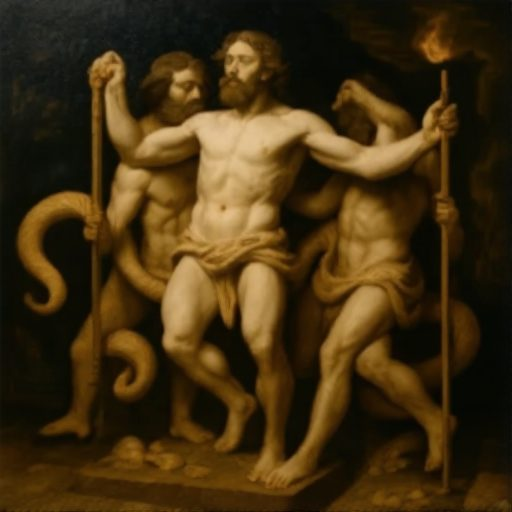
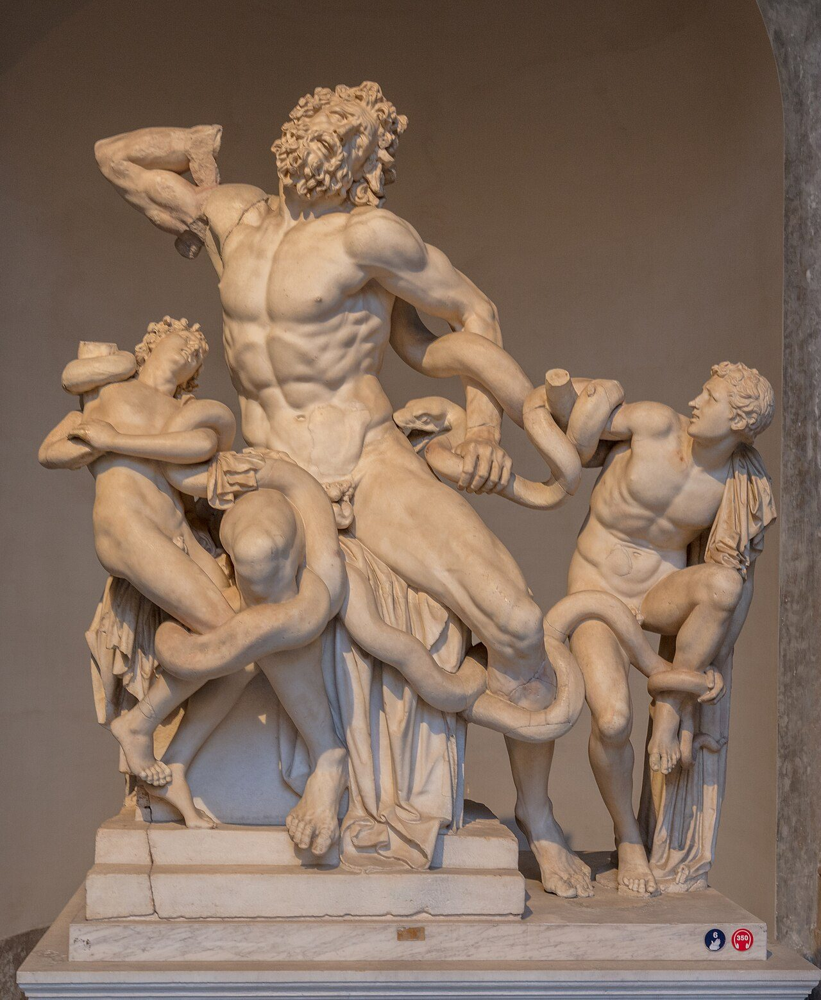

In [3]:
# ---- 逐题明细：得分 + 原因 ----
import re, io, base64
from PIL import Image
from IPython.display import display, HTML

try:
    import eval_score as _es
    _FACET_CRIT = {k: crit for k, _pillar, _sub, crit in _es.FACETS}
except Exception:
    _FACET_CRIT = {}

REPO_ROOT = Path('..').resolve().parent          # benchmark/t2i → 仓库根
BLOBS_DIR = REPO_ROOT / 'datasets' / 'demiwtg' / 'blobs'
IMG_W = 300
SCORE2_COLOR = {0: '#a33333', 1: '#b07020', 2: '#2a7a4b'}

def _resolve_sample(img_rel):
    '''题库 _sample_image → 路径；RESP_DIR/../.. 数据区优先，缺失回退 blobs 内容寻址'''
    base = Path('data')
    p = base / img_rel
    if p.exists():
        return p
    m = re.search(r'_([a-f0-9]{8,})\.[a-z]+$', img_rel or '')
    if m:
        d = BLOBS_DIR / m.group(1)[:2]
        if d.exists():
            hits = sorted(d.glob(f'{m.group(1)}*'))
            if hits:
                return hits[0]
    return None

def _img(path, title='', w=IMG_W):
    p = Path(path) if path else None
    if not p or not p.exists():
        return (f'<figure style="margin:4px"><figcaption style="color:#999">'
                f'（{title} 图缺失）</figcaption></figure>')
    buf = io.BytesIO()
    Image.open(p).convert('RGB').save(buf, format='JPEG', quality=82)
    uri = base64.b64encode(buf.getvalue()).decode()
    return (f'<figure style="margin:4px;text-align:center">'
            f'<img src="data:image/jpeg;base64,{uri}" style="max-width:{w}px;max-height:{w}px">'
            f'<figcaption style="font-size:12px;color:#666">{title}</figcaption></figure>')

def _chip(text, bg, fg='#fff'):
    return (f'<span style="background:{bg};color:{fg};border-radius:3px;padding:1px 6px;'
            f'font-size:11px;margin-right:4px">{_esc(text)}</span>')

def _grade_chip(s):
    if not (isinstance(s, int) and s in (0, 1, 2)):
        return _chip('未判', '#999')
    return _chip(f'{s} 档 → φ{PHI[s]}', SCORE2_COLOR[s])

def _judge_json(raw):
    i = (raw or '').find('{')
    if i < 0:
        return None
    try:
        return json.JSONDecoder().raw_decode(raw[i:])[0]
    except Exception:
        return None

def _score_chain(s):
    k, g = s.get('knowledge_score'), s.get('general_score')
    ks, gs = _fmt(k), _fmt(g)
    raw_total = (0.7 * k + 0.3 * g) if (k is not None and g is not None) else k
    caps = []
    if s.get('gate_capped'): caps.append('gate 主体缺失/跑偏 → 封顶 20')
    if s.get('critical_capped'): caps.append('critical check 0 档 → 封顶 20')
    if s.get('knowledge_fused'): caps.append(f'知识线 {ks} < 40 → 熔断封顶 20')
    chain = (f'知识 <b>{ks}</b> ×0.7 + 通用 <b>{gs}</b> ×0.3 = {_fmt(raw_total)}'
             if g is not None else f'通用线缺失，总分退化 = 知识线 <b>{ks}</b>')
    if caps:
        chain += '　→　' + '　→　'.join(_esc(c) for c in caps)
    t = s.get('total')
    chain += (f'　→　<b style="font-size:15px;color:{_score_color(t)}">总分 {_fmt(t)}</b>')
    return f'<div style="background:#f6f8fa;border-left:3px solid #4a7ab5;padding:6px 10px;margin:6px 0;font-size:13px">{chain}</div>'

def _check_table(q, s):
    checks = q.get('implicit_checks') or []
    if not checks:
        return ''
    cs = s.get('check_scores') or {}
    out = []
    for i, c in enumerate(checks):
        sc = cs.get(str(i), cs.get(i))
        rub = c.get('rubric') or {}
        rub_html = []
        for lvl in ('0', '1', '2'):
            txt = rub.get(lvl)
            if txt is None:
                continue
            hit = isinstance(sc, int) and str(sc) == lvl
            rub_html.append(
                f'<div style="margin:1px 0 1px 12px;{"background:#fff3cd;font-weight:bold" if hit else "color:#777"}">'
                f'{"▶ " if hit else ""}{lvl} 档：{_esc(txt)}</div>')
        head = (f'<tr><td style="vertical-align:top;padding:4px 8px;border-top:1px solid #eee">'
                f'{_grade_chip(sc)}{" " + _chip("critical", "#a33333") if c.get("critical") else ""}'
                f'{" " + _chip("w=%g" % c["weight"], "#607a93") if c.get("weight") is not None else ""}'
                f'</td><td style="padding:4px 8px;border-top:1px solid #eee">'
                f'<b>{i}. {_esc(c.get("check", ""))}</b>'
                f'<div style="color:#555;font-size:12px">考察知识：{_esc(c.get("knowledge", ""))}'
                f'{"" if c.get("verified", True) else " ⚠未验证"}</div>'
                f'{"".join(rub_html)}')
        extras = []
        if c.get('acceptable_variants'):
            extras.append('允许变体：' + '；'.join(str(x) for x in c['acceptable_variants']))
        if c.get('visibility_requirement'):
            extras.append('最低可见条件：' + str(c['visibility_requirement']))
        if extras:
            head += f'<div style="color:#888;font-size:12px;margin-left:12px">{_esc(" | ".join(extras))}</div>'
        out.append(head + '</td></tr>')
    return ('<details open><summary style="cursor:pointer;margin-top:8px"><b>知识线逐 check（judge 档位 + rubric 判据）</b></summary>'
            '<table style="border-collapse:collapse;font-size:13px;width:100%">' + ''.join(out) + '</table></details>')

def _facet_table(q, s):
    fs = s.get('facet_scores') or {}
    if not fs:
        return ''
    chips = []
    for k in sorted(fs):
        v = fs[k]
        chip = _grade_chip(v) if isinstance(v, int) and v in (0, 1, 2) else _chip(f'{k}: {v}', '#999')
        crit = _FACET_CRIT.get(k)
        chips.append(f'<div style="margin:2px 0">{chip} <b>{_esc(k)}</b>'
                     + (f' <span style="color:#777;font-size:12px">{_esc(crit)}</span>' if crit else '')
                     + '</div>')
    return (f'<details><summary style="cursor:pointer;margin-top:8px"><b>通用线维度（{len(fs)} 项）</b></summary>'
            '<div style="font-size:13px;margin:4px 0 4px 8px">' + ''.join(chips) + '</div></details>')

def _judge_analysis(s):
    raw = s.get('raw') or ''
    obj = _judge_json(raw)
    prose = (raw[:raw.find("{")].strip() if "{" in raw else raw.strip())
    parts = []
    if prose:
        parts.append(f'<details open><summary style="cursor:pointer;margin-top:8px"><b>judge 分析原文（得分理由）</b></summary>'
                     f'<pre style="white-space:pre-wrap;font-size:12px;background:#fafafa;padding:8px">{_esc(prose)}</pre></details>')
    gate = (obj or {}).get('gate') or {}
    if s.get('gate_reason') or gate:
        parts.append(f'<div style="font-size:13px;margin-top:6px">gate：'
                     f'{"❌ 主体缺失/跑偏" if gate.get("subject_missing") else "✅ 通过"}'
                     + (f'　{_esc(s.get("gate_reason") or gate.get("reason") or "")}</div>' if (s.get('gate_reason') or gate.get('reason')) else ''))
    parts.append(f'<details><summary style="cursor:pointer;margin-top:6px"><b>judge 完整原始输出</b></summary>'
                 f'<pre style="white-space:pre-wrap;font-size:12px;background:#fafafa;padding:8px">{_esc(raw)}</pre></details>')
    return ''.join(parts)

for row in sel:
    q, r, s, qid = row['q'], row['r'], row['s'], row['qid']
    if q is None:
        display(HTML(f'<h3>{_esc(qid)}</h3><div style="color:#c00">不在题库中，无法展开明细</div><hr>'))
        continue
    gen_p = (RESP_DIR / r['image']) if (r and r.get('ok') and r.get('image')) else RESP_DIR / 'imgs' / f'{qid}.png'
    sample_p = _resolve_sample(q.get('_sample_image') or '')
    col = DIFF_COLOR.get(q.get('difficulty'), '#666')
    badges = ''
    if s.get('gate_capped'): badges += _chip('gate→20', '#a33333')
    if s.get('critical_capped'): badges += _chip('critical→20', '#c0392b')
    if s.get('knowledge_fused'): badges += _chip('知识熔断→20', '#b07020')
    if row['n_checks'] and row['n_scored'] == 0:
        badges += _chip('judge 未输出 checks', '#a33333')
    elif 0 < row['n_scored'] < row['n_checks']:
        badges += _chip('checks 仅判 %d/%d' % (row['n_scored'], row['n_checks']), '#b07020')
    t = s.get('total')
    head = (f'<h3 style="margin:18px 0 4px">{_esc(qid)} '
            f'<span style="color:{col}">{_esc(q.get("difficulty", "?"))}</span> · '
            f'{_esc(_gen_prefix(qid))} · {_esc(q.get("knowledge_dim", "?"))} · '
            f'<span style="color:{_score_color(t)}">总分 {_fmt(t)}</span> {badges}</h3>'
            f'<div style="color:#666;font-size:12px">样本：{_esc(q.get("_query_label") or "")}'
            f'（{_esc(q.get("sample_id") or "")}）· 出题模型 {_esc(q.get("_generator_model") or "?")}'
            + (f' · 推理 {r.get("seconds")}s' if r and r.get('seconds') is not None else '') + '</div>')
    if row.get('s_b'):
        tb = row['s_b'].get('total')
        head += (f'<div style="font-size:12px;color:#607a93">对照 judge（{_esc(LABEL_B)}）总分：'
                 f'<b style="color:{_score_color(tb)}">{_fmt(tb)}</b>'
                 + ('　🚫 gate：' + _esc((row['s_b'].get('gate_reason') or '')[:60])
                    if row['s_b'].get('gate_capped') else '') + '</div>')
    pics = ('<div style="display:flex;gap:12px;align-items:flex-start">'
            + _img(gen_p, '模型生成') + _img(sample_p, '样本参照') + '</div>')
    prompt = f'<div style="background:#f6f6f6;padding:6px 8px;margin:6px 0;font-size:13px"><b>生成提示</b>：{_esc(q.get("gen_prompt", ""))}</div>'
    if row['n_checks'] and row['n_scored'] == 0:
        warn = ('<div style="background:#fdecea;border-left:3px solid #a33333;padding:6px 10px;'
                'font-size:13px;margin:6px 0"><b>⚠ judge 未输出 knowledge_checks</b>：以下 check '
                '全部按 <b>0 档（φ=0）缺省计入</b>，知识线/熔断/封顶均为缺省推定——'
                '不能当作「Bagel 没画对」的结论，请结合图片人工复核。</div>')
    elif 0 < row['n_scored'] < row['n_checks']:
        warn = ('<div style="background:#fff8e1;border-left:3px solid #b07020;padding:6px 10px;'
                f'font-size:13px;margin:6px 0"><b>⚠ judge 仅输出 {row["n_scored"]}/{row["n_checks"]} '
                '项 check 档位</b>，未输出项按 0 档缺省计入。</div>')
    else:
        warn = ''
    meta = []
    if q.get('gate_spec'):
        gs = q['gate_spec']
        meta.append(f'gate_spec: required_subjects={gs.get("required_subjects")} · 主题={gs.get("theme_definition")}')
    if q.get('expected_failure_modes'):
        meta.append('expected_failure_modes: ' + '；'.join(str(x) for x in q['expected_failure_modes']))
    if q.get('notes'):
        meta.append('notes: ' + str(q['notes']))
    if s.get('facet_diagnostic'):
        meta.append('facet_diagnostic: ' + str(s['facet_diagnostic']))
    meta_html = (f'<details><summary style="cursor:pointer;margin-top:6px"><b>题目元信息</b></summary>'
                 f'<div style="font-size:12px;color:#555;margin-left:8px">'
                 + ''.join(f'<div>{_esc(m)}</div>' for m in meta) + '</div></details>') if meta else ''
    display(HTML(head + pics + prompt + warn + _score_chain(s) + _check_table(q, s)
                 + _facet_table(q, s) + _judge_analysis(s) + meta_html))
    display(HTML('<hr>'))

## eval_models_v55 · 判官校准实验：10 条脚本检查 + 4 项通用保真 逐格对比

- 两张案例图：`0022`（gemini-flash-lite-image 生成，真值＝**假镜像 + HYUNDRI 错拼**，风格写实）、`0023`（gpt-image-2 生成，真值＝**过度渲染/海报化**，徽标正确）——真值来自 gpt-5.6-sol 判分 + 独立盲审双重确认
- 数据源 `data/eval_models_v55/judge_compare.json`（2026-08-29 判官实验汇总，只读）；「原判」= 线上 gemini-3.7-flash 未校准，其余均为证据优先校准版
- 配色：红=0 Fail / 橙=1 Pass / 绿=2 Excel / 灰=N/A 或未判。重点看 `fg_physics`（0022）与 `fg_realism`（0023）两格谁判得出 0
- 本格零 API 调用，Run 即可

In [ ]:
# ---- 判官对比卡（只读展示；数据=judge_compare.json + 题库 + 原判分产物）----
import json, io, base64, html as _html
from pathlib import Path
from PIL import Image
from IPython.display import display, HTML

BD   = Path('data/eval_models_v55')
qs   = {q['qid']: q for q in (json.loads(l) for l in open('data/eval_bagel_v55/questions.jsonl', encoding='utf-8') if l.strip())}
cmp_ = json.load(open(BD/'judge_compare.json', encoding='utf-8'))
FK   = cmp_['fg_keys']
FLAB = {'fg_text':'图内文字','fg_physics':'锁定物理','fg_realism':'渲染保真','fg_structure':'结构完整'}
IMGS = {'0022-L3-01': BD/'imgs/gemini-3.1-flash-lite-image/0022-L3-01.png',
        '0023_L3_01': BD/'imgs/gpt-image-2/0023_L3_01.png'}
GENS = {'0022-L3-01':'gemini-3.1-flash-lite-image', '0023_L3_01':'gpt-image-2'}
GT   = {'0022-L3-01':'真值：镜像是假车（几何不对应）、墙面字样 HYUNDRI 错拼、镜像结构不对应；写实风格无误',
        '0023_L3_01':'真值：高饱和海报化/CG 过度渲染、繁简混用；徽标/物理/结构正确'}
COLOR = {0:'#c0392b', 1:'#e67e22', 2:'#27ae60'}

def _badge(s):
    if s is None or s == '':   return '<span style="color:#bbb">—</span>'
    if s == 'N/A':             return '<span style="background:#aaa;color:#fff;padding:0 6px;border-radius:3px;font-size:12px">N/A</span>'
    return f'<span style="background:{COLOR.get(s,"#999")};color:#fff;padding:0 6px;border-radius:3px;font-size:12px">{s}</span>'

def _img(p, w=300):
    im = Image.open(p).convert('RGB'); im.thumbnail((w*2, w*2))
    buf = io.BytesIO(); im.save(buf, 'JPEG', quality=82)
    return f'<img src="data:image/jpeg;base64,{base64.b64encode(buf.getvalue()).decode()}" style="width:{w}px;border:1px solid #ddd;border-radius:4px">'

judges = list(cmp_['judges'].keys())
for qid in ['0022-L3-01', '0023_L3_01']:
    q = qs[qid]
    scr_judges = [j for j in judges if (cmp_['judges'][j].get(qid) or {}).get('scripted')]
    head = ('<div style="border:1px solid #ccc;border-radius:6px;padding:10px;margin:14px 0">'
            f'<div style="font-weight:700;font-size:15px">{qid} × 生成模型 {GENS[qid]}</div>'
            f'<div style="color:#a33333;font-size:12px;margin:2px 0">{GT[qid]}</div>'
            f'<div style="color:#555;font-size:13px;margin:4px 0">题面：{_html.escape(q["gen_prompt"])}</div>')
    body = [f'<div style="display:flex;gap:14px"><div>{_img(IMGS[qid])}</div><div style="flex:1">']
    # --- 10 条脚本检查 ---
    body.append('<b>① 脚本保真检查 ×10</b>（列＝判官）<table style="border-collapse:collapse;font-size:12px;margin:4px 0"><tr><th style="text-align:left;padding:2px 6px">检查</th>'
                + ''.join(f'<th style="padding:2px 6px;border-left:1px solid #eee">{_html.escape(j)}</th>' for j in scr_judges) + '</tr>')
    for i, c in enumerate(q['fidelity_checks']):
        body.append(f'<tr><td style="padding:2px 6px;max-width:340px">[{i+1}] {_html.escape(c["check"][:72])}</td>'
                    + ''.join(f'<td style="padding:2px 6px;text-align:center;border-left:1px solid #eee">{_badge(cmp_["judges"][j][qid]["scripted"][i])}</td>' for j in scr_judges)
                    + '</tr>')
    body.append('</table>')
    # --- 4 项通用保真 ---
    body.append('<b>② 通用保真 ×4</b>（fg_text 图内文字 / fg_physics 锁定物理 / fg_realism 渲染保真 / fg_structu 结构完整）<table style="border-collapse:collapse;font-size:12px;margin:4px 0"><tr><th style="text-align:left;padding:2px 6px">项</th>'
                + ''.join(f'<th style="padding:2px 6px;border-left:1px solid #eee">{_html.escape(j)}</th>' for j in judges) + '</tr>')
    for k_i, k in enumerate(FK):
        body.append(f'<tr><td style="padding:2px 6px">{FLAB[k]}</td>'
                    + ''.join(f'<td style="padding:2px 6px;text-align:center;border-left:1px solid #eee">{_badge((cmp_["judges"][j].get(qid) or {}).get("fg",[None]*4)[k_i]) if (cmp_["judges"][j].get(qid) or {}).get("fg") else "<span style=color:#bbb>—</span>"}</td>' for j in judges)
                    + '</tr>')
    body.append('</table>')
    # --- 关键判官理由 ---
    for j in judges:
        rec = cmp_['judges'][j].get(qid) or {}
        reasons = rec.get('fg_reasons') or {}
        if not reasons: continue
        body.append(f'<details style="font-size:12px;margin:2px 0"><summary style="cursor:pointer;color:#25648a">{_html.escape(j)} · 通用保真证据</summary><ul style="margin:2px 0 2px 18px">'
                    + ''.join(f'<li><b>{FLAB.get(k,k)}</b>：{_html.escape(v)[:220]}</li>' for k, v in reasons.items() if v)
                    + '</ul></details>')
    body.append('</div></div></div>')
    display(HTML(head + ''.join(body)))
